## Importing Packages

Import The Packages Needed To Run The Code

In [1]:
import time
import pandas as pd
import numpy as np
import datetime
import statsmodels.api as sm
import matplotlib.pyplot as plt
import re
import math
import geopandas as gpd
import utm
import requests
from scipy.stats import norm
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from shapely.geometry import Point, MultiPolygon
from shapely.geometry import Point, Polygon
from shapely.geometry import Point, MultiLineString
from shapely import wkt
import seaborn as sns
from statsmodels.stats.diagnostic import het_breuschpagan, het_white
from statsmodels.stats.diagnostic import linear_reset
from scipy.stats import norm
from scipy.stats import kurtosistest
from scipy.stats import skewtest
from heatmap import heatmap, corrplot
#!pip install --upgrade numpy==1.21
from haversine import haversine, Unit
import requests
import warnings
warnings.filterwarnings('ignore')
## Esta librería no te servirá en este análisis, pero
## es la librería básica para scrapear páginas más sencillas
from sklearn.cluster import KMeans
import folium
from folium import plugins
from folium.plugins import MarkerCluster
from PIL import Image
from bs4 import BeautifulSoup as bs
import undetected_chromedriver as uc
import pandas as pd
from io import StringIO
from statsmodels.stats.outliers_influence import variance_inflation_factor
from shapely.geometry import Point, MultiPolygon
from shapely.geometry import Point, Polygon
from shapely.geometry import Point, MultiLineString
from shapely import wkt
from shapely.wkt import loads

In [2]:
"Calculate Time To Run The Code"
start = time.time()

## Loading Data From Github

The Code Below Retrieves The Housing-Specific Variables and Sustainable Variables from The Github Repository


In [3]:
url_housing_specific_variables = "https://raw.githubusercontent.com/NielsUPF/Thesis-MIIS-The-Price-Impact-of-Sustainability-on-Housing-Prices-in-Barcelona/main/Data/Model_Data/housing_specific_variables.xlsx"
content_housing_specific = requests.get(url_housing_specific_variables).content
df_housing_specific_features = pd.read_excel(content_housing_specific)
df_housing_specific_features.set_index('id', inplace=True)

url_ecological_variables = "https://raw.githubusercontent.com/NielsUPF/Thesis-MIIS-The-Price-Impact-of-Sustainability-on-Housing-Prices-in-Barcelona/main/Data/Model_Data/ecological_variables.xlsx"
content_ecological = requests.get(url_ecological_variables).content
df_ecological_features = pd.read_excel(content_ecological)

url_environmental_variables = "https://raw.githubusercontent.com/NielsUPF/Thesis-MIIS-The-Price-Impact-of-Sustainability-on-Housing-Prices-in-Barcelona/main/Data/Model_Data/environmental_variables.xlsx"
content_environmental = requests.get(url_environmental_variables).content
df_environmental_features = pd.read_excel(content_environmental)

url_social_variables = "https://raw.githubusercontent.com/NielsUPF/Thesis-MIIS-The-Price-Impact-of-Sustainability-on-Housing-Prices-in-Barcelona/main/Data/Model_Data/social_variables.xlsx"
content_social = requests.get(url_social_variables).content
df_social_features = pd.read_excel(content_social)

url_cultural_variables = "https://raw.githubusercontent.com/NielsUPF/Thesis-MIIS-The-Price-Impact-of-Sustainability-on-Housing-Prices-in-Barcelona/main/Data/Model_Data/cultural_variables.xlsx"
content_cultural = requests.get(url_cultural_variables).content
df_cultural_features = pd.read_excel(content_cultural)

url_economic_financial_variables = "https://raw.githubusercontent.com/NielsUPF/Thesis-MIIS-The-Price-Impact-of-Sustainability-on-Housing-Prices-in-Barcelona/main/Data/Model_Data/economic_financial_variables.xlsx"
content_economic_financial = requests.get(url_economic_financial_variables).content
df_economic_financial_features = pd.read_excel(content_economic_financial)

df_features = df_housing_specific_features.merge(df_ecological_features, left_index=True, right_on='id')
df_features = df_features.merge(df_environmental_features, on='id')
df_features = df_features.merge(df_social_features, on='id')
df_features = df_features.merge(df_cultural_features, on='id')
df_features = df_features.merge(df_economic_financial_features, on='id')
df_features.set_index('id', inplace=True)

"Create Dummy Variable For 2nd-5th Floor"
df_features['2nd-5th Floor'] = df_features['2nd Floor'] + df_features['3th Floor'] + df_features['4th Floor'] + df_features['5th Floor']
df_features.head(2)

,Building surface m²,Flat,Penthouse,Duplex,House,1st Floor,2nd Floor,3th Floor,4th Floor,5th Floor,...,AVG income household,AVG unemployment rate %,Gini Index,sq(Income Distribution P80/P20),sq(Gini Index),sq(AVG income household),sq(AVG unemployment rate %),Income Distribution PCA Component 1,Income & Unemployment PCA Component 1,2nd-5th Floor
id,,,,,,,,,,,,,,,,,,,,,
31702050,50,1,0,0,0,0,0,0,0,0,...,0.683838,0.0385,0.372069,0.113499,0.138435,0.467634,0.001482,0.248544,0.341626,0
33148486,85,1,0,0,0,1,0,0,0,0,...,0.683838,0.0385,0.372069,0.113499,0.138435,0.467634,0.001482,0.248544,0.341626,0


## Rename Column Names

Renaming Of The Variables In Line With How They Are Named In The Pricing Models/Research Paper

*housing-specific variables*

In [4]:
df_features= df_features.rename(columns={'Second hand/needs renovating': "Needs renovation",'Second hand/good condition':'Good condition', 'Parking included': 'Parking space included' })

*ecological variables*

In [5]:
df_features = df_features.rename(columns={'Distance to nearest highway': 'Distance to Highway (km)', 'Bus stations PCA Component 1': 'Bus PCA Component 1', 'Train stations PCA Component 1':
                       'Train PCA Component 1', 'Metro stations PCA Component 1': 'Metro PCA Component 1'
                    , 'Highway & Train stations PCA Component 1': 'Highway & Train PCA Component 1','Bus & Metro stations PCA Component 1' : 'Bus & Metro PCA'
                         ,'Nearest Highway or Train':'Distance to Highway/Train (km)'      })

*environmental variables*

In [6]:
df_features = df_features.rename(columns={'Distance to nearest beach': 'Distance to Beach (km)', 
                                'level_of_heat_comfort_score':'Heat comfort level (1-7)',
                                'Parks and Gardens PCA Component 1': 'Park & Garden PCA',
                                'Viewpoints PCA Component 1': 'Viewpoint PCA',
                                'vulnerable_factor_heatimpact_score': 'Vulnerable to heat impact (1-5)' })

*social variables*

In [7]:
df_features = df_features.rename(columns={'social_cohesion_score': 'Social Cohesion Score', 'Life expectancy': 'Life Expectancy',
                                'Police Stations PCA Component 1': 'Police PCA',
                                'Bars and Restaurant PCA Component 1': 'Bar & Restaurant PCA','Education University PCA Component 1':  'University PCA',
                                'Pharmacies & Hospitals and Cliniques PCA Component 1':'Pharmacy, Hospital & Clinique PCA Component 1'
                                , 'Shopping Places PCA Component 1': 'Big Shopping Place PCA',
                                
       'Education Primary and Secundary School PCA Component 1': 'Primary & Secundary School PCA Component 1'
        ,'Education Secundary School & University PCA Component': 'Secundary School & University PCA Component' ,
                                'Education Primary School and Lower PCA Component 1':'Primary School & Lower PCA Component 1'
                   ,'Education Secundary School PCA Component 1': 'Secundary School PCA Component 1',
                        'Education Secundary School and Lower PCA Component 1':'Secondary & Lower School PCA'
                                ,'Pharmacies PCA Component 1': 'Pharmacy PCA', 'Hospitals and Cliniques PCA Component 1': 'Hospital & Clinique PCA'
                               
                               
                               })

*cultural variables*

In [8]:
df_features = df_features.rename(columns={'Museums and Libraries PCA Component 1':'Museum & Library PCA Component 1',
                                'Religious Institutions PCA Component 1':
                               'Religious Institution PCA', 'Cinemas, Theatres and Concerts PCA Component 1': 'Performing Arts PCA',
                               'Point of interest culture PCA Component 1': 'POI Culture PCA Component 1',
                               'Museum, Library & POI Culture PCA Component 1': 'Museum, Library & POI Cult. PCA'})
                                

*environmental variables*

In [9]:
df_features = df_features.rename(columns={'AVG income household': 'AVG Income Household (€)', 
                          'AVG unemployment rate %':    'AVG Unemployment Rate (%)',
                              'Income Distribution P80/P20': 'Income Distribution P80/P20 ratio',
                               'Income & Unemployment PCA Component 1': 'Income & Unemployment PCA',
                            'Income Distribution PCA Component 1':'Income Distribution PCA'   })
                                

## Rescale Variables

Rescaling Of The Variables in Line With The Pricing Models

In [10]:
df_features["Natural population growth ‰"] = df_features["Natural population growth %"] * 1000
df_features["Net immigration rate ‰"] = df_features["Net immigration rate %"] * 1000 
df_features['Density ((hab/1000)/ha)'] = df_features['Density (hab/ha)'] / 1000
df_features['Density net ((hab/1000)/ha)'] = df_features['Density net (hab/ha)']/1000
df_features['Neighboorhood size (10 ha)'] = df_features['Neighboorhood size (ha)'] / 10

## Identification of Outliers And Treatment Housing-Specific  Variables

The Code Below Checks for Outliers in the Dummy and Continious Housing-Specific Variables. </br>
Outlier Treatment is Applied As Described In Section 3.1 Of Thesis: Housing-Specific Data

**Defining Continious and Dummy Housing-Specific Variables**

In [11]:

continious_features = ['Building surface m²','Building age', 'Price', 'Log price' #'bedrooms', 'bathrooms',#'price,' 
                       ]
dummy_features = ['House',
 'Mezzanine',
                  'Ground Floor',
 '1st Floor',
 '2nd-5th Floor',
 '6th Floor or higher',
 'New housing development','Good condition',
 'Needs renovation',
 'Elevator',
 'Terrace',
 'Heating',
 'Outdoor facilities',
 'Parking space included',
 'Energy label consumption A',
 'Energy label consumption B',
 'Energy label consumption C',
                  'Energy label consumption D',
 'Energy label consumption E',
 'Energy label consumption F',
 'Energy label consumption G',
 'District Eixample',
 'District Ciutat Vella',
 'District Sant Martí',
 'District Sants-Montjuïc',
 'District Horta Guinardó',
 'District Gràcia',
 'District Les Corts',
 'District Nou Barris',
 'District Sarrià-Sant Gervasi',
 'District Sant Andreu']

### Outlier Treatment Housing-Specific Dummy Variables 

*Step 1: Summary Statistic Housing-Specific Dummy Variables*

In [12]:
df_features[[*dummy_features[:20]]].describe()

,House,Mezzanine,Ground Floor,1st Floor,2nd-5th Floor,6th Floor or higher,New housing development,Good condition,Needs renovation,Elevator,Terrace,Heating,Outdoor facilities,Parking space included,Energy label consumption A,Energy label consumption B,Energy label consumption C,Energy label consumption D,Energy label consumption E,Energy label consumption F
count,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000
mean,0.039063,0.048057,0.102356,0.221558,0.481375,0.107591,0.037251,0.816833,0.145916,0.743875,0.343110,0.525539,0.574669,0.125042,0.024230,0.025908,0.042755,0.091147,0.377743,0.065508
std,0.193751,0.213894,0.303126,0.415309,0.499670,0.309874,0.189382,0.386816,0.353034,0.436506,0.474764,0.499364,0.494410,0.330778,0.153767,0.158866,0.202310,0.287828,0.484839,0.247428
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [13]:
df_features[[*dummy_features[20:]]].describe()

,Energy label consumption G,District Eixample,District Ciutat Vella,District Sant Martí,District Sants-Montjuïc,District Horta Guinardó,District Gràcia,District Les Corts,District Nou Barris,District Sarrià-Sant Gervasi,District Sant Andreu
count,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000,14899.000000
mean,0.127324,0.209007,0.161353,0.102624,0.102759,0.081885,0.064904,0.046043,0.060205,0.112424,0.058796
std,0.333347,0.406613,0.367869,0.303478,0.303653,0.274198,0.246364,0.209586,0.237875,0.315898,0.235250
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


*Step 2: Histograms Housing-Specific Dummy Variables*

Histogram for: House


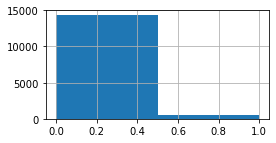



Histogram for: Mezzanine


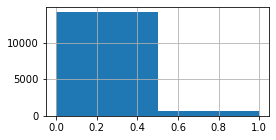



Histogram for: Ground Floor


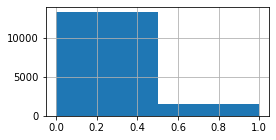



Histogram for: 1st Floor


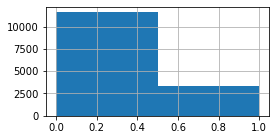



Histogram for: 2nd-5th Floor


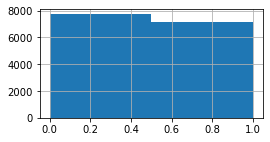



Histogram for: 6th Floor or higher


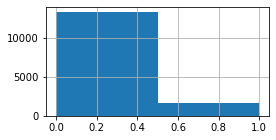



Histogram for: New housing development


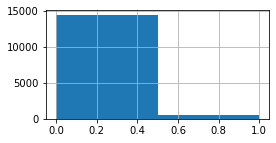



Histogram for: Good condition


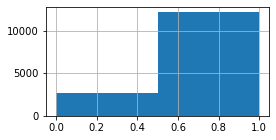



Histogram for: Needs renovation


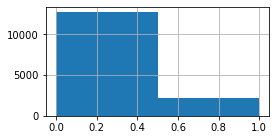



Histogram for: Elevator


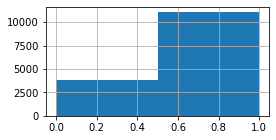



Histogram for: Terrace


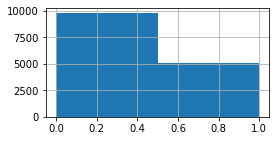



Histogram for: Heating


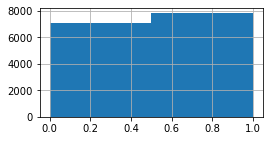



Histogram for: Outdoor facilities


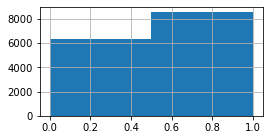



Histogram for: Parking space included


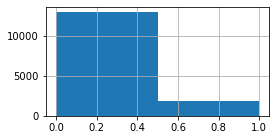



Histogram for: Energy label consumption A


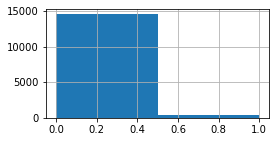



Histogram for: Energy label consumption B


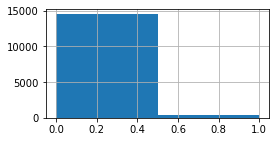



Histogram for: Energy label consumption C


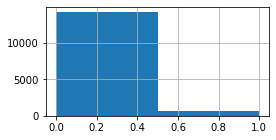



Histogram for: Energy label consumption D


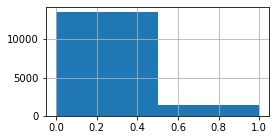



Histogram for: Energy label consumption E


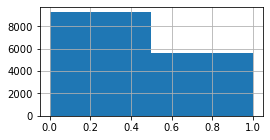



Histogram for: Energy label consumption F


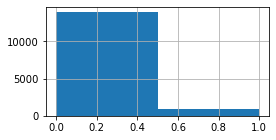



Histogram for: Energy label consumption G


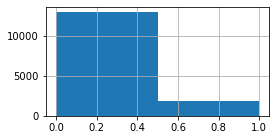



Histogram for: District Eixample


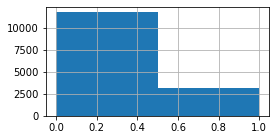



Histogram for: District Ciutat Vella


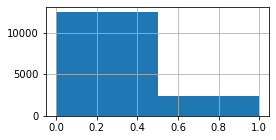



Histogram for: District Sant Martí


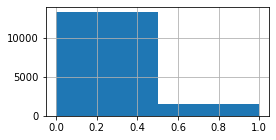



Histogram for: District Sants-Montjuïc


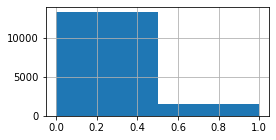



Histogram for: District Horta Guinardó


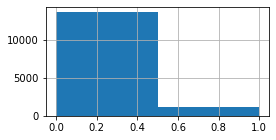



Histogram for: District Gràcia


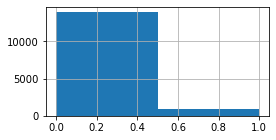



Histogram for: District Les Corts


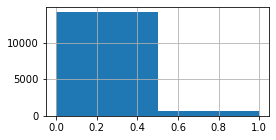



Histogram for: District Nou Barris


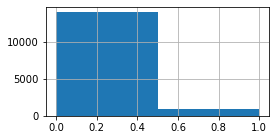



Histogram for: District Sarrià-Sant Gervasi


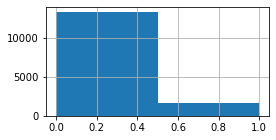



Histogram for: District Sant Andreu


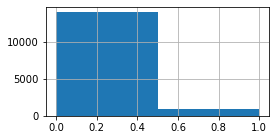

In [14]:
for col in dummy_features:
    print(f'Histogram for: {col}')
    df_features[col].hist(bins=2, figsize=[4,2])
    plt.show()
    print("")
    print("")

**CONCLUSION: Outliers Housing-Specific Dummy Variables** <br> <br>
*No Dummy Variables With A To Low Representation in the Sample*
<br>
- Lowest Dummy is Energy Label A With 2.5% percent, however this is not low enough to likely cause problems in the pricing models


### Outlier Treatment Continious Housing-Specific Variables 

*Step 0: Correct The Incorrect Values Earlier Shown In The Summary Statistics*

- Drop The Properties Not Build Yet
- For The Property With A Building Surface m², the correct Building surface m² is 100

In [15]:
print(len(df_features))
df_features = df_features[df_features['Building age'] > -1]


df_features.loc[df_features['Building surface m²'] == 0, 'Building surface m²'] = 1000
df_features = df_features[df_features['Building surface m²'] > 0]
print(len(df_features))

14899
14897


*Step 1: Summary-Statistics Housing-Specific Continious Variables*

In [16]:
#continious_features = ['Building surface m²','Building age','Log price','Price'] #'bedrooms', 'bathrooms',#'price,'
df_features['Log price'] = np.log(df_features['Price'])
df_features['Price per Building surface m²'] = df_features['Price'] / df_features['Building surface m²']
df_features['Price'] = df_features['Price'] / 1000
df_features[[*continious_features,'Price per Building surface m²']].describe()

,Building surface m²,Building age,Price,Log price,Price per Building surface m²
count,14897.000000,14897.000000,14897.000000,14897.000000,14897.000000
mean,114.086259,69.402598,571.370327,12.932553,4694.338963
std,87.434954,36.929615,663.098823,0.748530,2601.567133
min,13.000000,0.000000,38.000000,10.545341,364.583333
25%,69.000000,50.000000,248.000000,12.421184,3243.243243
50%,89.000000,58.000000,379.800000,12.847400,4305.555556
75%,125.000000,93.000000,650.000000,13.384728,5574.712644
max,1000.000000,323.000000,25000.000000,17.034386,108695.652174


*Step 2: Histograms Housing-Specific Continious Variables*

Histogram: Building surface m²


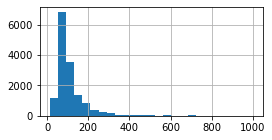



Histogram: Building age


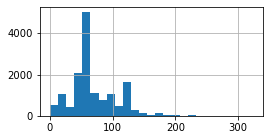



Histogram: Price


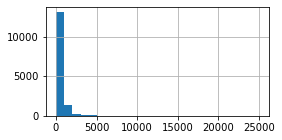



Histogram: Log price


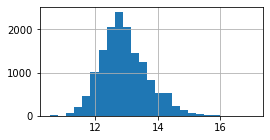



Histogram: Price per Building surface m²


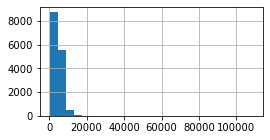

In [17]:
for col in [*continious_features, 'Price per Building surface m²']:
    print(f'Histogram: {col}')
    df_features[col].hist(bins=25, figsize=[4,2])
    plt.show()
    print("")
    print("")

**CONCLUSION: Summary Statistics Continious Housing-Specific Variables** <br> <br>

- built_m2 seems to have huge outliers on the upper range
- age seems also to have outliers on the upper range 
- price per buildings surface m2 seems also to have outliers on the upper range
- price seems also to have outliers on the upper range causing huge std 

*Step 3: Outlier Treatment Continious Housing-Specific Variables*

The Outliers Are Removed As Described in Section 3.1 <br> <br>
For Each of The Continious Housing-Specific Variables: Price, Log Price, Building Surface m2, Building age, Price per Building Surface m2 the values that are above/below the mean of variable + 2 * the standard deviation of the variable are removed

In [18]:
df_features['drop'] = 0
#how many std deviations the value should below above/below the mean to drop it
std_times = 2

for col in [*continious_features, 'Price per Building surface m²']:
    if col != 'A': #one can exclude variables to not be treated in this line
        mean_col = df_features[col].mean()
        std_col = df_features[col].std()
        df_features.loc[df_features[col] > mean_col + std_times * std_col  , 'drop'] = 1 #dropped because above mean + times * std
        df_features.loc[df_features[col] < mean_col - std_times * std_col  , 'drop'] = 1 #dropped because below mean + times * std
n_drop = df_features['drop'].sum()
print(f'Based On This Condition: {n_drop} will be dropped.')

#df_features[continious_features][df_features['drop']==1].to_excel('dropped_sample.xlsx')

#dropping the variables above/below the mean + times * std in the sample
df_features =  df_features.drop(df_features[df_features['drop'] == 1].index)

Based On This Condition: 1539 will be dropped.


*Step 4: Summary Statistics Continious Housing-Specific Variables After Outlier Treatment*

In [19]:
df_features[[*continious_features,'Price per Building surface m²']].describe()

,Building surface m²,Building age,Price,Log price,Price per Building surface m²
count,13358.000000,13358.000000,13358.000000,13358.000000,13358.000000
mean,99.725483,67.489856,459.208763,12.844470,4451.647924
std,46.133324,32.298335,311.038905,0.612337,1627.270998
min,18.000000,0.000000,93.000000,11.440355,667.844523
25%,69.000000,50.500000,245.000000,12.409013,3240.740741
50%,87.000000,58.000000,360.000000,12.793859,4230.769231
75%,116.000000,88.000000,565.000000,13.244581,5383.699634
max,288.000000,143.000000,1825.000000,14.417091,9888.888889


*Step 5: Histograms Continious Housing-Specific Variables After Outlier Treatment*

Histogram for: Building surface m²


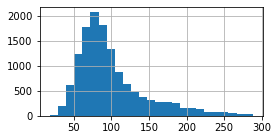



Histogram for: Building age


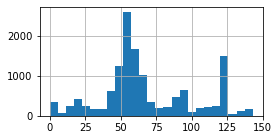



Histogram for: Price


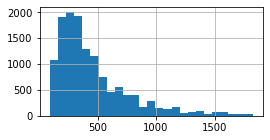



Histogram for: Log price


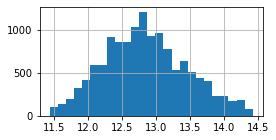



Histogram for: Price per Building surface m²


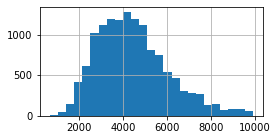

In [20]:
for col in [*continious_features, 'Price per Building surface m²']:
    print(f'Histogram for: {col}')
    df_features[col].hist(bins=25, figsize=[4,2])
    plt.show()
    print("")
    print("")

**CONCLUSION: With The Outlier Treatment The Continious Housing-Specific Variable Retrieve a More Normal Distribution** <br> <br>
Most of the Values Are Now Closely Distributed Around The Mean

<br>

### CREATING INTERACTION VARIABLES: Building Surface m2 and Building Age

Often the building surface m2 and building age have also a non-linear relationship with the housing price <br> <br>

Thereby different interaction variables were tested <br> <br>

The only relevant one and used one found during testing was the building surface m2 and building age squared

In [21]:
"Squares Buiding surface m2 and Building Age"
df_features['sq(Building surface m²)'] = df_features['Building surface m²']**2 
df_features['sq(Building age)'] = df_features['Building age']**2 


"Interaction Building Surface m2 and Building age"
df_features['Building surface m² x Building age'] = df_features['Building surface m²'] * df_features['Building age']

"Log Values Building Surface m2 and Building Age"
df_features[df_features['Building age'] == 0]['Building age'] = 0.001
df_features['Log Building surface m²'] = np.log( df_features['Building surface m²'])
df_features['Log Building age'] = np.log( df_features['Building age'])   



## ROUND-UP: Correlation Matrix Housing-Specific Variables**

In [22]:
corr = (df_features[[*continious_features, *dummy_features]].corr())
corr.style.background_gradient(cmap='RdBu_r').set_precision(2)

,Building surface m²,Building age,Price,Log price,House,Mezzanine,Ground Floor,1st Floor,2nd-5th Floor,6th Floor or higher,New housing development,Good condition,Needs renovation,Elevator,Terrace,Heating,Outdoor facilities,Parking space included,Energy label consumption A,Energy label consumption B,Energy label consumption C,Energy label consumption D,Energy label consumption E,Energy label consumption F,Energy label consumption G,District Eixample,District Ciutat Vella,District Sant Martí,District Sants-Montjuïc,District Horta Guinardó,District Gràcia,District Les Corts,District Nou Barris,District Sarrià-Sant Gervasi,District Sant Andreu
Building surface m²,1.00,-0.07,0.82,0.78,0.24,-0.06,-0.06,-0.01,-0.04,0.07,-0.02,-0.02,0.03,0.17,0.28,0.22,-0.09,0.34,0.01,0.02,0.06,0.08,0.03,-0.04,-0.11,0.08,-0.10,-0.06,-0.13,-0.06,-0.01,0.10,-0.11,0.36,-0.07
Building age,-0.07,1.00,-0.04,-0.04,-0.05,0.09,-0.05,0.03,0.04,-0.11,-0.01,-0.06,0.07,-0.23,-0.12,-0.12,-0.01,-0.25,-0.10,-0.11,-0.00,-0.02,0.04,0.02,0.03,0.14,0.45,-0.17,-0.02,-0.16,-0.02,-0.09,-0.11,-0.12,-0.13
Price,0.82,-0.04,1.00,0.93,0.09,-0.08,-0.12,-0.02,0.03,0.12,0.05,0.03,-0.06,0.28,0.30,0.26,-0.16,0.36,0.04,0.09,0.10,0.08,0.02,-0.06,-0.14,0.17,-0.03,-0.06,-0.18,-0.15,0.01,0.12,-0.20,0.39,-0.15
Log price,0.78,-0.04,0.93,1.00,0.10,-0.08,-0.16,-0.01,0.03,0.12,0.09,0.03,-0.08,0.37,0.33,0.30,-0.21,0.32,0.05,0.10,0.10,0.09,0.03,-0.07,-0.17,0.23,-0.03,-0.06,-0.17,-0.16,0.04,0.13,-0.28,0.37,-0.17
House,0.24,-0.05,0.09,0.10,1.00,-0.03,-0.05,-0.08,-0.15,-0.05,-0.03,-0.01,0.02,-0.27,0.05,0.02,0.03,0.14,-0.00,-0.00,0.01,0.03,-0.04,0.02,-0.00,-0.06,-0.05,-0.01,-0.04,0.07,0.02,-0.00,0.04,0.05,0.04
Mezzanine,-0.06,0.09,-0.08,-0.08,-0.03,1.00,-0.08,-0.13,-0.23,-0.08,-0.03,0.00,0.01,-0.01,-0.05,-0.06,0.05,-0.07,-0.02,-0.03,-0.01,0.01,0.01,0.01,-0.00,0.04,0.05,-0.04,0.02,-0.03,0.00,-0.02,-0.01,-0.04,-0.02
Ground Floor,-0.06,-0.05,-0.12,-0.16,-0.05,-0.08,1.00,-0.19,-0.33,-0.12,0.06,-0.00,-0.03,-0.16,0.01,-0.05,0.07,-0.04,0.03,0.04,0.02,0.01,-0.07,0.01,0.02,-0.12,-0.04,-0.00,0.02,0.07,0.07,-0.02,0.02,-0.00,0.08
1st Floor,-0.01,0.03,-0.02,-0.01,-0.08,-0.13,-0.19,1.00,-0.54,-0.19,0.03,-0.01,-0.01,-0.00,-0.01,-0.01,0.00,-0.01,0.02,0.02,-0.00,-0.02,-0.02,-0.01,0.03,-0.02,0.01,-0.02,0.03,0.02,0.00,-0.03,-0.03,0.04,-0.03
2nd-5th Floor,-0.04,0.04,0.03,0.03,-0.15,-0.23,-0.33,-0.54,1.00,-0.34,-0.01,-0.00,0.01,0.07,-0.07,0.02,-0.05,-0.03,-0.01,-0.00,-0.01,-0.02,0.05,-0.01,-0.03,0.06,0.07,-0.02,-0.04,-0.03,-0.03,0.00,0.01,-0.03,-0.03
6th Floor or higher,0.07,-0.11,0.12,0.12,-0.05,-0.08,-0.12,-0.19,-0.34,1.00,-0.05,0.01,0.01,0.17,0.13,0.07,-0.04,0.08,-0.02,-0.03,-0.01,0.02,0.03,0.01,-0.01,0.05,-0.10,0.09,0.02,-0.06,-0.04,0.06,-0.02,-0.01,0.01


In [23]:
threshold = 0.5

# select cells above threshold and print corresponding index and column name
subset = corr[abs(corr) > threshold].stack()
for idx, val in subset.iteritems():
    if val != 1: #same column as index
        print(f'Index: {idx}, Value: {val}')

Index: ('Building surface m²', 'Price'), Value: 0.8155651995633931
Index: ('Building surface m²', 'Log price'), Value: 0.7782745827851744
Index: ('Price', 'Building surface m²'), Value: 0.8155651995633931
Index: ('Price', 'Log price'), Value: 0.9341881942209361
Index: ('Log price', 'Building surface m²'), Value: 0.7782745827851744
Index: ('Log price', 'Price'), Value: 0.9341881942209361
Index: ('1st Floor', '2nd-5th Floor'), Value: -0.5361970172365434
Index: ('2nd-5th Floor', '1st Floor'), Value: -0.5361970172365434
Index: ('Good condition', 'Needs renovation'), Value: -0.8713971583563476
Index: ('Needs renovation', 'Good condition'), Value: -0.8713971583563476


**COMMENT: High Correlation Observed:** <br>

*The Variables Are Already Exlcuded In The Code Above:* <br>
*However Before Excluding The Following Observations Were Found:*  <br> <br>
- built_m2 and bedroom > 0.55 --> exclude bedroom
- built_m2 and bathroom > 0.75 --> exclude bathroom
- Garden and Green Area > 0.88 --> Creation Dummy Variable Outdoor Facilities
- Swimming pool and Green Area > 0.85 -->  Creation Dummy Variable Outdoor Facilities
- Swimming pool and Garden > 0.75 --> Creation Dummy Variable Outdoor Facilities
- Second hands/good condition and Second hand/needs renovating --> Noise Don't Do Anything Variable Can't be one for both categories

## FINAL SAMPLE: Sample Including Observation With Missing Energy Label Data

**Observations with Missing Energy Labels are Discarded** <br> <br>
*Sample Name In The Code Will Be Defined As DF_OLS* <br>

In [24]:
df_ols = df_features

In [25]:
#df_ols = df_features.drop(df_features[df_features['Energy label consumption NA'] == 1].index)

# REGULAR OLS & SEMI-LOG OLS MODELS (NO HECKMAN)

### Function to Check Models Before Estimating Pricing Models:

**Correlation Matrix For The Predictors After The Model**<br> <br>
*Parameters:*<br> <br>

*DF: dataframe for correlation matrix* <br>
*Predictors: Model Predictors <br>* 
*Threshold: Threshold used To Include A Variable In the CM if it has a correlation coefficent with another variable over the threshold* <br>
*Model_type: Specified Model Type To Save Results* <br>
*Model_n: Number of The Model* <br>
*Save: Save the Results On Computer*

In [26]:
def correlation_matrix_with_threshold(df, predictors, threshold, model_type, model_n, save=False):
    #normal correlation matrix
    corr = (df[[*predictors]].corr())
   
    #threshold
    threshold = threshold 

    # select cells above threshold and print corresponding index and column name
    subset = corr[abs(corr) > threshold].stack()
    variables_cor = [] #list of variables to include in correlation matrix
    for idx, val in subset.iteritems():
        if val != 1: #same column as index
            if abs(val) > 0.5:
                print(f'CRITICAL: Index: {idx}, Value: {val} has correlation over absolute 0.5!')
            #print(f'Index: {idx}, Value: {val}')
            variables_cor.append(idx)
    #print(variables_cor)
    variables = set()
    
    for d in variables_cor:
        variables.add(d[0])
        variables.add(d[1])

    #show correlation matrix with variables above threshold
    corr_select = (df[[*variables]].corr())
    plt.figure(figsize=(12, 12))
    #plt.title('Correlation Matrix Sample Without Missing Energy Label Data')
    corrplot(df[[*variables]].corr(), size_scale=750);
    if save == True:
        plt.savefig(model_type+'_'+str(model_n)+'.png')
    else: 
        pass
    plt.show()

**VIF Test-Statistic For The Model Predictors** <br> <br>
*Parameters:* <br> <br>

*DF: dataframe including target and predictors model* <br>
*Predictors: Model Predictors <br>* 
*Model_type: Specified Model Type To Save Results* <br>
*Model_n: Number of The Model* <br>
*Save: Save the Results On Computer*

In [27]:
def vif_check(df, predictors, model_type, model_n, save=False):  
    
    "Specificy Predictors"
    X = df[predictors]

    "SET VIF-Values In DataFrame"
    vif_data = pd.DataFrame()
    vif_data["feature"] = X.columns
    print(f'VIF results for {model_type} and model number 1 from high to low:')
    # calculating VIF for each feature
    vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                              for i in range(len(X.columns))]
    
    "Print Sorted VIF-values"
    vif_data_sort = vif_data.sort_values(by='VIF', ascending=False)
    print(vif_data_sort)
    if save== True:
        vif_data.to_excel(r'C:\Users\niels\python\UPF\Thesis\result_sample_heckman\\VIF_'+model_type+'_'+str(model_n)+'.xlsx')
    else:
        pass


### Function To Estimate Pricing Model

**ESTIMATING THE PRICING MODEL** <br> <br>
*Parameters:* <br> <br>

*DF: dataframe including target and predictors model* <br>
*Target: Variable To Predict <br>
*Predictors: Model Predictors <br>* 
*Model_type: Specified Model Type To Save Results* <br>
*Model_n: Number of The Model* <br>
*Save: Save the Results On Computer*

In [28]:
def estimate_ols_model(df, target, predictors, model_type, model_n, save=False):
    'Set-up'
    X = df[predictors] #predictors
    X = sm.add_constant(X) #add constant to predictors
    y = df[target].values.ravel() #target variables\
    'Model Estimation'
    #Huber/White/sandwich estimator standard errors are used
    results = sm.OLS(y, X).fit(cov_type='HC1') #Estimating the Model With the Robust Standard Erros
    params = results.params #coefficent of model
    t_value = results.tvalues #t-value of coefficients
    score = results.rsquared #fit of the models
    
    "Print The Results"
    print(results.summary()) 
    
    "Save The Results"
    if save == True:
        with open(r'C:\Users\niels\python\UPF\Thesis\result_sample_heckman\\model_results_'+model_type+'_'+str(model_n)+'.csv', 'w') as fh:
            fh.write(results.summary().as_csv())
    else:
        pass
    
    "Store The Results In DataFrame"
    df_predicted = pd.DataFrame(results.predict(X), index=df.index, columns=['Predicted Price'])
   
    "Return The Predictions, Parameters, and Model Results"
    return df_predicted, params, results

### Fuction To Check Model Assumption After Pricing Model Estimation

**Distribution Of The Residuals** <br> <br>
*Parameters:* <br> <br>

*DF_target: dataframe including target variable* <br>
*DF_pred: dataframe including predictions* <br>
*Target_var: Name Target Variable* <br> 
*Pred_Var: Name Predicted Variable<br>* 


In [29]:
def residuals_distribution(df_target, df_pred, target_var, pred_var):
    
    "Merge DataFrames"
    df = df_target.merge(df_pred, left_index=True, right_index=True)
    
    "Calculate Residuals"
    df['residuals'] = df[target_var] - df[pred_var]
    print(f'Average Error: {np.mean(df.residuals)}')
    test_statistic_skew, p_value_skew = skewtest(df.residuals.values.ravel())
    
    
    "Calculate Skewness and Kurtosis Residuals"
    print(f'Skewness Residual is: {df.residuals.skew()}, note: normal skewness is 0')
    print("Skewness Residuals test statistic:", test_statistic_skew)
    print("Skewness Residual p-value:", p_value_skew)
    test_statistic_kurt, p_value_kurt = kurtosistest(df.residuals)
    print(f'Kurtosis Residuals is: {df.residuals.kurt()}, note: normal kurtosis is 3')
    print("Kurtosis Residuals test statistic:", test_statistic_kurt)
    print("Kurtosis Residual p-value:", p_value_kurt)
    
    "Plot The Distrubtion Of The Residuals With A Histograms"
    print('Distribution Residuals:')
    df.residuals.hist(bins=100)
    plt.show()

    "Plot The Actual Vs The Predicted Values With A Trend Line"
    ax = df.plot(kind='scatter', x=target_var, y=pred_var)
    z = np.polyfit(df[target_var], df[pred_var], 1)
    p = np.poly1d(z)
    ax.plot(df[target_var], p(df[target_var]), "r--")
    ax.set_title("Scatter plot predicted prices vs actual prices with trend line")
    # show the plot
    plt.show()

**Distribution Of The Residuals** <br> <br>
*Parameters:* <br> <br>

*DF: dataframe on which the model is estimated* <br>
*model_resid: residuals of the pricing models* <br>
*Predictors: Predictors on which the model is estimated <br>


In [30]:
def heteroskedasticity(df, model_resid,predictors):
    
    "Test For Hetoroskedasticy With The Breusch Pagan Test"
    bp_test = het_breuschpagan(model_resid, df[predictors])
    print("Breusch-Pagan test p-value:", bp_test[1])

    # test for heteroskedasticity using White test
    #squared residuals on independent variables from the original models, squares of all those variables and their cross-products.
    #try: 
     #   white_test = het_white(model_resid, df[predictors])
      #  print("White test p-value:", white_test[1])
    #except:
    #    pass

**Ramsey Reset Test** <br> <br>
*Parameters:* <br> <br>

*Results: result of the model estimation* <br>
*Power: Power To Which The Ramsey Reset Test Is Calculated* <br>



In [31]:
def ramsey_reset(result, power):
    # Perform a Ramsey RESET test
    reset_results = linear_reset(result, power=power, use_f=True, cov_type='HC1')
    # Print the results
    print("Ramsey RESET test results:")
    print(reset_results)

**Correlation Of The Predictors With The Residuals** <br> <br>
*Parameters:* <br> <br>

*DF: dataframe on which the model is estimated* <br>
*Predictors: List Of The Predictors of The Model* <br>
*Target_var: Name Target Variable* <br> 
*df_pred: DataFrame With The Predicted Values for The Target Var <br>
*Pred_Var: Name Predicted Variable<br>* 

In [32]:
def correlation_predictors_with_residuals(df, predictors, target_var, df_pred, pred_var):
    
    "Merge DataSet Of Model On Which The Model Is Estimated With The Predicted Values"
    df = df.merge(df_pred, left_index=True, right_index=True)
    
    "Calculate The Residuals"
    df['residuals'] = df[target_var] - df[pred_var]
    print('Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model')
    plt.figure(figsize=(12, 12))
    #plt.title('Correlation Matrix Sample Without Missing Energy Label Data')
    df['sq(residuals)'] = df['residuals']**2
    corrplot(df[['sq(residuals)',*predictors]].corr(), size_scale=750);
    plt.show()

## SUMMARY STATISTICS OF THE FINAL SAMPLE

**DEFENITIONS**

In [33]:

target_variables = ['Price', 'Log price']#,'Price per Building surface m²']
continious_housing_specific_features = ['Building surface m²','Building age', 'sq(Building surface m²)','sq(Building age)'] #'bedrooms', 'bathrooms',#'price,' 
                       
dummy_housing_specific_features = ['House',
 'Mezzanine',
                  'Ground Floor',
 '1st Floor',
 '2nd-5th Floor',
 '6th Floor or higher',
 'New housing development','Good condition',
 'Needs renovation',
 'Elevator',
 'Terrace',
 'Heating',
 'Outdoor facilities',
              #    'Air conditioning',
 'Parking space included',
 'Energy label consumption A',
 'Energy label consumption B',
 'Energy label consumption C',
                  'Energy label consumption D',
 'Energy label consumption E',
 'Energy label consumption F',
 'Energy label consumption G',
 #'Energy label consumption NA',
 'District Eixample',
 'District Ciutat Vella',
 'District Sant Martí',
 'District Sants-Montjuïc',
 'District Horta Guinardó',
 'District Gràcia',
 'District Les Corts',
 'District Nou Barris',
 'District Sarrià-Sant Gervasi',
 'District Sant Andreu']


sustainable_features = [ 'Bus & Metro PCA',
 'Distance to Highway/Train (km)',
 'Distance to Beach (km)',
 'Park & Garden PCA',
 'Viewpoint PCA',
 'Neighboorhood size (10 ha)',
 'Vulnerable to heat impact (1-5)',
 'Police PCA',
 'Bar & Restaurant PCA',
 'Secondary & Lower School PCA',
 'University PCA',
 'Pharmacy PCA',
 'Hospital & Clinique PCA',
 'Big Shopping Place PCA',
 'Social Cohesion Score',
 'Natural population growth ‰',
 'Net immigration rate ‰',
 'Density net ((hab/1000)/ha)',
 'Performing Arts PCA',
 'Religious Institution PCA',
 'Museum, Library & POI Cult. PCA',
 'Income Distribution PCA',
 'Income & Unemployment PCA']

*Continios Housing-Specific Variables*

In [34]:
housing_sumstats_ols_con = df_ols[[*target_variables, *continious_housing_specific_features]].describe()
housing_sumstats_ols_con.loc['skewness'] = df_ols[[*target_variables, *continious_housing_specific_features]].skew()
housing_sumstats_ols_con.loc['kurtosis'] = df_ols[[*target_variables,*continious_housing_specific_features]].kurt()
housing_sumstats_ols_con.round(2)


,Price,Log price,Building surface m²,Building age,sq(Building surface m²),sq(Building age)
count,13358.00,13358.00,13358.00,13358.00,13358.00,13358.00
mean,459.21,12.84,99.73,67.49,12073.30,5597.99
std,311.04,0.61,46.13,32.30,12629.33,4962.50
min,93.00,11.44,18.00,0.00,324.00,0.00
25%,245.00,12.41,69.00,50.50,4761.00,2550.25
50%,360.00,12.79,87.00,58.00,7569.00,3364.00
75%,565.00,13.24,116.00,88.00,13456.00,7744.00
max,1825.00,14.42,288.00,143.00,82944.00,20449.00
skewness,1.66,0.22,1.44,0.42,2.49,1.18
kurtosis,2.88,-0.41,2.03,-0.37,6.98,0.17


*Housing-Specific Dummy Variables*

In [35]:
housing_sumstats_ols_non_con = df_ols[dummy_features].describe()[:2]
housing_sumstats_ols_non_con.round(2)

,House,Mezzanine,Ground Floor,1st Floor,2nd-5th Floor,6th Floor or higher,New housing development,Good condition,Needs renovation,Elevator,...,District Eixample,District Ciutat Vella,District Sant Martí,District Sants-Montjuïc,District Horta Guinardó,District Gràcia,District Les Corts,District Nou Barris,District Sarrià-Sant Gervasi,District Sant Andreu
count,13358.00,13358.00,13358.0,13358.00,13358.00,13358.0,13358.00,13358.00,13358.00,13358.00,...,13358.00,13358.00,13358.0,13358.00,13358.00,13358.00,13358.00,13358.00,13358.0,13358.00
mean,0.02,0.05,0.1,0.23,0.49,0.1,0.04,0.82,0.14,0.77,...,0.21,0.15,0.1,0.11,0.09,0.07,0.04,0.06,0.1,0.06


*Sustainable Variables*

In [36]:
sustain_sumstats_ols_con = df_ols[sustainable_features].describe()
sustain_sumstats_ols_con.loc['skewness'] = df_ols[sustainable_features].skew()
sustain_sumstats_ols_con.loc['kurtosis'] = df_ols[sustainable_features].kurt()
sustain_sumstats_ols_con.round(2)

,Bus & Metro PCA,Distance to Highway/Train (km),Distance to Beach (km),Park & Garden PCA,Viewpoint PCA,Neighboorhood size (10 ha),Vulnerable to heat impact (1-5),Police PCA,Bar & Restaurant PCA,Secondary & Lower School PCA,...,Big Shopping Place PCA,Social Cohesion Score,Natural population growth ‰,Net immigration rate ‰,Density net ((hab/1000)/ha),Performing Arts PCA,Religious Institution PCA,"Museum, Library & POI Cult. PCA",Income Distribution PCA,Income & Unemployment PCA
count,13358.00,13358.00,13358.00,13358.00,13358.00,13358.00,13358.00,13358.00,13358.00,13358.00,...,13358.00,13358.00,13358.00,13358.00,13358.00,13358.00,13358.00,13358.00,13358.00,13358.00
mean,0.37,1.15,3.29,0.40,0.41,13.51,2.86,0.44,0.49,0.47,...,0.33,0.21,-2.09,26.86,0.74,0.30,0.44,0.25,0.46,0.20
std,0.18,0.72,1.40,0.39,0.26,12.20,0.79,0.28,0.35,0.20,...,0.30,0.18,1.96,22.41,0.23,0.30,0.25,0.23,0.21,0.20
min,0.00,0.02,0.01,0.00,0.00,2.30,1.00,0.00,0.00,0.00,...,0.00,0.00,-8.92,-6.60,0.02,0.00,0.00,0.00,0.00,0.00
25%,0.24,0.62,2.14,0.01,0.21,8.04,2.00,0.29,0.19,0.32,...,0.08,0.09,-3.30,9.90,0.63,0.06,0.27,0.09,0.30,0.07
50%,0.36,0.99,3.44,0.50,0.32,11.10,3.00,0.32,0.34,0.47,...,0.20,0.15,-2.50,18.30,0.74,0.17,0.40,0.16,0.47,0.15
75%,0.48,1.51,4.61,0.51,0.64,14.10,3.00,0.55,0.87,0.62,...,0.54,0.30,-0.60,44.10,0.91,0.41,0.60,0.34,0.62,0.27
max,1.00,4.91,5.00,1.00,1.00,142.37,5.00,1.00,1.00,1.00,...,1.00,1.73,3.60,91.10,1.37,1.00,1.00,0.99,1.00,1.00
skewness,0.58,1.13,-0.37,0.37,0.67,5.95,0.08,0.33,0.30,0.00,...,0.91,1.81,0.14,1.18,-0.40,1.18,0.56,1.35,-0.34,1.92
kurtosis,0.41,1.35,-1.02,-1.33,-0.79,51.28,-1.03,-0.78,-1.36,-0.60,...,-0.48,4.73,0.62,0.89,0.10,0.11,-0.42,1.01,-0.59,3.67


*Save the Summary Statistics*

In [37]:
"Save Summary Statistics On Computer"
save_summary_statistics= False
if save_summary_statistics == True:
    housing_sumstats_ols_con.round(2).T.to_excel('sumstats_no_heckman_con.xlsx')
    housing_sumstats_ols_non_con.round(2).T.to_excel('sumstats_no_heckman.xlsx')
    sustain_sumstats_ols_con.round(2).T.to_excel('sumstats_sustainable_no_heckman.xlsx')

# Estimation Of The Pricing Models

## EXPLANATION 

**READ ME:** <br><br>

<u>Firstly, The Heckman Selection Model Is Estimated <br> 
Secondly, both The Tradional Hedonic Pricing Models, where the price is predicted in thousands, and The Semi-Log Hedonic Pricing Models Are Estimated and Their Assumptions are tested<br> <br>
Ony The Results For The Semi-Log Hedonic Pricing Models are studied and analyzed in the thesis, in-line with earlier research <br> <br>
The Results the Semi-Log Hedonic Pricing Models are in-line with the assumption for a correct specification an OLS model, this is not the case for the Traditional Hedonic Pricing Models </u>

**CODE STRUCTURE FOR THE PRICING MODELS:**

<u> The Code To Estimate The Probit Model and Pricing Models Is For Each Model Structed in 4 Parts </u> <br> <br>
- Firstly, the set-up of the model is defined by creating the list with the predictors of the model. This is done at the same time for the tradional hedonic pricing models, where the price is predicted in thousands, as for the semi-log hedonic pricing model. <br>
- Secondly, the function to check the assumption before the model estimation are estimated: correlation matrix predictors and VIF-test stastics. This is done at the same time for the tradional hedonic pricing models as for the semi-log hedonic pricing model. <br>
- Thirdly, the probit model/tradional hedonic pricing model/semi-log hedonic pricing model is estimated <br>
- Fourth, the model assumptions are checked after the estimated of the the probit model/tradional hedonic pricing model/semi-log hedonic pricing model

## MODEL 0: Heckman Selection Probit Model

### SET-UP: Predictors Order

In [38]:
heckman_predictors_order = [
    'Building surface m²',
 'Building age',
   # 'bedrooms',
    #'bathrooms',
                     #       'House',
     'Elevator',
       #  'Swimming pool',
    'Air conditioning',
  #   'Green Area', 'Garden',
                            'Terrace',
       # ,'Balcony',
        'Heating',
      #  'Second hand/good condition',
        'New housing development',
 'Needs renovation',
 'Outdoor facilities' ]

In [39]:
### CHECKS:  Before Model Estimation

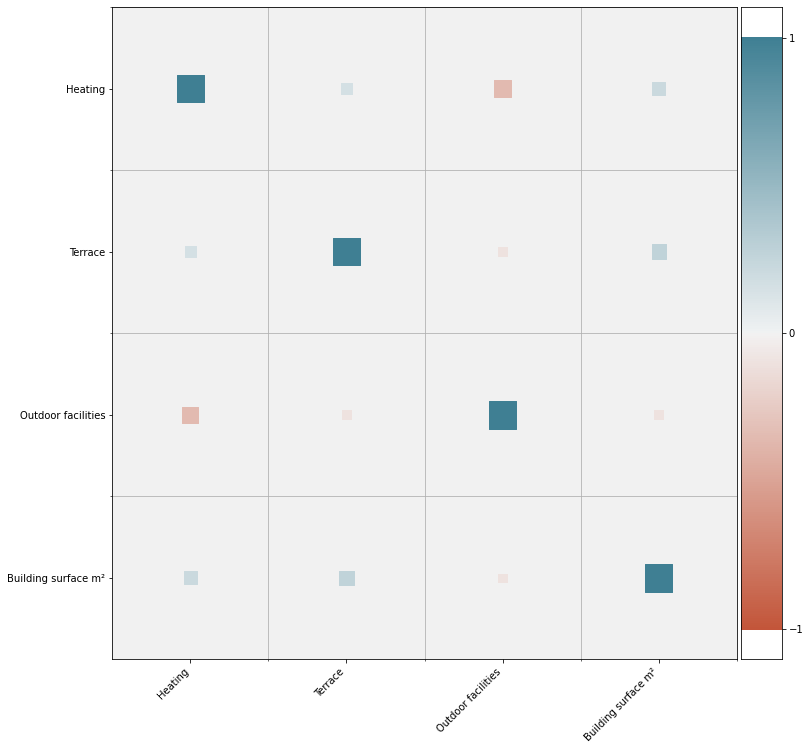

In [40]:
correlation_matrix_with_threshold(df_ols, heckman_predictors_order, 0.25, 'heckman_model', 1)

In [41]:
vif_check(df_ols,heckman_predictors_order, 'heckman_model', 1, False)

VIF results for heckman_model and model number 1 from high to low:
                   feature        VIF
3         Air conditioning  12.903605
0      Building surface m²   6.013154
1             Building age   5.277993
2                 Elevator   4.583714
5                  Heating   2.550327
8       Outdoor facilities   2.494940
4                  Terrace   1.664783
7         Needs renovation   1.239754
6  New housing development   1.139191


### MODEL 0: Heckman Selection Model

In [42]:
from scipy.stats import norm
X_sel = df_ols[heckman_predictors_order]
X_sel = sm.add_constant(X_sel)  # Add constant if needed
df_ols['No Energy label missing'] = 1- df_ols['Energy label consumption NA']
y_sel = df_ols['No Energy label missing']
selection_model = sm.Probit(y_sel, X_sel)
selection_result = selection_model.fit(cov_type='HC1')
df_results= pd.DataFrame(selection_result.predict(X_sel), index=df_ols.index,columns=['Predicted Energy label consumtion NA'])
# Calculate the inverse Mills ratio
#df_features['IMR'] = selection_model.pdf(sm.add_constant(selection_feat))
selection_result = sm.Probit(y_sel, sm.add_constant(X_sel)).fit()
print(selection_result.summary())
# Calculate the inverse Mills ratio
pdf = norm.pdf(selection_result.fittedvalues)
cdf = norm.cdf(selection_result.fittedvalues)
imr = pdf / (1 - cdf)
df_ols['IMR'] = imr

Optimization terminated successfully.
         Current function value: 0.544068
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544068
         Iterations 5
                             Probit Regression Results                             
Dep. Variable:     No Energy label missing   No. Observations:                13358
Model:                              Probit   Df Residuals:                    13348
Method:                                MLE   Df Model:                            9
Date:                     Sat, 26 Aug 2023   Pseudo R-squ.:                 0.02004
Time:                             11:39:35   Log-Likelihood:                -7267.7
converged:                            True   LL-Null:                       -7416.3
Covariance Type:                 nonrobust   LLR p-value:                 1.014e-58
                              coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: 1.8620800499272176e-05
Skewness Residual is: -1.1778096336489796, note: normal skewness is 0
Skewness Residuals test statistic: -44.81661691606285
Skewness Residual p-value: 0.0
Kurtosis Residuals is: -0.47006481971818603, note: normal kurtosis is 3
Kurtosis Residuals test statistic: -14.696472846236993
Kurtosis Residual p-value: 6.790578275741005e-49
Distribution Residuals:


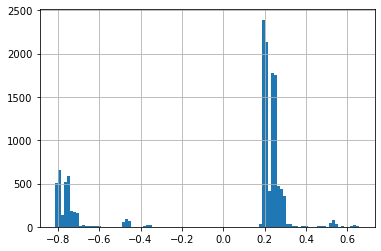

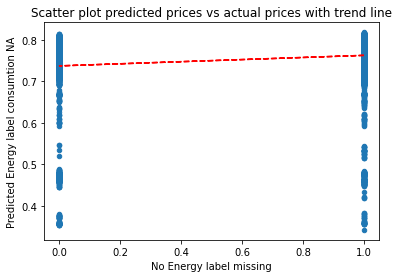

In [43]:
residuals_distribution(df_ols, df_results, 'No Energy label missing','Predicted Energy label consumtion NA')

*2: Ramsey Reset*

In [44]:
ramsey_reset(selection_result, 2)

Optimization terminated successfully.
         Current function value: 0.544016
         Iterations 5
Ramsey RESET test results:
<F test: F=1.3814005669986864, p=0.23988368970744767, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticty*

In [45]:
residuals = df_ols['Energy label consumption NA'] - df_results['Predicted Energy label consumtion NA']
heteroskedasticity(df_ols,residuals, heckman_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation residuals with predictors*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


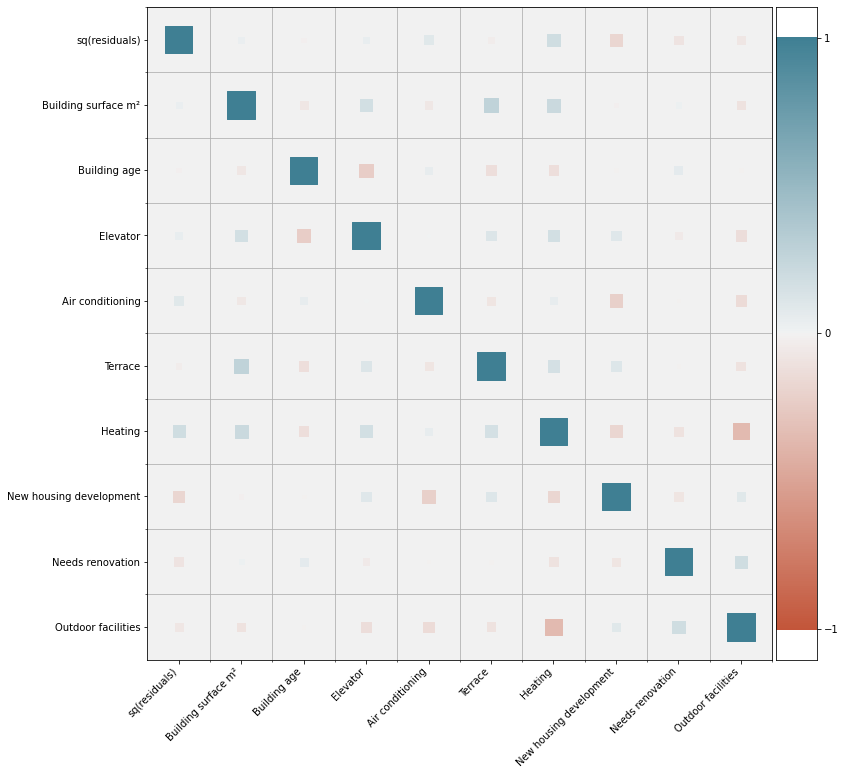

In [46]:
correlation_predictors_with_residuals(df_ols, heckman_predictors_order,'Energy label consumption NA', df_results, 'Predicted Energy label consumtion NA')

## MODEL 1: Housing-Specific Variables

### SET-UP: Predictors Order

In [47]:
model_1_predictors_order = ['Building surface m²',
                         'sq(Building surface m²)',
 'Building age',
 'sq(Building age)',
                            #  'Building surface m² PCA',
                       #  'Building age PCA',
                         
#'Building surface m² x Building age',
 'House',
 'Mezzanine',
 '1st Floor',
 #'2nd Floor',
 #'3th Floor',
 #'4th Floor',
# '5th Floor', 
'2nd-5th Floor',             
 '6th Floor or higher',
 'New housing development',
 'Needs renovation',
 'Elevator',
 'Terrace',
 #'Balcony',
 'Heating',
 'Outdoor facilities',
                         #   'Air conditioning',
 'Parking space included',
 'Energy label consumption A',
 'Energy label consumption B',
 'Energy label consumption C',
 'Energy label consumption E',
 'Energy label consumption F',
 'Energy label consumption G',
 'District Eixample',
 'District Ciutat Vella',
 'District Sant Martí',
 'District Sants-Montjuïc',
 'District Horta Guinardó',
 'District Gràcia',
 'District Nou Barris',
 'District Sarrià-Sant Gervasi',
 'District Sant Andreu', 'IMR']

### CHECKS:  Before Model Estimation

*1: CORRELATION MATRIX*

CRITICAL: Index: ('Building surface m²', 'sq(Building surface m²)'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building surface m²)', 'Building surface m²'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('Building age', 'sq(Building age)'), Value: 0.9674305580129744 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'Building age'), Value: 0.9674305580129744 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'District Ciutat Vella'), Value: 0.5250625166120209 has correlation over absolute 0.5!
CRITICAL: Index: ('1st Floor', '2nd-5th Floor'), Value: -0.5361970172365434 has correlation over absolute 0.5!
CRITICAL: Index: ('2nd-5th Floor', '1st Floor'), Value: -0.5361970172365434 has correlation over absolute 0.5!
CRITICAL: Index: ('New housing development', 'IMR'), Value: -0.8249767254901489 has correlation over absolute 0.5!
CRITICAL: Index: ('Heating', 'IMR'), Value: 0.

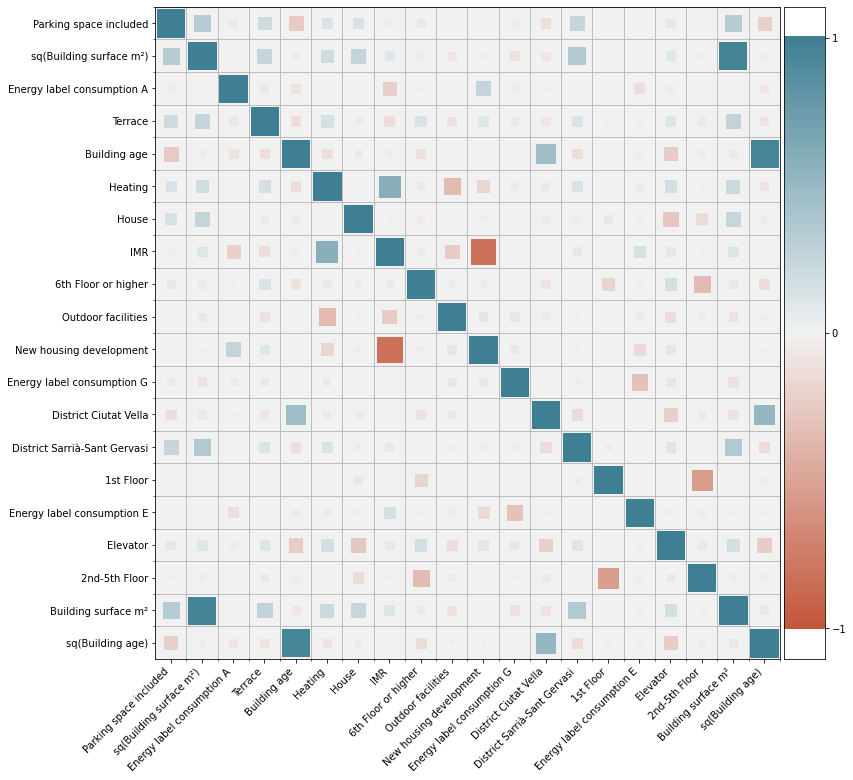

In [48]:
correlation_matrix_with_threshold(df_ols, model_1_predictors_order, 0.25, 'OLS_model', 1)

*2: VIF CHECK*

In [49]:
vif_check(df_ols, model_1_predictors_order, 'OLS_model', 1, False)

VIF results for OLS_model and model number 1 from high to low:
                         feature         VIF
0            Building surface m²  116.260083
31                           IMR  110.937826
2                   Building age  107.481881
3               sq(Building age)   47.905312
1        sq(Building surface m²)   37.476952
11                      Elevator    6.365109
22             District Eixample    6.339502
7                  2nd-5th Floor    6.211235
23         District Ciutat Vella    5.663995
25       District Sants-Montjuïc    3.812223
24           District Sant Martí    3.573651
13                       Heating    3.455267
6                      1st Floor    3.377450
29  District Sarrià-Sant Gervasi    3.339594
26       District Horta Guinardó    3.246281
14            Outdoor facilities    2.899538
27               District Gràcia    2.707487
30          District Sant Andreu    2.564145
28           District Nou Barris    2.561526
19    Energy label consumption E    2

### MODEL 1: Tradional Hedonic Pricing Models Housing-Specific Variables

In [50]:
ols_model_1 = estimate_ols_model(df_ols,'Price', model_1_predictors_order, 'OLS_model', 1, False)
ols_model_1_predictions = ols_model_1[0]
ols_model_1_params = ols_model_1[1]
ols_model_1_result = ols_model_1[2]

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.779
Model:                            OLS   Adj. R-squared:                  0.778
Method:                 Least Squares   F-statistic:                     871.5
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:39:38   Log-Likelihood:                -85555.
No. Observations:               13358   AIC:                         1.712e+05
Df Residuals:                   13325   BIC:                         1.714e+05
Df Model:                          32                                         
Covariance Type:                  HC1                                         
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: -1.1999480612619146e-12
Skewness Residual is: 0.7093309029181243, note: normal skewness is 0
Skewness Residuals test statistic: 30.27855082818391
Skewness Residual p-value: 2.1967189049453284e-201
Kurtosis Residuals is: 4.314879913984818, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 36.13830255717675
Kurtosis Residual p-value: 5.680116942870674e-286
Distribution Residuals:


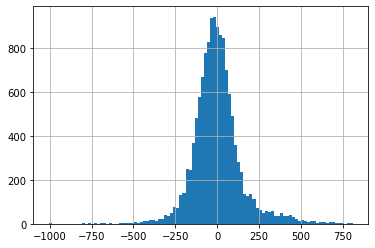

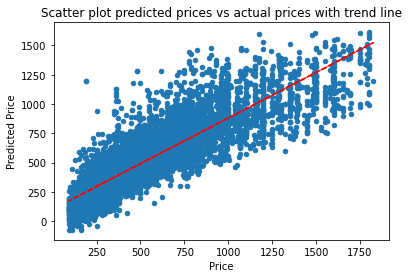

In [51]:
residuals_distribution(df_ols, ols_model_1_predictions, 'Price','Predicted Price')

*2: Ramsey Reset*

In [52]:
ramsey_reset(ols_model_1_result, 2)

Ramsey RESET test results:
<F test: F=653.8117021808575, p=8.015972556438372e-141, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticty*

In [53]:
heteroskedasticity(df_ols,ols_model_1_result.resid, model_1_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation residuals with predictors*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


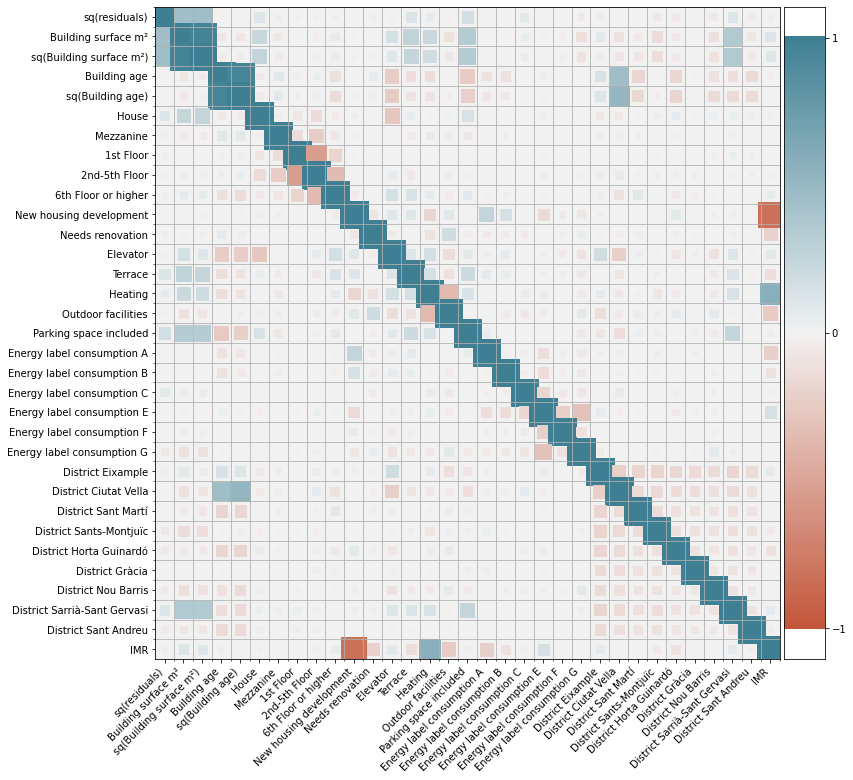

In [54]:
correlation_predictors_with_residuals(df_ols, model_1_predictors_order,'Price', ols_model_1_predictions, 'Predicted Price')

### MODEL 1: Semi-Log Hedonic Pricing Models Housing-Specific Variables

In [55]:
SL_ols_model_1 = estimate_ols_model(df_ols,'Log price', model_1_predictors_order, 'Semi_log_OLS_model', 1, False)
SL_ols_model_1_predictions = SL_ols_model_1[0]
SL_ols_model_1_params = SL_ols_model_1[1]
SL_ols_model_1_result = SL_ols_model_1[2]


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.826
Model:                            OLS   Adj. R-squared:                  0.825
Method:                 Least Squares   F-statistic:                     2048.
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:39:39   Log-Likelihood:                -738.36
No. Observations:               13358   AIC:                             1543.
Df Residuals:                   13325   BIC:                             1790.
Df Model:                          32                                         
Covariance Type:                  HC1                                         
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: 9.900483221422993e-14
Skewness Residual is: -0.08832734024019939, note: normal skewness is 0
Skewness Residuals test statistic: -4.161434555147437
Skewness Residual p-value: 3.16254634153161e-05
Kurtosis Residuals is: 0.592534560582008, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 10.920404175275811
Kurtosis Residual p-value: 9.208510737838257e-28
Distribution Residuals:


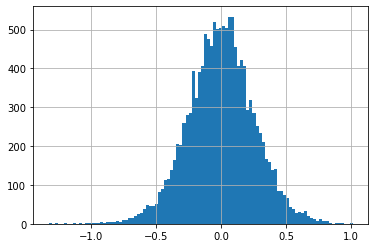

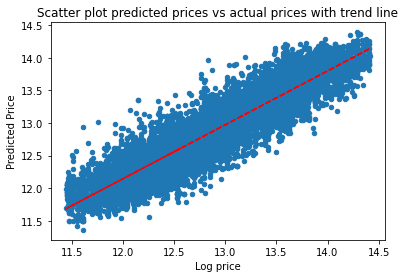

In [56]:
residuals_distribution(df_ols, SL_ols_model_1_predictions, 'Log price','Predicted Price')

*2: Ramsey RESET TEST*

In [57]:
ramsey_reset(SL_ols_model_1_result, 2)

Ramsey RESET test results:
<F test: F=5.135289862940901, p=0.023460141477135824, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticity*

In [58]:
heteroskedasticity(df_ols,SL_ols_model_1_result.resid, model_1_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation Predictors with squared residuals*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


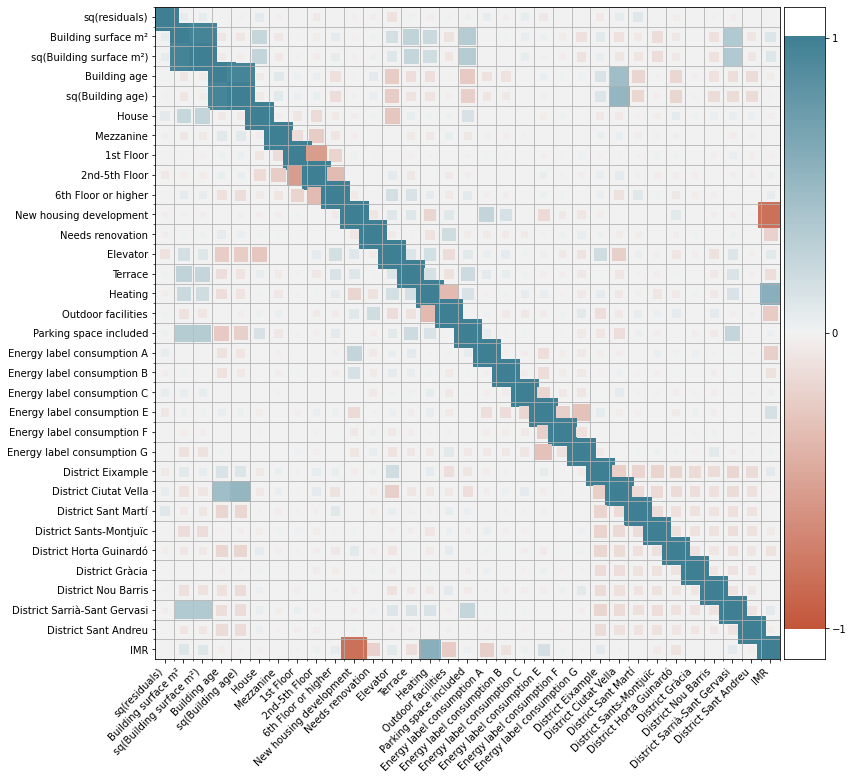

In [59]:
correlation_predictors_with_residuals(df_ols, model_1_predictors_order,'Log price', SL_ols_model_1_predictions, 'Predicted Price')

## MODEL 2: Ecological Dimension of Sustainability

### SET-UP: Predictors Order

In [60]:
model_2_predictors_order = ['Building surface m²',
                         'sq(Building surface m²)',
 'Building age',
 'sq(Building age)',
                         
#'Building surface m² x Building age',
 'House',
 'Mezzanine',
 '1st Floor',
 #'2nd Floor',
 #'3th Floor',
 #'4th Floor',
 #'5th Floor',
                            '2nd-5th Floor',
 '6th Floor or higher',
 'New housing development',
 'Needs renovation',
 'Elevator',
 'Terrace',
# 'Balcony',
 'Heating',
 'Outdoor facilities',
 'Parking space included',
 'Energy label consumption A',
 'Energy label consumption B',
 'Energy label consumption C',
 'Energy label consumption E',
 'Energy label consumption F',
 'Energy label consumption G',
#'Distance to Highway (km)',
                            
#'Bus PCA Component 1',
#'Train PCA Component 1',
#'Metro PCA Component 1',
# 'Highway & Train PCA Component 1',
  'Bus & Metro PCA',
       'Distance to Highway/Train (km)' ,                                       
 'District Eixample',
 'District Ciutat Vella',
 'District Sant Martí',
 'District Sants-Montjuïc',
 'District Horta Guinardó',
 'District Gràcia',
 'District Nou Barris',
 'District Sarrià-Sant Gervasi',
 'District Sant Andreu', "IMR"
                           ]

### CHECKS:  Before Model Estimation

*1: CORRELATION MATRIX*

CRITICAL: Index: ('Building surface m²', 'sq(Building surface m²)'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building surface m²)', 'Building surface m²'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('Building age', 'sq(Building age)'), Value: 0.9674305580129744 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'Building age'), Value: 0.9674305580129744 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'District Ciutat Vella'), Value: 0.5250625166120209 has correlation over absolute 0.5!
CRITICAL: Index: ('1st Floor', '2nd-5th Floor'), Value: -0.5361970172365434 has correlation over absolute 0.5!
CRITICAL: Index: ('2nd-5th Floor', '1st Floor'), Value: -0.5361970172365434 has correlation over absolute 0.5!
CRITICAL: Index: ('New housing development', 'IMR'), Value: -0.8249767254901489 has correlation over absolute 0.5!
CRITICAL: Index: ('Heating', 'IMR'), Value: 0.

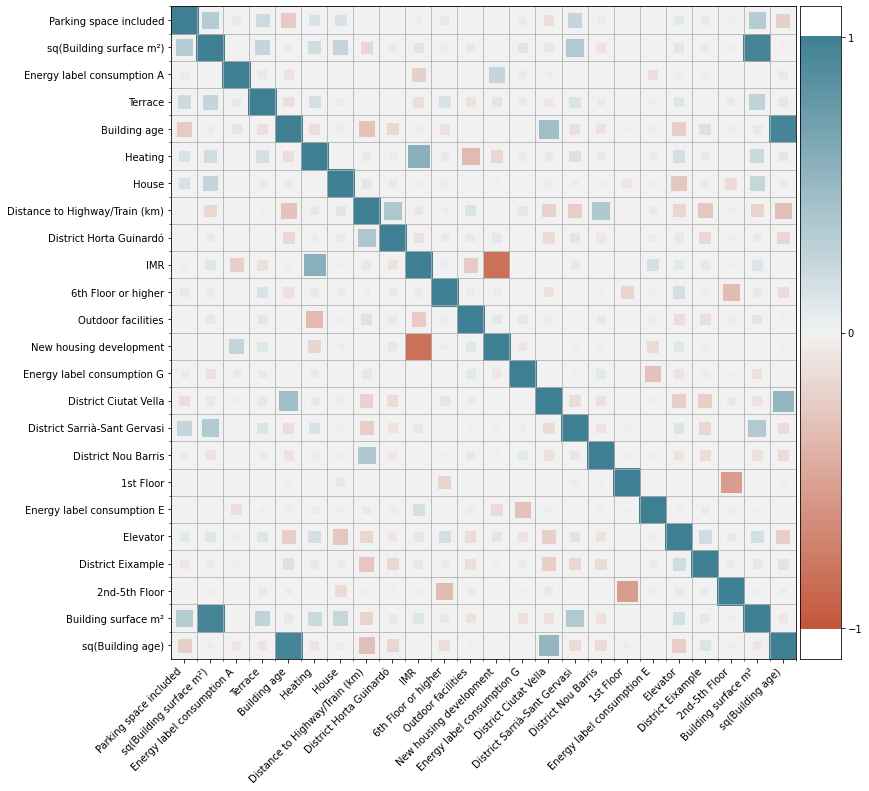

In [61]:
correlation_matrix_with_threshold(df_ols, model_2_predictors_order, 0.25, 'OLS_model', 2)

*2: VIF CHECK*

In [62]:
vif_check(df_ols, model_2_predictors_order, 'OLS_model', 2, False)

VIF results for OLS_model and model number 1 from high to low:
                           feature         VIF
33                             IMR  128.707193
0              Building surface m²  117.071006
2                     Building age  107.507992
3                 sq(Building age)   48.010784
1          sq(Building surface m²)   37.598571
23  Distance to Highway/Train (km)    6.713466
24               District Eixample    6.567502
11                        Elevator    6.524093
7                    2nd-5th Floor    6.218835
25           District Ciutat Vella    5.814787
22                 Bus & Metro PCA    5.752472
27         District Sants-Montjuïc    3.939560
26             District Sant Martí    3.591854
31    District Sarrià-Sant Gervasi    3.544323
13                         Heating    3.542943
6                        1st Floor    3.380092
28         District Horta Guinardó    3.344306
14              Outdoor facilities    2.899903
29                 District Gràcia    2.7081

### MODEL 2: Traditional Hedonic Pricing Model Ecological Dimension of Sustainability

In [63]:
ols_model_2 = estimate_ols_model(df_ols,'Price', model_2_predictors_order, 'OLS_model', 2, False)
ols_model_2_predictions = ols_model_2[0]
ols_model_2_params = ols_model_2[1]
ols_model_2_result = ols_model_2[2]

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.781
Model:                            OLS   Adj. R-squared:                  0.780
Method:                 Least Squares   F-statistic:                     836.3
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:39:43   Log-Likelihood:                -85494.
No. Observations:               13358   AIC:                         1.711e+05
Df Residuals:                   13323   BIC:                         1.713e+05
Df Model:                          34                                         
Covariance Type:                  HC1                                         
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: 9.633572241737875e-12
Skewness Residual is: 0.7473158922861066, note: normal skewness is 0
Skewness Residuals test statistic: 31.61723346667558
Skewness Residual p-value: 2.14023957549614e-219
Kurtosis Residuals is: 4.4089974366482485, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 36.459594923379214
Kurtosis Residual p-value: 4.847602225725678e-291
Distribution Residuals:


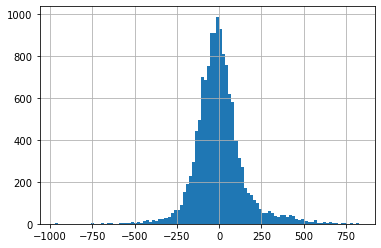

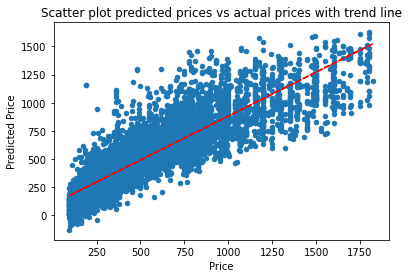

In [64]:
residuals_distribution(df_ols, ols_model_2_predictions, 'Price','Predicted Price')

*2: Ramsey Reset*

In [65]:
ramsey_reset(ols_model_2_result, 2)

Ramsey RESET test results:
<F test: F=730.1318103984883, p=1.3406038324336408e-156, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticty*

In [66]:
heteroskedasticity(df_ols,ols_model_2_result.resid, model_2_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation residuals with predictors*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


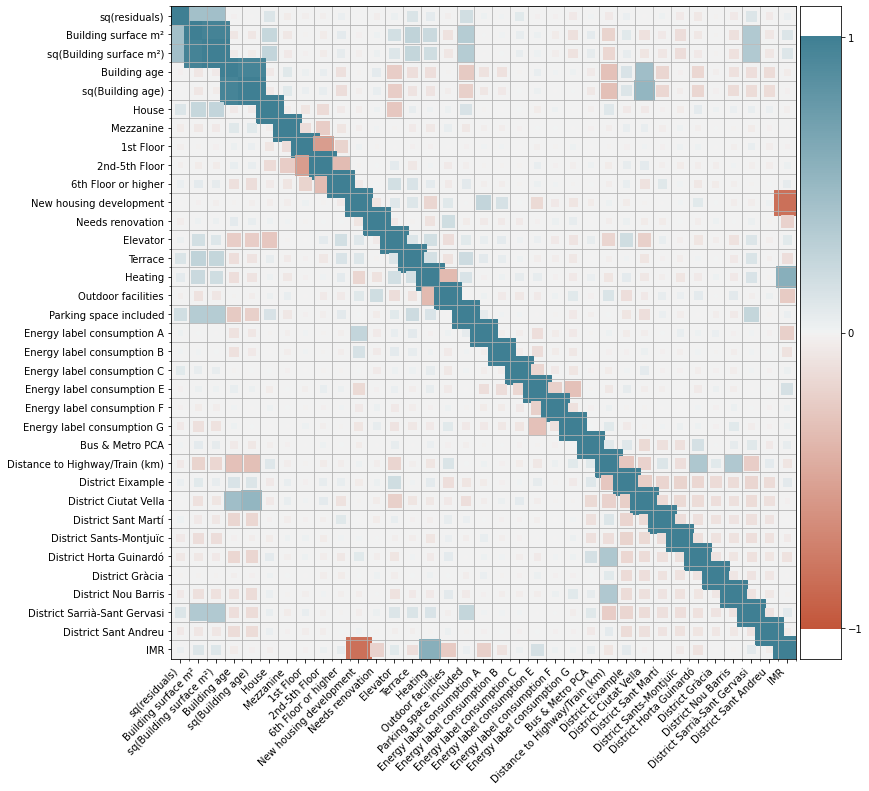

In [67]:
correlation_predictors_with_residuals(df_ols, model_2_predictors_order,'Price', ols_model_2_predictions, 'Predicted Price')

### MODEL 2: Semi-Log Hedonic Pricing Model Ecological Dimension of Sustainability

In [68]:
SL_ols_model_2 = estimate_ols_model(df_ols,'Log price', model_2_predictors_order, 'Semi_log_OLS_model', 2, False)
SL_ols_model_2_predictions = SL_ols_model_2[0]
SL_ols_model_2_params = SL_ols_model_2[1]
SL_ols_model_2_result = SL_ols_model_2[2]

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.834
Model:                            OLS   Adj. R-squared:                  0.833
Method:                 Least Squares   F-statistic:                     2140.
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:39:45   Log-Likelihood:                -422.26
No. Observations:               13358   AIC:                             914.5
Df Residuals:                   13323   BIC:                             1177.
Df Model:                          34                                         
Covariance Type:                  HC1                                         
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: 3.7880483797376343e-13
Skewness Residual is: -0.0011986020742909035, note: normal skewness is 0
Skewness Residuals test statistic: -0.05658022028472629
Skewness Residual p-value: 0.9548795912258854
Kurtosis Residuals is: 0.6846078817755465, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 12.212083114646378
Kurtosis Residual p-value: 2.6793988165429633e-34
Distribution Residuals:


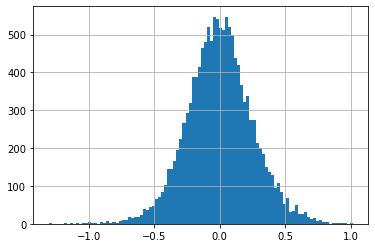

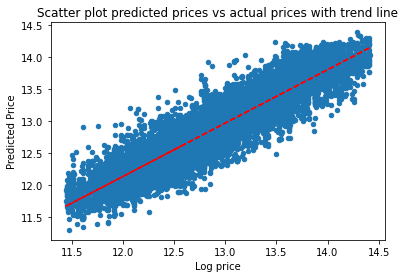

In [69]:
residuals_distribution(df_ols, SL_ols_model_2_predictions, 'Log price','Predicted Price')

*2: Ramsey RESET TEST*

In [70]:
ramsey_reset(SL_ols_model_2_result, 2)

Ramsey RESET test results:
<F test: F=5.573300630839819, p=0.0182506749764038, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticity*

In [71]:
heteroskedasticity(df_ols,SL_ols_model_2_result.resid, model_2_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation Predictors with squared residuals*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


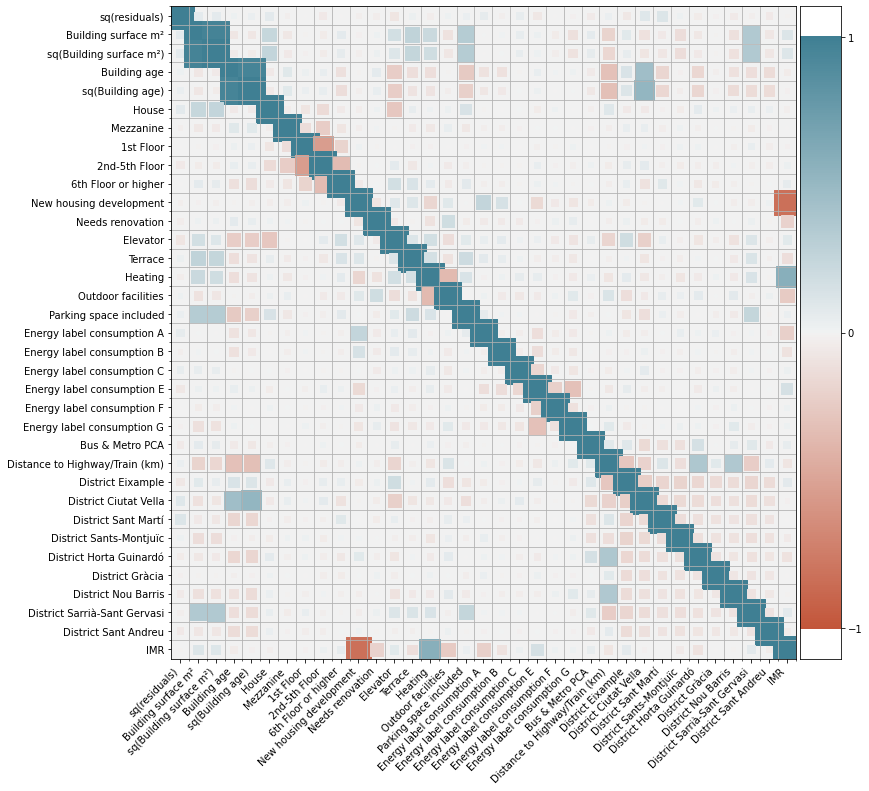

In [72]:
correlation_predictors_with_residuals(df_ols, model_2_predictors_order,'Log price', SL_ols_model_2_predictions, 'Predicted Price')

## MODEL 3: Environmental Dimension of Sustainability

### SET-UP: Predictors Order

In [73]:
model_3_predictors_order = ['Building surface m²',
                         'sq(Building surface m²)',
 'Building age',
 'sq(Building age)',
                         
#'Building surface m² x Building age',
 'House',
 'Mezzanine',
 '1st Floor',
 #'2nd Floor',
 #'3th Floor',
# '4th Floor',
# '5th Floor',
                            '2nd-5th Floor',
 '6th Floor or higher',
 'New housing development',
 'Needs renovation',
 'Elevator',
 'Terrace',
# 'Balcony',
 'Heating',
 'Outdoor facilities',
 'Parking space included',
 'Energy label consumption A',
 'Energy label consumption B',
 'Energy label consumption C',
 'Energy label consumption E',
 'Energy label consumption F',
 'Energy label consumption G',
 'Distance to Beach (km)',
    'Park & Garden PCA',
    'Viewpoint PCA',
    'Neighboorhood size (10 ha)',
#'Heat comfort level (1-7)',
                     'Vulnerable to heat impact (1-5)',       
 'District Eixample',
 'District Ciutat Vella',
 'District Sant Martí',
 'District Sants-Montjuïc',
 'District Horta Guinardó',
 'District Gràcia',
 'District Nou Barris',
 'District Sarrià-Sant Gervasi',
 'District Sant Andreu', 'IMR'
                           ]

### CHECKS:  Before Model Estimation

*1: CORRELATION MATRIX*

CRITICAL: Index: ('Building surface m²', 'sq(Building surface m²)'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building surface m²)', 'Building surface m²'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('Building age', 'sq(Building age)'), Value: 0.9674305580129744 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'Building age'), Value: 0.9674305580129744 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'District Ciutat Vella'), Value: 0.5250625166120209 has correlation over absolute 0.5!
CRITICAL: Index: ('1st Floor', '2nd-5th Floor'), Value: -0.5361970172365434 has correlation over absolute 0.5!
CRITICAL: Index: ('2nd-5th Floor', '1st Floor'), Value: -0.5361970172365434 has correlation over absolute 0.5!
CRITICAL: Index: ('New housing development', 'IMR'), Value: -0.8249767254901489 has correlation over absolute 0.5!
CRITICAL: Index: ('Heating', 'IMR'), Value: 0.

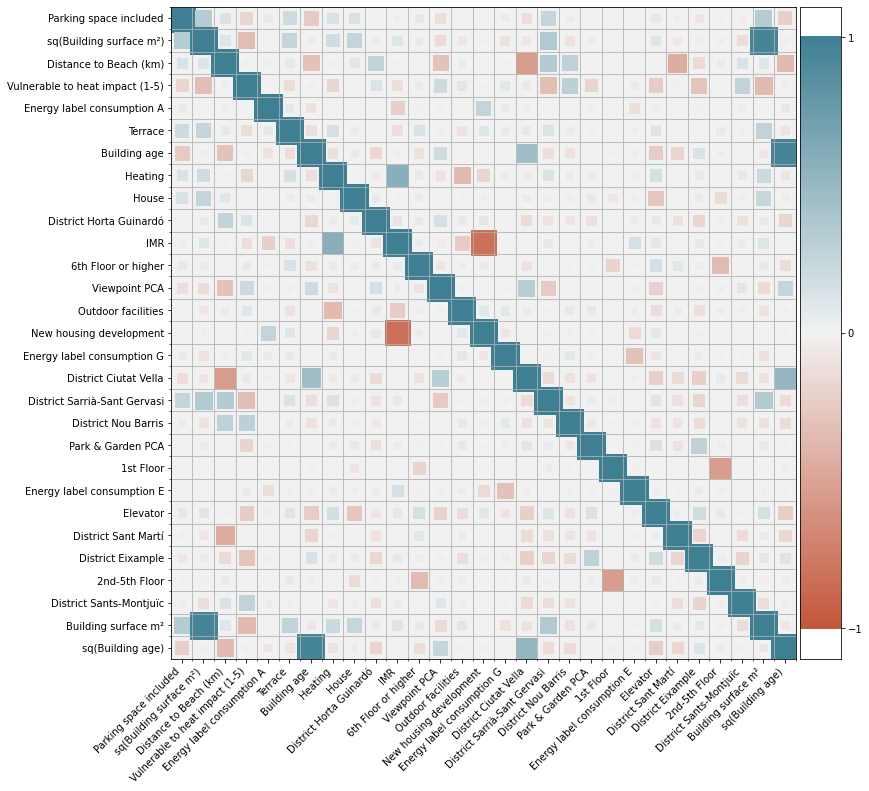

In [74]:
correlation_matrix_with_threshold(df_ols, model_3_predictors_order, 0.25, 'OLS_model', 3)

*2: VIF CHECK*

In [75]:
vif_check(df_ols, model_3_predictors_order, 'OLS_model', 3, False)

VIF results for OLS_model and model number 1 from high to low:
                            feature         VIF
36                              IMR  201.189662
0               Building surface m²  117.096453
2                      Building age  111.096588
3                  sq(Building age)   49.665055
1           sq(Building surface m²)   37.567461
22           Distance to Beach (km)   32.200905
26  Vulnerable to heat impact (1-5)   24.163246
28            District Ciutat Vella   10.616880
27                District Eixample    8.508972
29              District Sant Martí    6.873142
11                         Elevator    6.559849
7                     2nd-5th Floor    6.229295
24                    Viewpoint PCA    5.287025
30          District Sants-Montjuïc    4.706189
31          District Horta Guinardó    3.948886
13                          Heating    3.908218
34     District Sarrià-Sant Gervasi    3.429407
6                         1st Floor    3.381221
32                  Distr

### MODEL 3: Tradional Hedonic Pricing Model Environmental Dimension of Sustainability

In [76]:
ols_model_3 = estimate_ols_model(df_ols,'Price', model_3_predictors_order, 'OLS_model', 3, False)
ols_model_3_predictions = ols_model_3[0]
ols_model_3_params = ols_model_3[1]
ols_model_3_result = ols_model_3[2]

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.793
Method:                 Least Squares   F-statistic:                     817.5
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:39:49   Log-Likelihood:                -85082.
No. Observations:               13358   AIC:                         1.702e+05
Df Residuals:                   13320   BIC:                         1.705e+05
Df Model:                          37                                         
Covariance Type:                  HC1                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: -2.2663186840156012e-10
Skewness Residual is: 0.7202897373049018, note: normal skewness is 0
Skewness Residuals test statistic: 30.66794195155592
Skewness Residual p-value: 1.5236788887021237e-206
Kurtosis Residuals is: 4.432962805827225, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 36.54028688057283
Kurtosis Residual p-value: 2.5436757582136707e-292
Distribution Residuals:


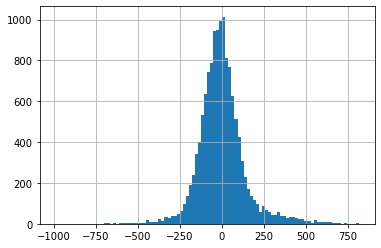

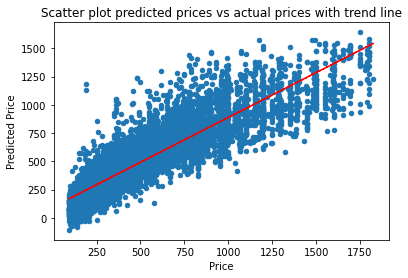

In [77]:
residuals_distribution(df_ols, ols_model_3_predictions, 'Price','Predicted Price')

*2: Ramsey Reset*

In [78]:
ramsey_reset(ols_model_3_result, 2)

Ramsey RESET test results:
<F test: F=850.1067540906149, p=3.189132043121859e-181, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticty*

In [79]:
heteroskedasticity(df_ols,ols_model_3_result.resid, model_3_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation residuals with predictors*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


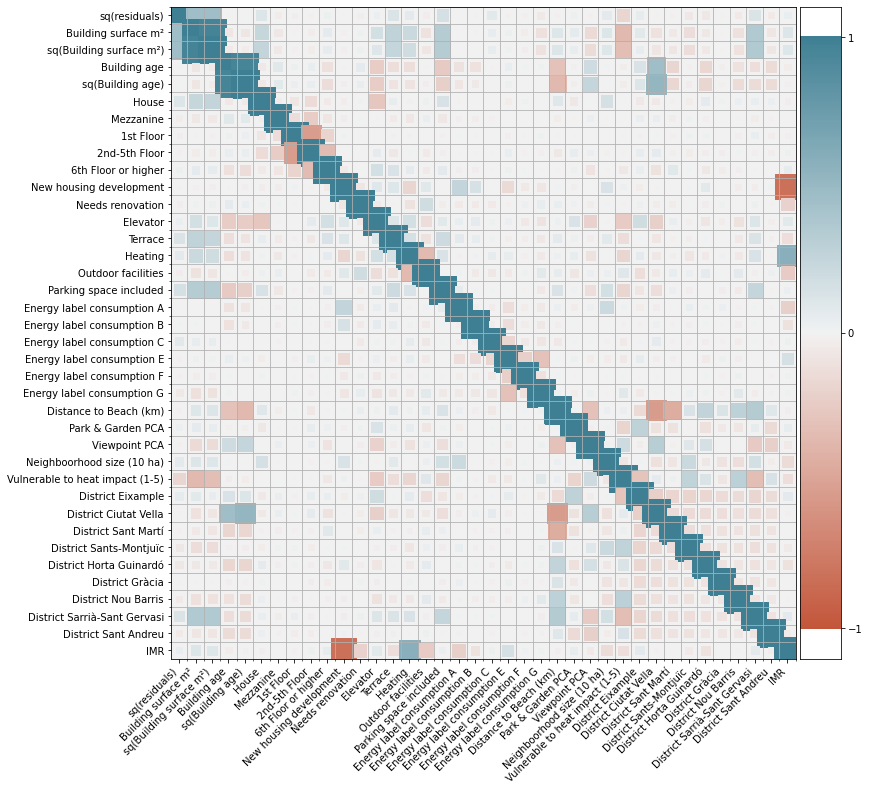

In [80]:
correlation_predictors_with_residuals(df_ols, model_3_predictors_order,'Price', ols_model_3_predictions, 'Predicted Price')

 ### MODEL 3: Semi-Log Hedonic Pricing Model Environmental Dimension of Sustainability

In [81]:
SL_ols_model_3 = estimate_ols_model(df_ols,'Log price', model_3_predictors_order, 'Semi_log_OLS_model', 3, False)
SL_ols_model_3_predictions = SL_ols_model_3[0]
SL_ols_model_3_params = SL_ols_model_3[1]
SL_ols_model_3_result = SL_ols_model_3[2]

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.851
Model:                            OLS   Adj. R-squared:                  0.850
Method:                 Least Squares   F-statistic:                     2121.
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:39:51   Log-Likelihood:                 294.88
No. Observations:               13358   AIC:                            -513.8
Df Residuals:                   13320   BIC:                            -228.8
Df Model:                          37                                         
Covariance Type:                  HC1                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: -1.9602079105476964e-12
Skewness Residual is: -0.02577486250442058, note: normal skewness is 0
Skewness Residuals test statistic: -1.2165057204472387
Skewness Residual p-value: 0.2237923332416205
Kurtosis Residuals is: 0.7115856046352622, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 12.575758611128572
Kurtosis Residual p-value: 2.8703170057999775e-36
Distribution Residuals:


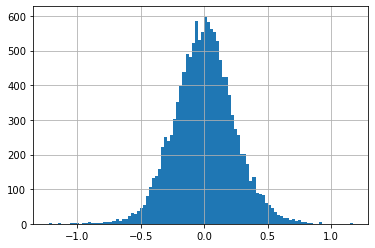

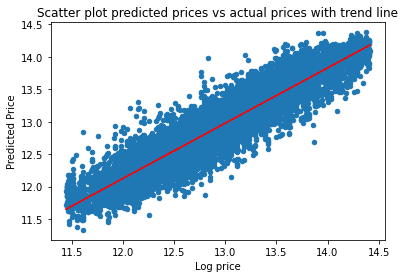

In [82]:
residuals_distribution(df_ols, SL_ols_model_3_predictions, 'Log price','Predicted Price')

*2: Ramsey RESET TEST*

In [83]:
ramsey_reset(SL_ols_model_3_result, 2)

Ramsey RESET test results:
<F test: F=3.3206204482122805, p=0.06843841789710231, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticity*

In [84]:
heteroskedasticity(df_ols,SL_ols_model_3_result.resid,model_3_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation Predictors with squared residuals*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


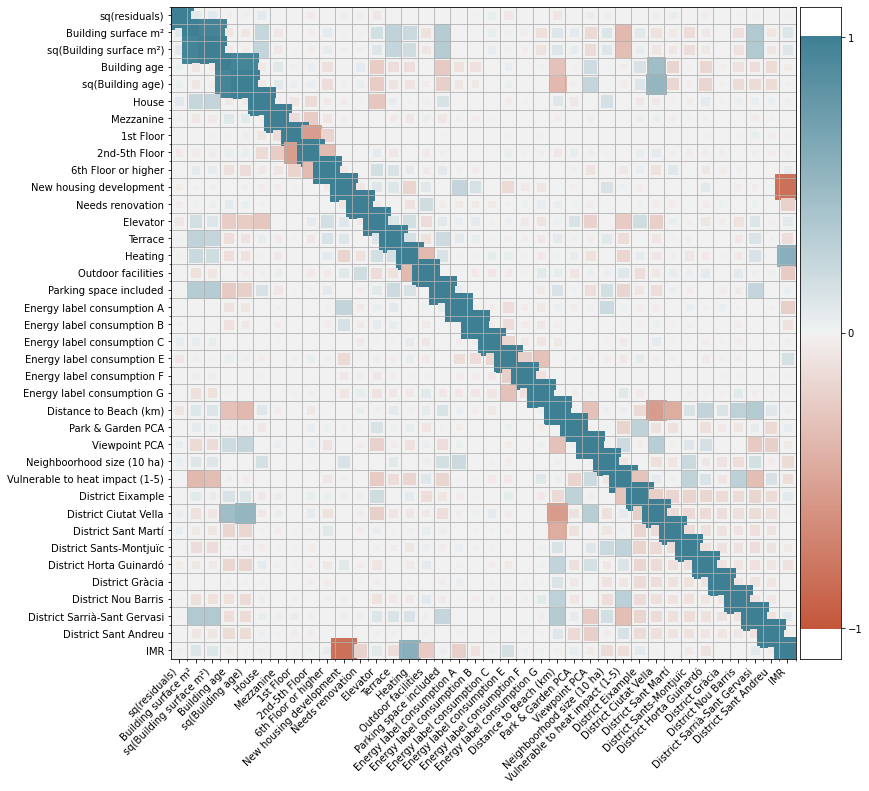

In [85]:
correlation_predictors_with_residuals(df_ols, model_3_predictors_order,'Log price', SL_ols_model_3_predictions, 'Predicted Price')

In [86]:
for col in df_ols.columns:
    print(col)

Building surface m²
Flat
Penthouse
Duplex
House
1st Floor
2nd Floor
3th Floor
4th Floor
5th Floor
6th Floor
7th Floor
8th Floor
9th Floor
10th Floor
11th Floor
12th Floor
13th Floor
14th Floor
15th Floor
16th Floor
17th Floor
18th Floor
19th Floor
20th Floor
21th Floor
22th Floor
23th Floor
24th Floor
25th Floor
26th Floor
27th Floor
28th Floor
29th Floor
30th Floor
31th Floor
32th Floor
33th Floor
34th Floor
35th Floor
36th Floor
37th Floor
38th Floor
39th Floor
Basement
Ground Floor
Mezzanine
Elevator
Swimming pool
Green Area
Garden
Air conditioning
bedrooms
bathrooms
Building age
Terrace
Balcony
Heating
Parking space included
New housing development
Good condition
Needs renovation
energy_label_emmision_A
Energy label consumption A
energy_label_emmision_B
Energy label consumption B
energy_label_emmision_C
Energy label consumption C
energy_label_emmision_D
Energy label consumption D
energy_label_emmision_E
Energy label consumption E
energy_label_emmision_F
Energy label consumption F
e

## MODEL 4: Social Dimension of Sustainability

### SET-UP: Predictors Order

In [87]:
model_4_predictors_order = ['Building surface m²',
                         'sq(Building surface m²)',
 'Building age',
 'sq(Building age)',
                         
#'Building surface m² x Building age',
 'House',
 'Mezzanine',
 '1st Floor',
 #'2nd Floor',
 #'3th Floor',
#'4th Floor',
 #'5th Floor',
                            '2nd-5th Floor',
 '6th Floor or higher',
 'New housing development',
 'Needs renovation',
 'Elevator',
 'Terrace',
 #'Balcony',
 'Heating',
 'Outdoor facilities',
 'Parking space included',
 'Energy label consumption A',
 'Energy label consumption B',
 'Energy label consumption C',
 'Energy label consumption E',
 'Energy label consumption F',
 'Energy label consumption G',
'Police PCA',
                             'Bar & Restaurant PCA', 
 #                          'Education Child 0-6 PCA Component 1',
#'Primary & Secundary School PCA Component 1',
#'Primary School & Lower PCA Component 1',
                            'Secondary & Lower School PCA',
#'Secundary School PCA Component 1',
'University PCA',
#'Education Secundary School & University PCA Component 1',

                            #'Pharmacy, Hospital & Clinique PCA Component 1',
                            'Pharmacy PCA',
                            'Hospital & Clinique PCA',
                            'Big Shopping Place PCA',
                            'Social Cohesion Score',
                           # 'Natural population growth %',
                            "Natural population growth ‰",
                           # 'Net immigration rate %',
                          'Net immigration rate ‰',
                            #'under 18 %',
                            #'64 plus %',
                      #      'Life Expectancy',
                            #'Density net (hab/ha)',
                            'Density net ((hab/1000)/ha)',
                            
                            
                            

 'District Eixample',
 'District Ciutat Vella',
 'District Sant Martí',
 'District Sants-Montjuïc',
 'District Horta Guinardó',
 'District Gràcia',
 'District Nou Barris',
 'District Sarrià-Sant Gervasi',
 'District Sant Andreu', 'IMR'
                           ]

### CHECKS:  Before Model Estimation

*1: CORRELATION MATRIX*

CRITICAL: Index: ('Building surface m²', 'sq(Building surface m²)'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building surface m²)', 'Building surface m²'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('Building age', 'sq(Building age)'), Value: 0.9674305580129744 has correlation over absolute 0.5!
CRITICAL: Index: ('Building age', 'Net immigration rate ‰'), Value: 0.5262890897476793 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'Building age'), Value: 0.9674305580129744 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'Bar & Restaurant PCA'), Value: 0.511480731024198 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'Net immigration rate ‰'), Value: 0.5853840075412523 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'District Ciutat Vella'), Value: 0.5250625166120209 has correlation over absolute 0.5!
CRITICAL: In

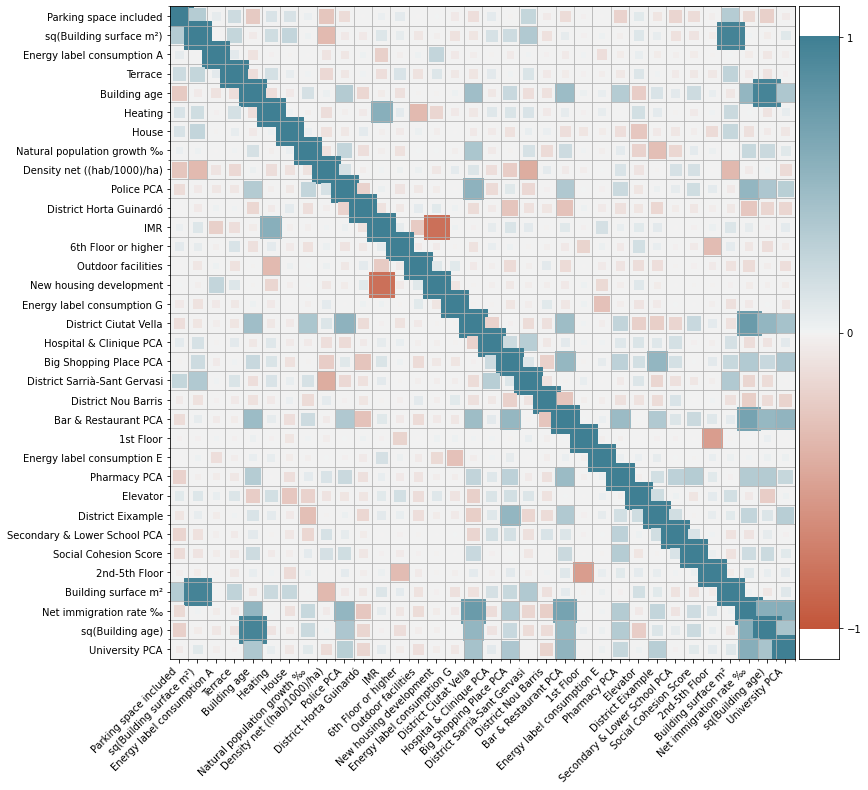

In [88]:
correlation_matrix_with_threshold(df_ols, model_4_predictors_order, 0.25, 'OLS_model', 4)

*2: VIF CHECK*

In [89]:
vif_check(df_ols, model_4_predictors_order, 'OLS_model', 4, False)

VIF results for OLS_model and model number 1 from high to low:
                         feature         VIF
42                           IMR  139.347540
0            Building surface m²  119.306724
2                   Building age  111.857895
3               sq(Building age)   50.876547
1        sq(Building surface m²)   37.951796
32   Density net ((hab/1000)/ha)   22.462425
31        Net immigration rate ‰   17.323902
34         District Ciutat Vella   13.323190
26                  Pharmacy PCA   10.052313
24  Secondary & Lower School PCA    9.324928
23          Bar & Restaurant PCA    9.020553
33             District Eixample    8.425431
11                      Elevator    6.484022
7                  2nd-5th Floor    6.242949
22                    Police PCA    5.938993
28        Big Shopping Place PCA    5.229656
36       District Sants-Montjuïc    4.705627
35           District Sant Martí    4.450315
37       District Horta Guinardó    3.796224
40  District Sarrià-Sant Gervasi    3

### MODEL 4: Traditional Hedonic Pricing Model Social Dimension of Sustainability

In [90]:
ols_model_4 = estimate_ols_model(df_ols,'Price', model_4_predictors_order, 'OLS_model', 4, False)
ols_model_4_predictions = ols_model_4[0]
ols_model_4_params = ols_model_4[1]
ols_model_4_result = ols_model_4[2]


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     760.7
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:39:56   Log-Likelihood:                -84897.
No. Observations:               13358   AIC:                         1.699e+05
Df Residuals:                   13314   BIC:                         1.702e+05
Df Model:                          43                                         
Covariance Type:                  HC1                                         
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: 3.817968356666029e-11
Skewness Residual is: 0.6788562118299964, note: normal skewness is 0
Skewness Residuals test statistic: 29.182052014710205
Skewness Residual p-value: 3.276633213086488e-187
Kurtosis Residuals is: 4.574145258997177, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 37.00674430122727
Kurtosis Residual p-value: 8.920443072185427e-300
Distribution Residuals:


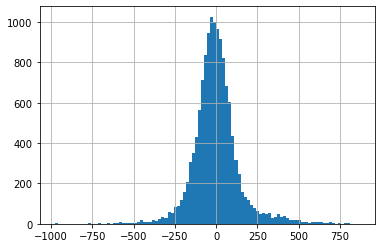

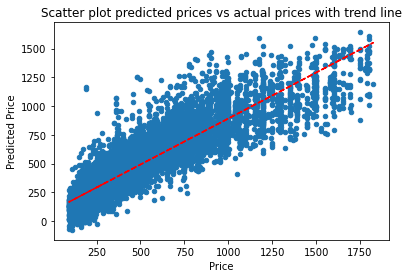

In [91]:
residuals_distribution(df_ols, ols_model_4_predictions, 'Price','Predicted Price')

*2: Ramsey Reset*

In [92]:
ramsey_reset(ols_model_4_result, 2)

Ramsey RESET test results:
<F test: F=927.8693213757516, p=4.564287326053456e-197, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticty*

In [93]:
heteroskedasticity(df_ols,ols_model_4_result.resid, model_4_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation residuals with predictors*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


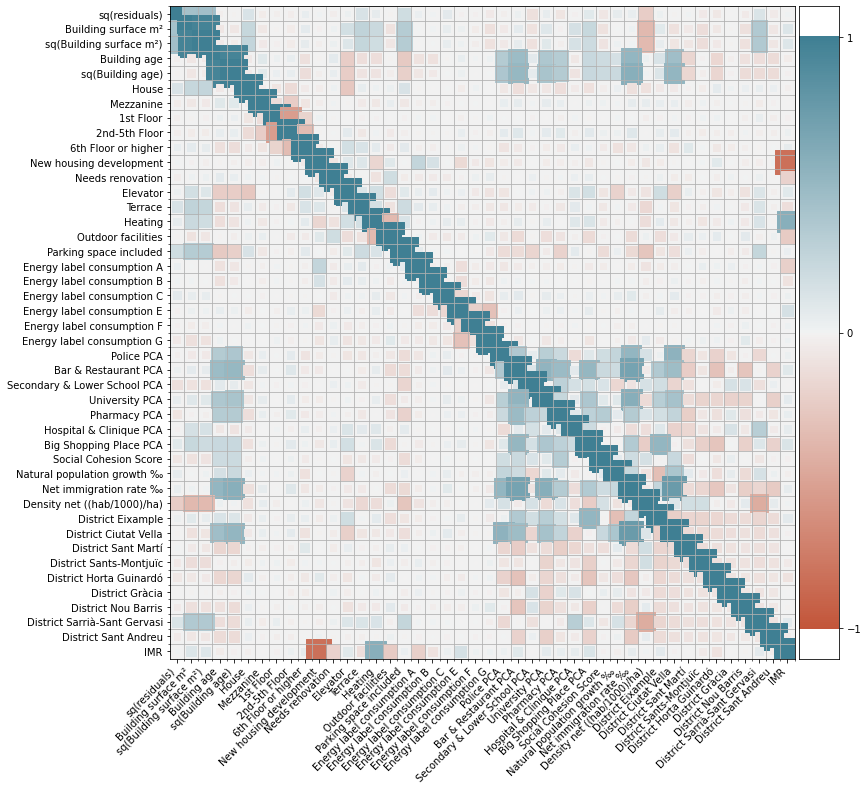

In [94]:
correlation_predictors_with_residuals(df_ols, model_4_predictors_order,'Price', ols_model_4_predictions, 'Predicted Price')

### MODEL 4: Semi-Log Hedonic Pricing Model Social Dimension of Sustainability

In [95]:
SL_ols_model_4 = estimate_ols_model(df_ols,'Log price', model_4_predictors_order, 'Semi_log_OLS_model', 4, False)
SL_ols_model_4_predictions = SL_ols_model_4[0]
SL_ols_model_4_params = SL_ols_model_4[1]
SL_ols_model_4_result = SL_ols_model_4[2]

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.846
Model:                            OLS   Adj. R-squared:                  0.846
Method:                 Least Squares   F-statistic:                     1837.
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:39:58   Log-Likelihood:                 99.288
No. Observations:               13358   AIC:                            -110.6
Df Residuals:                   13314   BIC:                             219.4
Df Model:                          43                                         
Covariance Type:                  HC1                                         
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: 8.244431405639199e-13
Skewness Residual is: -0.07830619492396701, note: normal skewness is 0
Skewness Residuals test statistic: -3.6908264313053314
Skewness Residual p-value: 0.00022352663036008245
Kurtosis Residuals is: 0.8300068945112153, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 14.09970887904641
Kurtosis Residual p-value: 3.813395688553001e-45
Distribution Residuals:


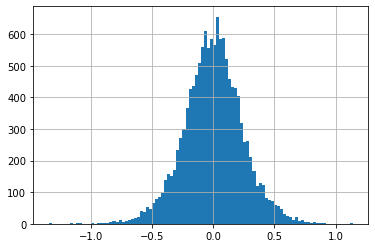

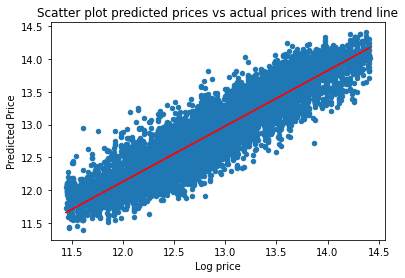

In [96]:
residuals_distribution(df_ols, SL_ols_model_4_predictions, 'Log price','Predicted Price')

*2: Ramsey RESET TEST*

In [97]:
ramsey_reset(SL_ols_model_4_result, 2)

Ramsey RESET test results:
<F test: F=0.2612240366543666, p=0.6092889453640313, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticity*

In [98]:
heteroskedasticity(df_ols,SL_ols_model_4_result.resid, model_4_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation Predictors with squared residuals*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


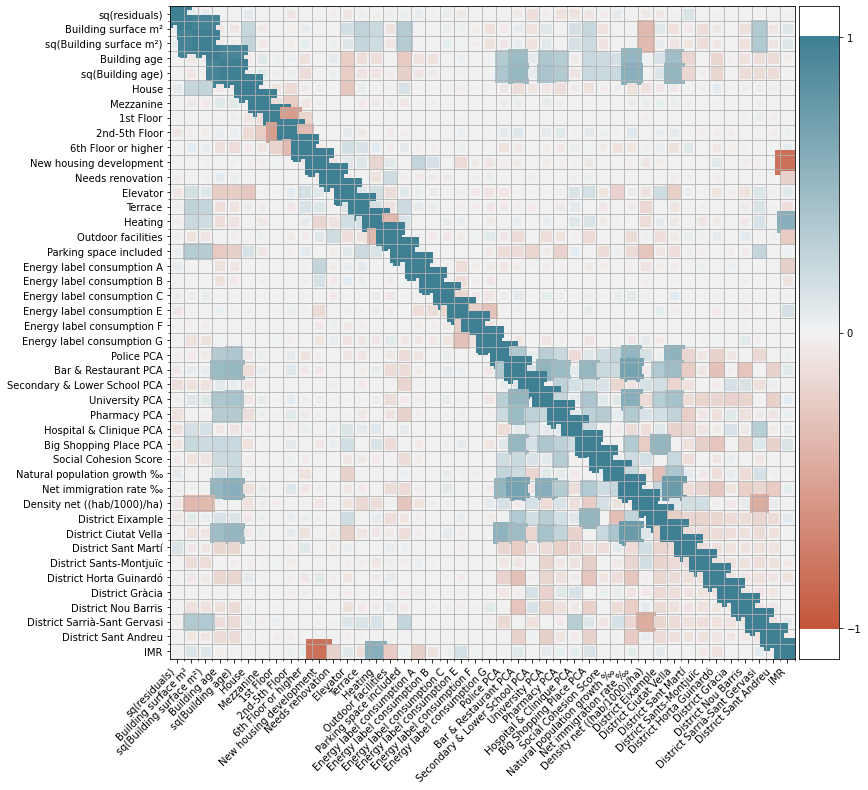

In [99]:
correlation_predictors_with_residuals(df_ols, model_4_predictors_order,'Log price', SL_ols_model_4_predictions, 'Predicted Price')

## MODEL 5: Cultural Dimension of Sustainability

### SET-UP: Predictors Order

In [100]:
model_5_predictors_order = ['Building surface m²',
                         'sq(Building surface m²)',
 'Building age',
 'sq(Building age)',
                         
#'Building surface m² x Building age',
 'House',
 'Mezzanine',
 '1st Floor',
 #'2nd Floor',
 #'3th Floor',
 #'4th Floor',
 #'5th Floor',
                            '2nd-5th Floor',
 '6th Floor or higher',
 'New housing development',
 'Needs renovation',
 'Elevator',
 'Terrace',
# 'Balcony',
 'Heating',
 'Outdoor facilities',
 'Parking space included',
 'Energy label consumption A',
 'Energy label consumption B',
 'Energy label consumption C',
 'Energy label consumption E',
 'Energy label consumption F',
 'Energy label consumption G','Performing Arts PCA',
                             'Religious Institution PCA',
                          #  'Museum & Library PCA Component 1',
                           #  'POI Culture PCA Component 1',
                            'Museum, Library & POI Cult. PCA',
 'District Eixample',
 'District Ciutat Vella',
 'District Sant Martí',
 'District Sants-Montjuïc',
 'District Horta Guinardó',
 'District Gràcia',
 'District Nou Barris',
 'District Sarrià-Sant Gervasi',
 'District Sant Andreu', 'IMR']

### CHECKS:  Before Model Estimation

*1: CORRELATION MATRIX*

CRITICAL: Index: ('Building surface m²', 'sq(Building surface m²)'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building surface m²)', 'Building surface m²'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('Building age', 'sq(Building age)'), Value: 0.9674305580129744 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'Building age'), Value: 0.9674305580129744 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'Performing Arts PCA'), Value: 0.541046564181729 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'District Ciutat Vella'), Value: 0.5250625166120209 has correlation over absolute 0.5!
CRITICAL: Index: ('1st Floor', '2nd-5th Floor'), Value: -0.5361970172365434 has correlation over absolute 0.5!
CRITICAL: Index: ('2nd-5th Floor', '1st Floor'), Value: -0.5361970172365434 has correlation over absolute 0.5!
CRITICAL: Index: ('New housing developm

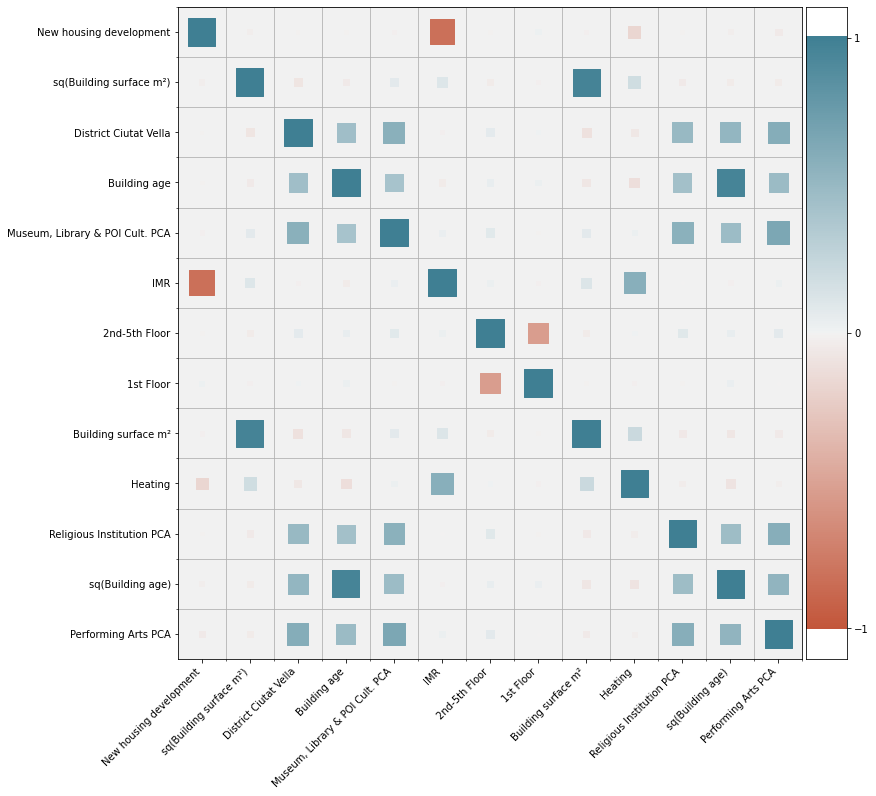

In [101]:
correlation_matrix_with_threshold(df_ols, model_5_predictors_order, 0.5, 'OLS_model', 1)

*2: VIF CHECK*

In [102]:
vif_check(df_ols,model_5_predictors_order, 'OLS_model', 5, False)

VIF results for OLS_model and model number 1 from high to low:
                            feature         VIF
0               Building surface m²  117.991495
34                              IMR  111.323962
2                      Building age  108.629494
3                  sq(Building age)   49.547371
1           sq(Building surface m²)   37.756344
23        Religious Institution PCA    8.718621
26            District Ciutat Vella    6.978792
25                District Eixample    6.615689
11                         Elevator    6.396371
7                     2nd-5th Floor    6.233111
24  Museum, Library & POI Cult. PCA    6.019348
22              Performing Arts PCA    5.425682
28          District Sants-Montjuïc    4.064682
27              District Sant Martí    3.672779
13                          Heating    3.456716
32     District Sarrià-Sant Gervasi    3.422088
6                         1st Floor    3.379317
29          District Horta Guinardó    3.316201
30                  Distr

### MODEL 5: Traditional Hedonic Pricing Model Cultural Dimension of Sustainability

In [103]:
ols_model_5 = estimate_ols_model(df_ols,'Price', model_5_predictors_order, 'OLS_model', 5, False)
ols_model_5_predictions = ols_model_5[0]
ols_model_5_params = ols_model_5[1]
ols_model_5_result = ols_model_5[2]


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.786
Method:                 Least Squares   F-statistic:                     839.8
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:40:02   Log-Likelihood:                -85308.
No. Observations:               13358   AIC:                         1.707e+05
Df Residuals:                   13322   BIC:                         1.710e+05
Df Model:                          35                                         
Covariance Type:                  HC1                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: -2.5604704828069013e-11
Skewness Residual is: 0.6843488798352454, note: normal skewness is 0
Skewness Residuals test statistic: 29.38117371999219
Skewness Residual p-value: 9.556127213328054e-190
Kurtosis Residuals is: 4.362133796872241, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 36.30049933029224
Kurtosis Residual p-value: 1.588834406888689e-288
Distribution Residuals:


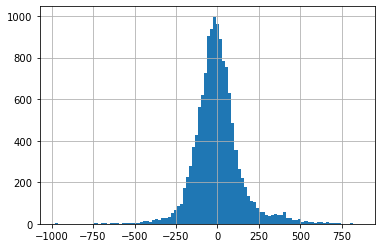

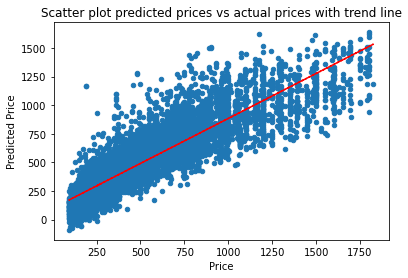

In [104]:
residuals_distribution(df_ols, ols_model_5_predictions, 'Price','Predicted Price')

*2: Ramsey Reset*

In [105]:
ramsey_reset(ols_model_5_result, 2)

Ramsey RESET test results:
<F test: F=714.7812608003849, p=1.9670611006699907e-153, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticty*

In [106]:
heteroskedasticity(df_ols,ols_model_5_result.resid, model_5_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation residuals with predictors*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


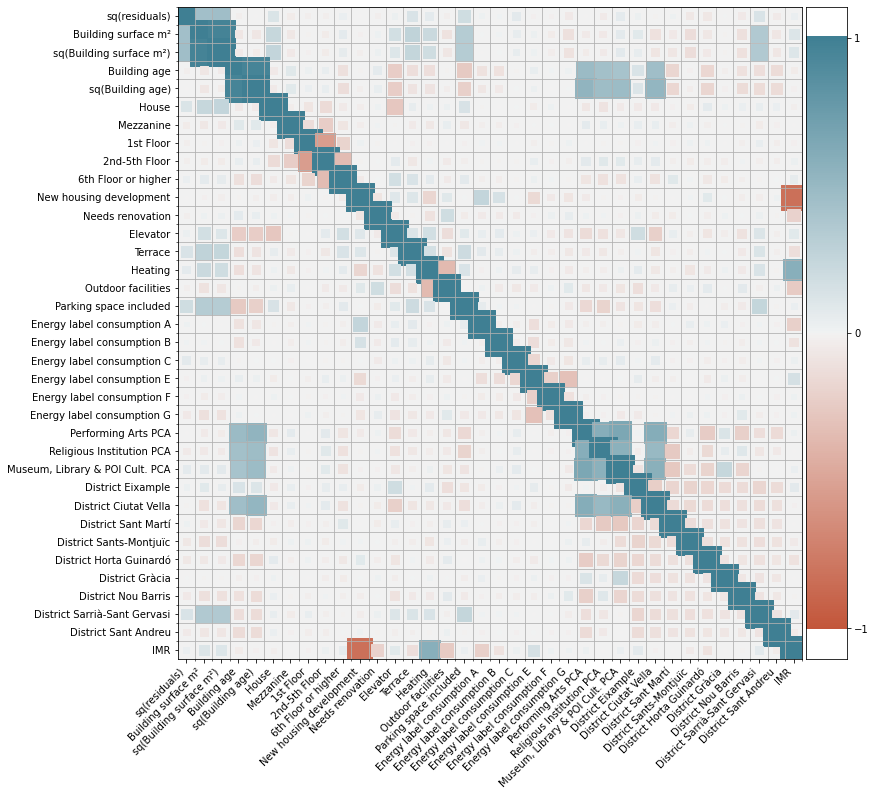

In [107]:
correlation_predictors_with_residuals(df_ols, model_5_predictors_order,'Price', ols_model_5_predictions, 'Predicted Price')

### MODEL 5: Semi-Log Hedonic Pricing Model Cultural Dimension of Sustainability

In [108]:
SL_ols_model_5 = estimate_ols_model(df_ols,'Log price', model_5_predictors_order, 'Semi_log_OLS_model', 5, False)
SL_ols_model_5_predictions = SL_ols_model_5[0]
SL_ols_model_5_params = SL_ols_model_5[1]
SL_ols_model_5_result = SL_ols_model_5[2]

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.835
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     1999.
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:40:04   Log-Likelihood:                -387.67
No. Observations:               13358   AIC:                             847.3
Df Residuals:                   13322   BIC:                             1117.
Df Model:                          35                                         
Covariance Type:                  HC1                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: 4.4799485443556835e-14
Skewness Residual is: -0.08525922475537422, note: normal skewness is 0
Skewness Residuals test statistic: -4.017413519916799
Skewness Residual p-value: 5.884041820058464e-05
Kurtosis Residuals is: 0.5737382077391837, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 10.646582613974122
Kurtosis Residual p-value: 1.8088400447486216e-26
Distribution Residuals:


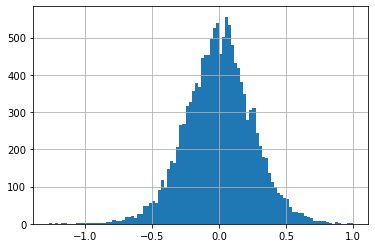

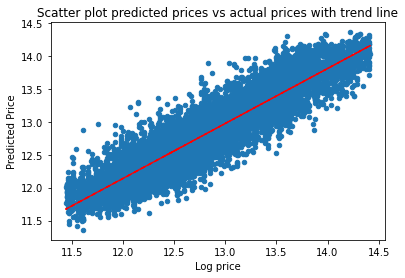

In [109]:
residuals_distribution(df_ols, SL_ols_model_5_predictions, 'Log price','Predicted Price')

*2: Ramsey RESET TEST*

In [110]:
ramsey_reset(SL_ols_model_5_result, 2)

Ramsey RESET test results:
<F test: F=1.4648126123296572, p=0.2261874082529426, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticity*

In [111]:
heteroskedasticity(df_ols,SL_ols_model_5_result.resid, model_5_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation Predictors with squared residuals*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


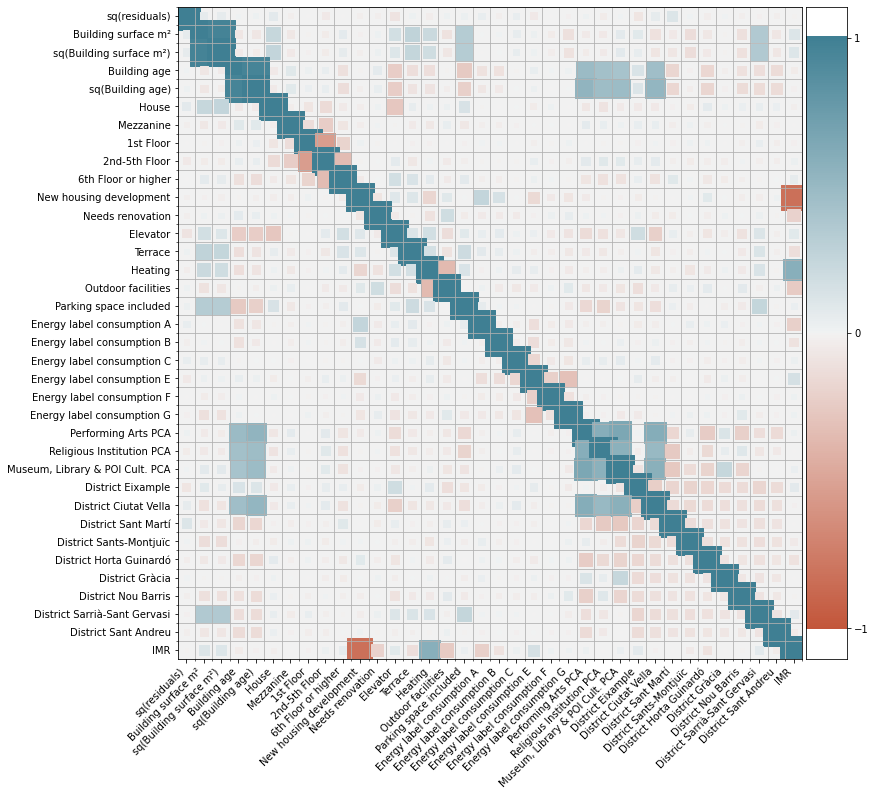

In [112]:
correlation_predictors_with_residuals(df_ols, model_5_predictors_order,'Log price', SL_ols_model_5_predictions, 'Predicted Price')

## MODEL 6: Economic/Financial Dimension of Sustainability

### SET-UP: Predictors Order

In [113]:
model_6_predictors_order = ['Building surface m²',
                         'sq(Building surface m²)',
 'Building age',
 'sq(Building age)',
                         
#'Building surface m² x Building age',
 'House',
 'Mezzanine',
 '1st Floor',
 #'2nd Floor',
 #'3th Floor',
 #'4th Floor',
 #'5th Floor',
                            '2nd-5th Floor',
 '6th Floor or higher',
 'New housing development',
 'Needs renovation',
 'Elevator',
 'Terrace',
# 'Balcony',
 'Heating',
 'Outdoor facilities',
 'Parking space included',
 'Energy label consumption A',
 'Energy label consumption B',
 'Energy label consumption C',
 'Energy label consumption E',
 'Energy label consumption F',
 'Energy label consumption G',
                            
                            #'Income Distribution P80/P20 ratio',
                           # 'AVG Income Household (€)',
                       #   'AVG Unemployment Rate (%)',
                           'Income Distribution PCA', 
                            'Income & Unemployment PCA',
                           # 'sq(Income Distribution PCA Component 1)',
                           # 'sq(Income & Unemployment PCA Component 1)',
 'District Eixample',
 'District Ciutat Vella',
 'District Sant Martí',
 'District Sants-Montjuïc',
 'District Horta Guinardó',
 'District Gràcia',
 'District Nou Barris',
 'District Sarrià-Sant Gervasi',
 'District Sant Andreu', 'IMR'
                           ]

### CHECKS:  Before Model Estimation

*1: CORRELATION MATRIX*

CRITICAL: Index: ('Building surface m²', 'sq(Building surface m²)'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building surface m²)', 'Building surface m²'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('Building age', 'sq(Building age)'), Value: 0.9674305580129744 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'Building age'), Value: 0.9674305580129744 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building age)', 'District Ciutat Vella'), Value: 0.5250625166120209 has correlation over absolute 0.5!
CRITICAL: Index: ('1st Floor', '2nd-5th Floor'), Value: -0.5361970172365434 has correlation over absolute 0.5!
CRITICAL: Index: ('2nd-5th Floor', '1st Floor'), Value: -0.5361970172365434 has correlation over absolute 0.5!
CRITICAL: Index: ('New housing development', 'IMR'), Value: -0.8249767254901489 has correlation over absolute 0.5!
CRITICAL: Index: ('Heating', 'IMR'), Value: 0.

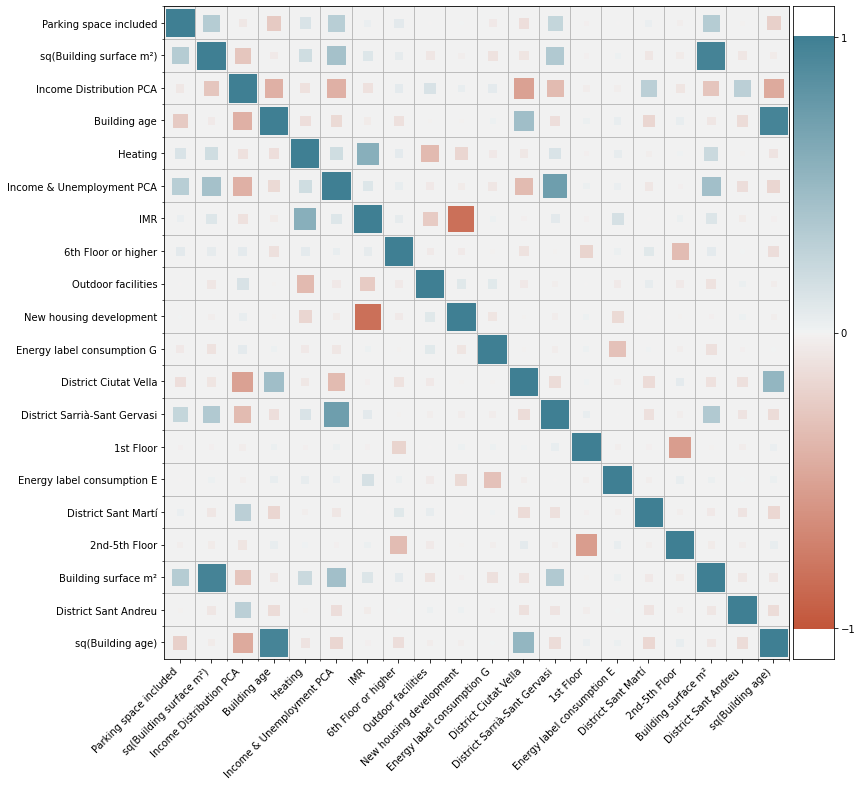

In [114]:
correlation_matrix_with_threshold(df_ols,model_6_predictors_order, 0.3, 'OLS_model', 6)

*2: VIF CHECK*

In [115]:
vif_check(df_ols, model_6_predictors_order, 'OLS_model', 6, False)

VIF results for OLS_model and model number 1 from high to low:
                         feature         VIF
33                           IMR  202.461283
0            Building surface m²  116.814794
2                   Building age  107.588391
3               sq(Building age)   48.302636
1        sq(Building surface m²)   37.483846
22       Income Distribution PCA   29.926289
23     Income & Unemployment PCA   13.817366
25         District Ciutat Vella   12.240838
24             District Eixample    8.216557
11                      Elevator    6.400231
7                  2nd-5th Floor    6.213242
27       District Sants-Montjuïc    5.608373
26           District Sant Martí    4.621542
28       District Horta Guinardó    4.448873
13                       Heating    3.847764
31  District Sarrià-Sant Gervasi    3.726300
30           District Nou Barris    3.682220
32          District Sant Andreu    3.426623
6                      1st Floor    3.380725
29               District Gràcia    3

### MODEL 6: Traditional Hedonic Pricing Model Econimic-Financial Dimension of Sustainability

In [116]:
ols_model_6 = estimate_ols_model(df_ols,'Price', model_6_predictors_order, 'OLS_model', 6, False)
ols_model_6_predictions = ols_model_6[0]
ols_model_6_params = ols_model_6[1]
ols_model_6_result = ols_model_6[2]


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.806
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     950.5
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:40:08   Log-Likelihood:                -84676.
No. Observations:               13358   AIC:                         1.694e+05
Df Residuals:                   13323   BIC:                         1.697e+05
Df Model:                          34                                         
Covariance Type:                  HC1                                         
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: -7.478896874961381e-12
Skewness Residual is: 0.7749225698818647, note: normal skewness is 0
Skewness Residuals test statistic: 32.57091091664323
Skewness Residual p-value: 1.059154818010396e-232
Kurtosis Residuals is: 4.824719783917954, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 37.79911242018353
Kurtosis Residual p-value: 0.0
Distribution Residuals:


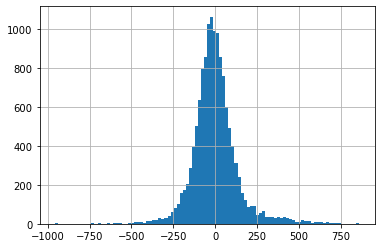

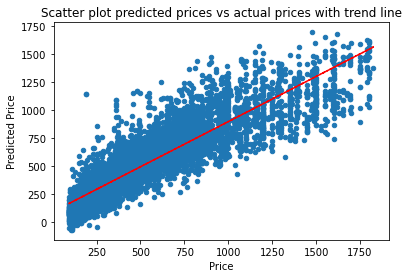

In [117]:
residuals_distribution(df_ols, ols_model_6_predictions, 'Price','Predicted Price')

*2: Ramsey Reset*

In [118]:
ramsey_reset(ols_model_6_result, 2)

Ramsey RESET test results:
<F test: F=568.2574275899962, p=4.973538891121758e-123, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticty*

In [119]:
heteroskedasticity(df_ols,ols_model_6_result.resid, model_6_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation residuals with predictors*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


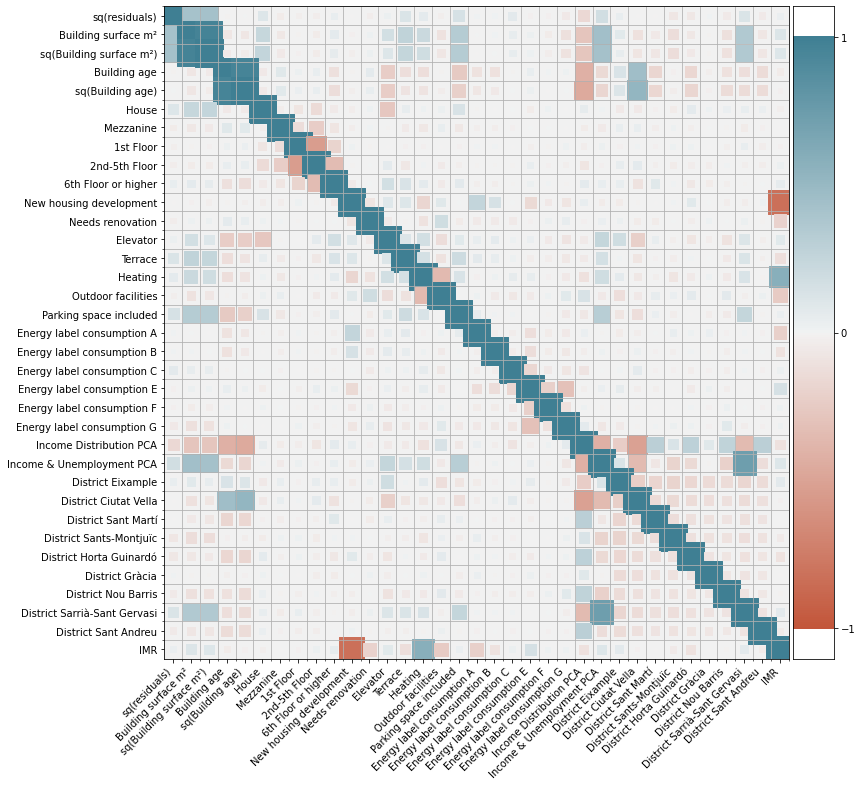

In [120]:
correlation_predictors_with_residuals(df_ols, model_6_predictors_order,'Price', ols_model_6_predictions, 'Predicted Price')

### MODEL 6: Semi-Log Hedonic Pricing Model Econimic-Financial Dimension of Sustainability

In [121]:
SL_ols_model_6 = estimate_ols_model(df_ols,'Log price', model_6_predictors_order, 'Semi_log_OLS_model', 6, False)
SL_ols_model_6_predictions = SL_ols_model_6[0]
SL_ols_model_6_params = SL_ols_model_6[1]
SL_ols_model_6_result = SL_ols_model_6[2]

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.848
Model:                            OLS   Adj. R-squared:                  0.847
Method:                 Least Squares   F-statistic:                     2219.
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:40:10   Log-Likelihood:                 168.13
No. Observations:               13358   AIC:                            -266.3
Df Residuals:                   13323   BIC:                            -3.772
Df Model:                          34                                         
Covariance Type:                  HC1                                         
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: -1.4562096766400379e-13
Skewness Residual is: -0.06146493750201927, note: normal skewness is 0
Skewness Residuals test statistic: -2.8987359249651115
Skewness Residual p-value: 0.003746703108990225
Kurtosis Residuals is: 0.7766187437622194, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 13.426773333326357
Kurtosis Residual p-value: 4.2137524973745525e-41
Distribution Residuals:


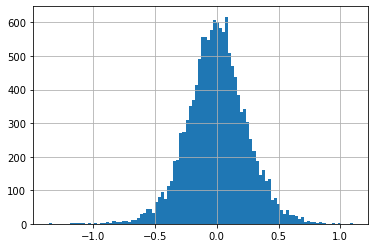

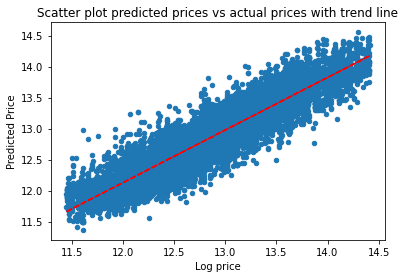

In [122]:
residuals_distribution(df_ols, SL_ols_model_6_predictions, 'Log price','Predicted Price')

*2: Ramsey RESET TEST*

In [123]:
ramsey_reset(SL_ols_model_6_result, 2)

Ramsey RESET test results:
<F test: F=26.134757658945265, p=3.2281416414405254e-07, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticity*

In [124]:
heteroskedasticity(df_ols,SL_ols_model_6_result.resid, model_6_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation Predictors with squared residuals*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


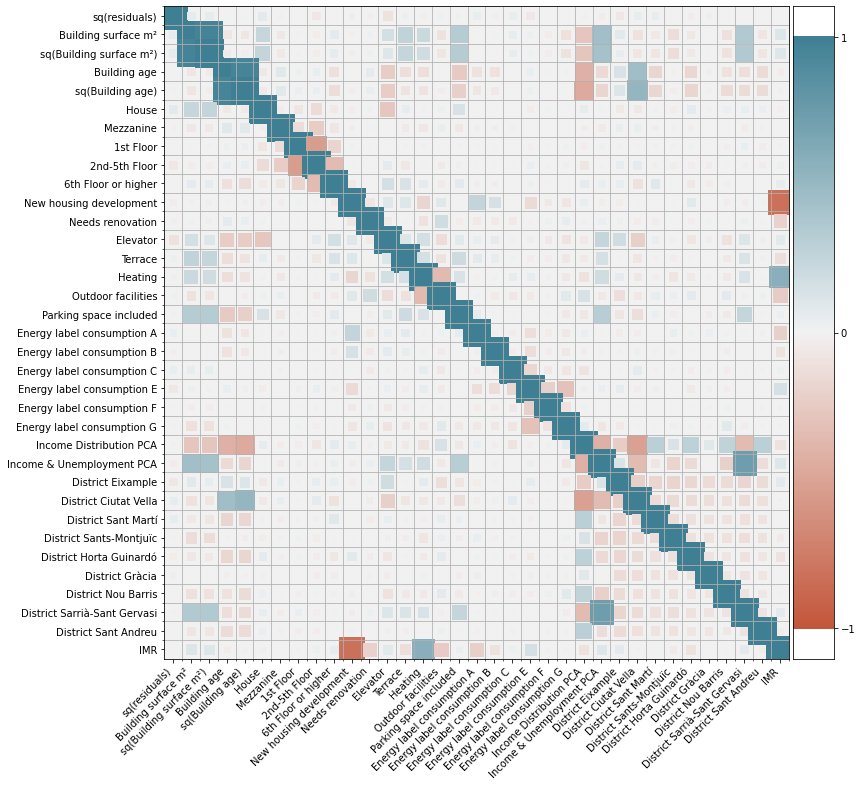

In [125]:
correlation_predictors_with_residuals(df_ols, model_6_predictors_order,'Log price', SL_ols_model_6_predictions, 'Predicted Price')

## MODEL 7: Every Dimension of Sustainability

### SET-UP: Predictors Order

In [126]:
model_7_predictors_order = ['Building surface m²',
                         'sq(Building surface m²)',
 'Building age',
 'sq(Building age)',
                         
#'Building surface m² x Building age',
 'House',
 'Mezzanine',
 '1st Floor',
                            '2nd-5th Floor',
 
 '6th Floor or higher',
 'New housing development',
 'Needs renovation',
 'Elevator',
 'Terrace',
# 'Balcony',
 'Heating',
 'Outdoor facilities',
 'Parking space included',
 'Energy label consumption A',
 'Energy label consumption B',
 'Energy label consumption C',
 'Energy label consumption E',
 'Energy label consumption F',
 'Energy label consumption G',
#'Distance to Highway (km)',
                            
#'Bus PCA Component 1',
#'Train PCA Component 1',
#'Metro PCA Component 1',
# 'Highway & Train PCA Component 1',
  'Bus & Metro PCA',
       'Distance to Highway/Train (km)' ,  
                            
                             'Distance to Beach (km)',
    'Park & Garden PCA',
    'Viewpoint PCA',
 #   'Neighboorhood size (ha)',
                             'Neighboorhood size (10 ha)',
                            
                            
#'Heat comfort level (1-7)',
                             'Vulnerable to heat impact (1-5)',
                            
                            'Police PCA',
                             'Bar & Restaurant PCA', 
 #                          'Education Child 0-6 PCA Component 1',
#'Primary & Secundary School PCA Component 1',
#'Primary School & Lower PCA Component 1',
'Secondary & Lower School PCA',
#'Secundary School PCA Component 1',
'University PCA',
#'Education Secundary School & University PCA Component 1',

                            #'Pharmacy, Hospital & Clinique PCA Component 1',
                            'Pharmacy PCA',
                            'Hospital & Clinique PCA',
                            'Big Shopping Place PCA',
                            'Social Cohesion Score',
                            #'Natural population growth %',
                            "Natural population growth ‰",
                            #'Net immigration rate %',
                            "Net immigration rate ‰",
                            #'under 18 %',
                            #'64 plus %',
                           # 'Life Expectancy',
                         #   'Density (hab/ha)',
                          'Density net ((hab/1000)/ha)',  
                            'Performing Arts PCA',
                             'Religious Institution PCA',
                          #  'Museum & Library PCA Component 1',
                           #  'POI Culture PCA Component 1',
                          #  'Museum & Library PCA Component 1',
                           #  'POI Culture PCA Component 1',
                            'Museum, Library & POI Cult. PCA',
                            
                              
                            #'Income Distribution P80/P20 ratio',
                           # 'AVG Income Household (€)',
                       #   'AVG Unemployment Rate (%)',
                           'Income Distribution PCA', 
                            'Income & Unemployment PCA',
                         #   'sq(Income Distribution PCA Component 1)',
                         #   'sq(Income & Unemployment PCA Component 1)',
'District Eixample',
 'District Ciutat Vella',
 'District Sant Martí',
 'District Sants-Montjuïc',
 'District Horta Guinardó',
 'District Gràcia',
 'District Nou Barris',
 'District Sarrià-Sant Gervasi',
 'District Sant Andreu', 'IMR'
                           ]

### CHECKS:  Before Model Estimation

*1: CORRELATION MATRIX*

CRITICAL: Index: ('Log price', 'Building surface m²'), Value: 0.7782745827851744 has correlation over absolute 0.5!
CRITICAL: Index: ('Log price', 'sq(Building surface m²)'), Value: 0.7067005712376482 has correlation over absolute 0.5!
CRITICAL: Index: ('Log price', 'Vulnerable to heat impact (1-5)'), Value: -0.5566268200870198 has correlation over absolute 0.5!
CRITICAL: Index: ('Log price', 'Income & Unemployment PCA'), Value: 0.56269033401109 has correlation over absolute 0.5!
CRITICAL: Index: ('Building surface m²', 'Log price'), Value: 0.7782745827851744 has correlation over absolute 0.5!
CRITICAL: Index: ('Building surface m²', 'sq(Building surface m²)'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building surface m²)', 'Log price'), Value: 0.7067005712376482 has correlation over absolute 0.5!
CRITICAL: Index: ('sq(Building surface m²)', 'Building surface m²'), Value: 0.9720016374164165 has correlation over absolute 0.5!
CRITICAL: Index: ('

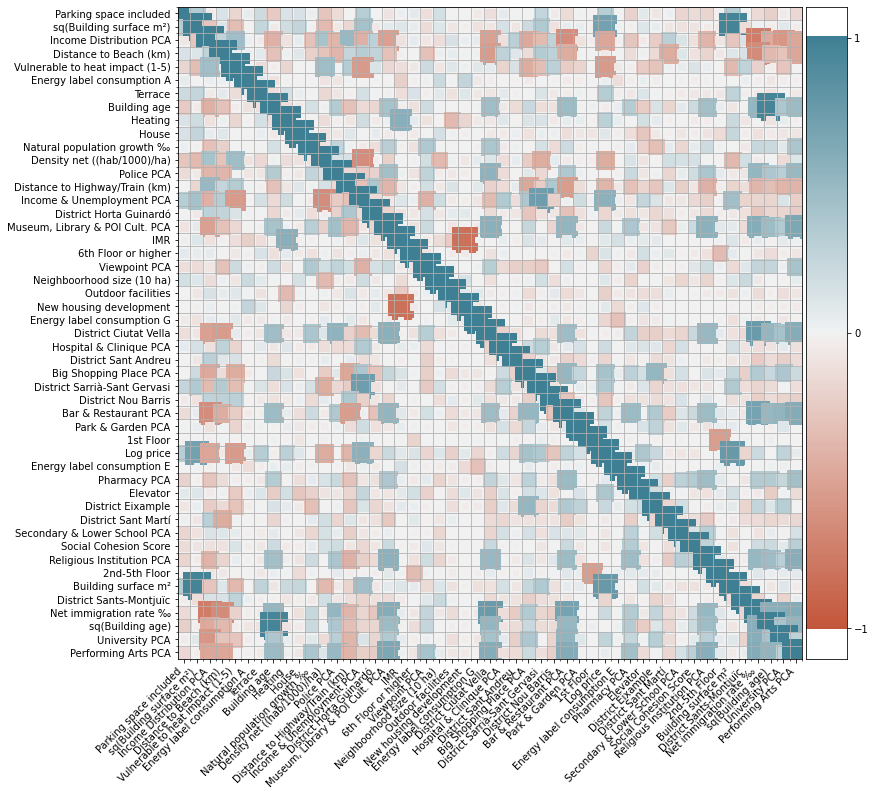

In [127]:
correlation_matrix_with_threshold(df_ols, ['Log price', *model_7_predictors_order], 0.25, 'OLS_model', 7)

*2: VIF CHECK*

In [128]:
vif_check(df_ols, model_7_predictors_order, 'OLS_model', 7, False)

VIF results for OLS_model and model number 1 from high to low:
                            feature         VIF
54                              IMR  572.992341
0               Building surface m²  120.369305
2                      Building age  116.963378
43          Income Distribution PCA   78.704896
3                  sq(Building age)   53.149376
24           Distance to Beach (km)   47.052014
39      Density net ((hab/1000)/ha)   43.588504
38           Net immigration rate ‰   38.490155
1           sq(Building surface m²)   38.345926
28  Vulnerable to heat impact (1-5)   28.727842
44        Income & Unemployment PCA   25.202828
46            District Ciutat Vella   18.547615
41        Religious Institution PCA   13.593828
23   Distance to Highway/Train (km)   12.167329
45                District Eixample   11.542344
31     Secondary & Lower School PCA   11.406386
33                     Pharmacy PCA   11.000739
30             Bar & Restaurant PCA   10.303748
47              District 

### MODEL 7: Traditiona Hedonic Pricing Model Every Dimension of Sustainability

In [129]:
ols_model_7 = estimate_ols_model(df_ols,'Price', model_7_predictors_order, 'OLS_model', 7, False)
ols_model_7_predictions = ols_model_7[0]
ols_model_7_params = ols_model_7[1]
ols_model_7_result = ols_model_7[2]

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.819
Model:                            OLS   Adj. R-squared:                  0.818
Method:                 Least Squares   F-statistic:                     659.1
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:40:18   Log-Likelihood:                -84213.
No. Observations:               13358   AIC:                         1.685e+05
Df Residuals:                   13302   BIC:                         1.690e+05
Df Model:                          55                                         
Covariance Type:                  HC1                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: -1.074224678533438e-10
Skewness Residual is: 0.7075174613406173, note: normal skewness is 0
Skewness Residuals test statistic: 30.213865564857812
Skewness Residual p-value: 1.55736869582677e-200
Kurtosis Residuals is: 4.681100527051427, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 37.350337387359495
Kurtosis Residual p-value: 2.503658469027003e-305
Distribution Residuals:


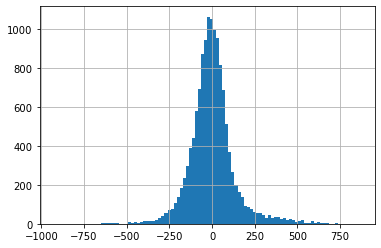

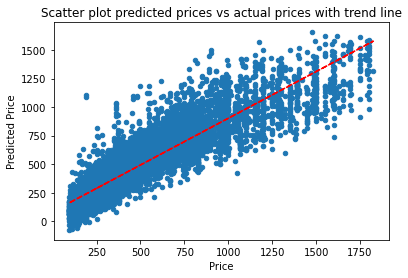

In [130]:
residuals_distribution(df_ols, ols_model_7_predictions, 'Price','Predicted Price')

*2: Ramsey Reset*

In [131]:
ramsey_reset(ols_model_7_result, 2)

Ramsey RESET test results:
<F test: F=944.3110035838807, p=2.1188402351142e-200, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticty*

In [132]:
heteroskedasticity(df_ols,ols_model_7_result.resid, model_7_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation residuals with predictors*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


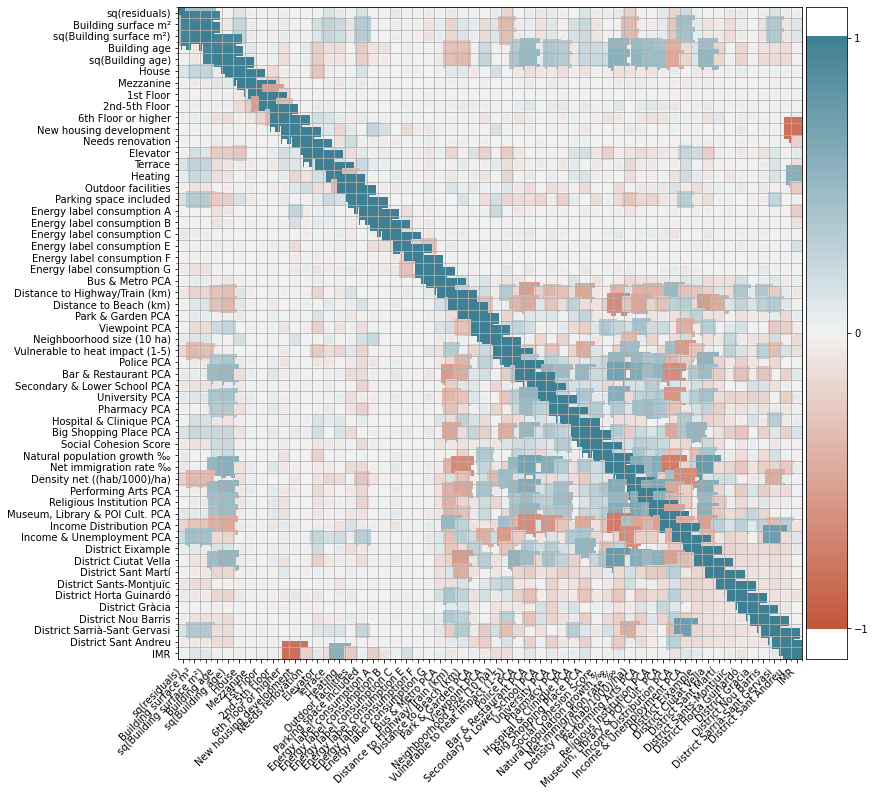

In [133]:
correlation_predictors_with_residuals(df_ols, model_7_predictors_order,'Price', ols_model_7_predictions, 'Predicted Price')

### MODEL 7: Semi-Log Hedonic Pricing Model Every Dimension of Sustainability

In [134]:
SL_ols_model_7 = estimate_ols_model(df_ols,'Log price', model_7_predictors_order, 'Semi_log_OLS_model', 7, False)
SL_ols_model_7_predictions = SL_ols_model_7[0]
SL_ols_model_7_params = SL_ols_model_7[1]
SL_ols_model_7_result = SL_ols_model_7[2]

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.869
Model:                            OLS   Adj. R-squared:                  0.869
Method:                 Least Squares   F-statistic:                     1704.
Date:                Sat, 26 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:40:20   Log-Likelihood:                 1183.8
No. Observations:               13358   AIC:                            -2256.
Df Residuals:                   13302   BIC:                            -1836.
Df Model:                          55                                         
Covariance Type:                  HC1                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

### CHECKS: After Model Estimation

*1: Normal Distribution Residuals*

Average Error: 1.6371539216044886e-13
Skewness Residual is: -0.019802939353261245, note: normal skewness is 0
Skewness Residuals test statistic: -0.9347100981342277
Skewness Residual p-value: 0.34993772136963486
Kurtosis Residuals is: 0.8545618001148441, note: normal kurtosis is 3
Kurtosis Residuals test statistic: 14.401832473012854
Kurtosis Residual p-value: 5.038955136078787e-47
Distribution Residuals:


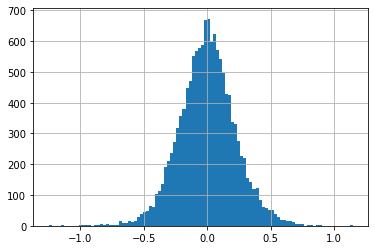

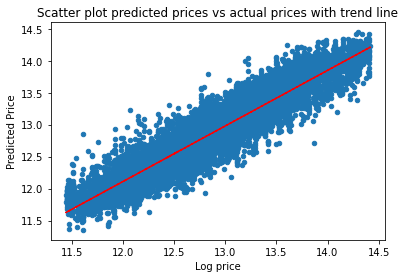

In [135]:
residuals_distribution(df_ols, SL_ols_model_7_predictions, 'Log price','Predicted Price')

*2: Ramsey RESET TEST*

In [136]:
ramsey_reset(SL_ols_model_7_result, 2)

Ramsey RESET test results:
<F test: F=3.8038382873357177, p=0.05115621198467319, df_denom=1.33e+04, df_num=1>


*3: Heteroskedasticity*

In [137]:
heteroskedasticity(df_ols,SL_ols_model_7_result.resid, model_7_predictors_order)

Breusch-Pagan test p-value: 0.0


*4: Correlation Predictors with squared residuals*

Correlation Matrix Squared Residuals And Predictors To Identify Potential Non-Included Relationship Between The Target Var and Predictors in The Pricing Model


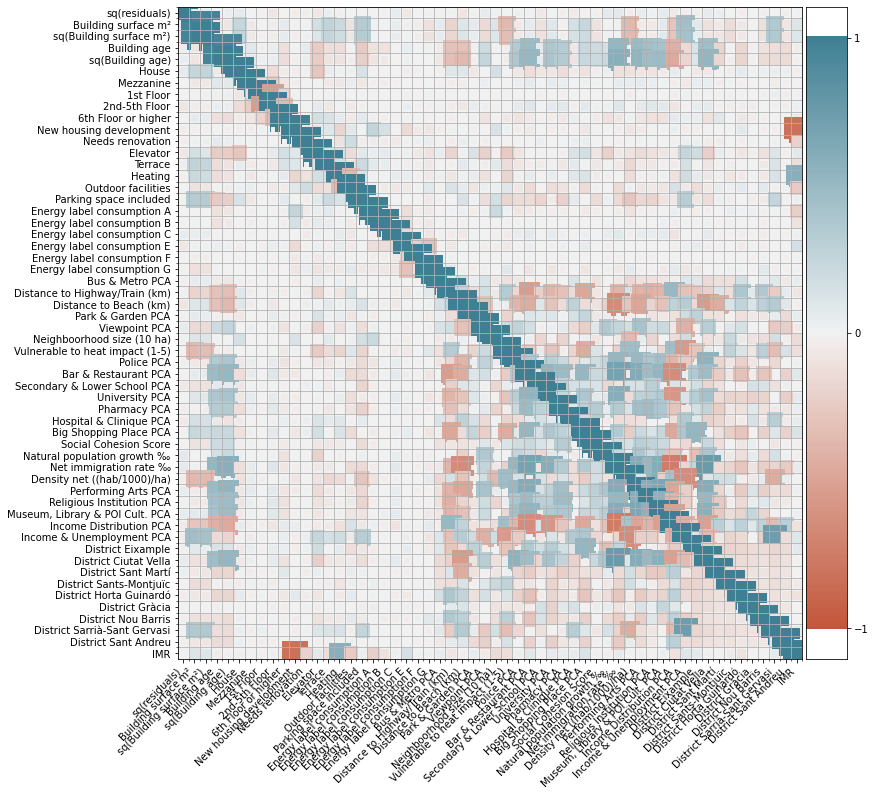

In [138]:
correlation_predictors_with_residuals(df_ols, model_7_predictors_order,'Log price', SL_ols_model_7_predictions, 'Predicted Price')

# VISUALIZATION OF THE RESULTS

## BUILDING THE ENVIRONMENT: VISUALIZATION OF THE RESULTS

**IMPORT AND MERGE: Latitude and Longitude of the Properties**

In [139]:
#import the latitude and longitude of the properties
url_location_properties = "https://raw.githubusercontent.com/NielsUPF/Thesis-MIIS-The-Price-Impact-of-Sustainability-on-Housing-Prices-in-Barcelona/main/Data/Location/long_lat_properties.xlsx"
content_location_properties = requests.get(url_location_properties).content
df_location_properties = pd.read_excel(content_location_properties)
df_location_properties.set_index('id', inplace=True)
df_ols = df_ols.merge(df_location_properties, left_index=True, right_index=True)

**IMPORT AND MATCH: Multipolygon Coordinates of the Subdistrict of the Properties**

In [140]:
"Import DF Polygons Of Subdistrict"
url_polygon_subdistrict = "https://raw.githubusercontent.com/NielsUPF/Thesis-MIIS-The-Price-Impact-of-Sustainability-on-Housing-Prices-in-Barcelona/main/Data/Location/BarcelonaCiutat_Barris.csv"
df_polygon_subdistrict = pd.read_csv(url_polygon_subdistrict )

codi_barris = df_polygon_subdistrict.codi_barri.unique()
subdistricts = df_ols.subdistrict.unique()
dic_codi_barri = {}
manual = []
for code in codi_barris:
    nom_barri = df_polygon_subdistrict[df_polygon_subdistrict.codi_barri == code].nom_barri.unique()[0]
    nom_barri = "Subdistrict " + nom_barri
    #print(nom_barri)
    key = '.'.join([element for element in subdistricts if nom_barri.lower() == element.lower()])
    if key == "":
        manual.append(code)
    else:
        dic_codi_barri[code] = key
    #print(key)
for code in manual:
    nom_barri = df_polygon_subdistrict[df_polygon_subdistrict.codi_barri == code].nom_barri.unique()[0]
    nom_barri = "Subdistrict " + nom_barri
    print(f'code: {code}, district {nom_barri}')
    if code == 2:
        adjusted_nom_barri = 'Subdistrict El Gòtic'
    if code == 4:
        adjusted_nom_barri = 'Subdistrict Sant Pere - Santa Caterina i la Ribera'
    if code == 11:
        adjusted_nom_barri = 'Subdistrict El Poble Sec - Parc de Montjuïc'
    if code == 13:
        adjusted_nom_barri = 'Subdistrict La Marina del Port'
    if code == 17:
        adjusted_nom_barri = 'Subdistrict Sants - Badal'
    if code == 22:
        adjusted_nom_barri = 'Subdistrict Vallvidrera - El Tibidabo i les Planes'
    if code == 25:
        adjusted_nom_barri = 'Subdistrict Sant Gervasi - La Bonanova'
    if code == 26:
        adjusted_nom_barri = 'Subdistrict Sant Gervasi - Galvany'
    if code == 31:
        adjusted_nom_barri = 'Subdistrict Vila de Gràcia'
    if code == 39:
        adjusted_nom_barri = 'Subdistrict Sant Genís Dels Agudells - Montbau'
    if code == 40:
        adjusted_nom_barri = 'Subdistrict Sant Genís Dels Agudells - Montbau'
    if code == 41:
        adjusted_nom_barri = "Subdistrict La Vall d'Hebron - La Clota"
    if code == 42:
        adjusted_nom_barri = "Subdistrict La Vall d'Hebron - La Clota"
    if code == 46:
        adjusted_nom_barri = 'Subdistrict Can Peguera - El Turó de la Peira'
    if code == 47:
        adjusted_nom_barri = 'Subdistrict Can Peguera - El Turó de la Peira'
    if code == 54:
        adjusted_nom_barri = 'Subdistrict Ciutat Meridiana - Torre Baró - Vallbona'
    if code == 55:
        adjusted_nom_barri = 'Subdistrict Ciutat Meridiana - Torre Baró - Vallbona'
    if code == 56:
        adjusted_nom_barri = 'Subdistrict Ciutat Meridiana - Torre Baró - Vallbona'
    if code == 70:
        adjusted_nom_barri = 'Subdistrict El Besòs'
    #print(f'code: {code}, district {nom_barri} changed to {adjusted_nom_barri}')   
        
    dic_codi_barri[code] = adjusted_nom_barri
df_polygon_subdistrict['subdistrict'] =df_polygon_subdistrict['codi_barri'].map(dic_codi_barri)

code: 2, district Subdistrict el Barri Gòtic
code: 4, district Subdistrict Sant Pere, Santa Caterina i la Ribera
code: 11, district Subdistrict el Poble-sec
code: 13, district Subdistrict la Marina de Port
code: 22, district Subdistrict Vallvidrera, el Tibidabo i les Planes
code: 31, district Subdistrict la Vila de Gràcia
code: 39, district Subdistrict Sant Genís dels Agudells
code: 40, district Subdistrict Montbau
code: 41, district Subdistrict la Vall d'Hebron
code: 42, district Subdistrict la Clota
code: 46, district Subdistrict el Turó de la Peira
code: 47, district Subdistrict Can Peguera
code: 54, district Subdistrict Torre Baró
code: 55, district Subdistrict Ciutat Meridiana
code: 56, district Subdistrict Vallbona
code: 70, district Subdistrict el Besòs i el Maresme


In [141]:
subdistricts = df_polygon_subdistrict['subdistrict'].unique()
subdistrict_polygon = {}
for subdistrict in subdistricts:
    polygon_list = df_polygon_subdistrict[df_polygon_subdistrict['subdistrict'] == subdistrict]['geometria_wgs84'].unique()
    result_polygon = Polygon()
    #print(len(polygon_list))
    for polygon in polygon_list:
        polygon = loads(polygon)
        result_polygon = result_polygon.union(polygon)
    subdistrict_polygon[subdistrict] = result_polygon

In [142]:
df_ols['Polygon'] = df_ols['subdistrict'].map(subdistrict_polygon)

**VARIABLES: Housing-Specific Variables**

In [143]:
housing_predictors =['const','Building surface m²',
 'sq(Building surface m²)',
 'Building age',
 'sq(Building age)',
 'House',
 'Mezzanine',
 '1st Floor',
 '2nd-5th Floor'
 '6th Floor or higher',
 'New housing development',
 'Needs renovation',
 'Elevator',
 'Terrace',
# 'Balcony',
 'Heating',
 'Outdoor facilities',
 'Parking included',
 'Energy label consumption A',
 'Energy label consumption B',
 'Energy label consumption C',
 'Energy label consumption E',
 'Energy label consumption F',
 'Energy label consumption G',
                    'IMR']

**VARIABLES: Sustainable-Variables**

In [144]:
sustainable_predictors = ['Bus & Metro PCA',
 'Distance to Highway/Train (km)',
 'Distance to Beach (km)',
 'Park & Garden PCA',
 'Viewpoint PCA',
 'Neighboorhood size (10 ha)',
 'Vulnerable to heat impact (1-5)',
 'Police PCA',
 'Bar & Restaurant PCA',
 'Secondary & Lower School PCA',
 'University PCA',
 'Pharmacy PCA',
 'Hospital & Clinique PCA',
 'Big Shopping Place PCA',
 'Social Cohesion Score',
 'Natural population growth ‰',
'Net immigration rate ‰',
 'Density net ((hab/1000)/ha)',
 'Performing Arts PCA',
 'Religious Institution PCA',
 'Museum, Library & POI Cult. PCA',
 'Income Distribution PCA',
 'Income & Unemployment PCA']

**VARIABLES: Dummy Dustrict Variables**

In [145]:
dummy_district_predictors= [ 'District Eixample',
 'District Ciutat Vella',
 'District Sant Martí',
 'District Sants-Montjuïc',
 'District Horta Guinardó',
 'District Gràcia',
 'District Nou Barris',
 'District Sarrià-Sant Gervasi',
 'District Sant Andreu',
 'District Les Corts']
                          

**DUMMY VARIABLES: Values**

In [146]:
df_ols['Floor'] = df_ols[['House',
 'Mezzanine',
 '1st Floor',
 '2nd Floor',
 '3th Floor',
 '4th Floor',
 '5th Floor','Ground Floor']].idxmax(axis=1)
df_ols['Housing Condition'] = df_ols[['New housing development',
 'Needs renovation','Good condition']].idxmax(axis=1)
df_ols['Energy Label Consumption'] = df_ols[['Energy label consumption A', 'Energy label consumption B','Energy label consumption C','Energy label consumption D',
'Energy label consumption E','Energy label consumption F', 'Energy label consumption NA']].idxmax(axis=1)
df_ols['Energy Label Consumption'] = df_ols['Energy Label Consumption'].replace('Energy label consumption NA', 'Energy label consumption missing')
df_ols['District'] = df_ols[[ 'District Eixample',
 'District Ciutat Vella',
 'District Sant Martí',
 'District Sants-Montjuïc',
 'District Horta Guinardó',
 'District Gràcia',
 'District Nou Barris',
 'District Sarrià-Sant Gervasi',
 'District Sant Andreu', 'District Les Corts']].idxmax(axis=1)

**DUMMY VARIABLES: Categories**

In [147]:
dummy_group = {}
dummy_group['Ground Floor']= 'Floor'
dummy_group['House']= 'Floor'
dummy_group['Mezzanine']= 'Floor'
dummy_group['1st Floor']= 'Floor'
dummy_group['2nd Floor']= 'Floor'
dummy_group['3th Floor']= 'Floor'
dummy_group['4th Floor']= 'Floor'
dummy_group['5th Floor']= 'Floor'
dummy_group['2nd-5th Floor'] = 'Floor'
dummy_group['6th Floor or higher']= 'Floor'
dummy_group['New housing development']= 'Housing Condition'
dummy_group['Good condition']= 'Housing Condition'
dummy_group['Needs renovation']= 'Housing Condition'
dummy_group['Energy label consumption A'] = 'Energy Label Consumption'
dummy_group['Energy label consumption B'] = 'Energy Label Consumption'
dummy_group['Energy label consumption C'] = 'Energy Label Consumption'
dummy_group['Energy label consumption D'] = 'Energy Label Consumption'
dummy_group['Energy label consumption E'] = 'Energy Label Consumption'
dummy_group['Energy label consumption F'] = 'Energy Label Consumption'
dummy_group['Energy label consumption G'] = 'Energy Label Consumption'
dummy_group['Energy label consumption NA'] = 'Energy Label Consumption'
dummy_group['District Eixample'] ='District'
dummy_group['District Ciutat Vella'] ='District'
dummy_group['District Sant Martí'] ='District'
dummy_group['District Sants-Montjuïc'] ='District'
dummy_group['District Horta Guinardó'] = 'District'
dummy_group['District Gràcia'] = 'District'
dummy_group['District Nou Barris'] = 'District'
dummy_group['District Sarrià-Sant Gervasi'] = 'District'
dummy_group['District Sant Andreu'] = 'District'
dummy_group['District Les Corts'] = 'District'

**DUMMY VARIABLES: Reference Category**

In [148]:
ref_group = {}
ref_group['House']= 'Ground Floor'
ref_group['Mezzanine']= 'Ground Floor'
ref_group['1st Floor']= 'Ground Floor'
ref_group['2nd Floor']= 'Ground Floor'
ref_group['3th Floor']= 'Ground Floor'
ref_group['4th Floor']= 'Ground Floor'
ref_group['5th Floor']= 'Ground Floor'
ref_group['2nd-5th Floor'] = 'Ground Floor'
ref_group['6th Floor or higher']= 'Ground Floor'
ref_group['New housing development']= 'Good condition'
ref_group['Good condition']= 'Good condition'
ref_group['Needs renovation']= 'Good condition'
ref_group['Energy label consumption A'] = 'Energy label consumption D'
ref_group['Energy label consumption B'] = 'Energy label consumption D'
ref_group['Energy label consumption C'] =  'Energy label consumption D'
ref_group['Energy label consumption D'] = 'Energy label consumption D'
ref_group['Energy label consumption E'] = 'Energy label consumption D'
ref_group['Energy label consumption F'] = 'Energy label consumption D'
ref_group['Energy label consumption G'] = 'Energy label consumption D'
ref_group['Energy label consumption NA'] = 'Energy label consumption D'
ref_group['District Eixample'] ='District Les Corts'
ref_group['District Ciutat Vella'] ='District Les Corts'
ref_group['District Sant Martí'] ='District Les Corts'
ref_group['District Sants-Montjuïc'] ='District Les Corts'
ref_group['District Horta Guinardó'] = 'District Les Corts'
ref_group['District Gràcia'] = 'District Les Corts'
ref_group['District Nou Barris'] = 'District Les Corts'
ref_group['District Sarrià-Sant Gervasi'] = 'District Les Corts'
ref_group['District Sant Andreu'] = 'District Les Corts'

**VARIABLE TYPES: Housing-Specific Variables**

In [149]:
predictors_housing_type = {}
predictors_housing_type['Building surface m²'] = 'continious'
predictors_housing_type['sq(Building surface m²)'] = 'continious_squared'
predictors_housing_type['Building age'] = 'continious'
predictors_housing_type['sq(Building age)'] = 'continious_squared'
predictors_housing_type['Ground Floor']= 'dummy_group'
predictors_housing_type['House']= 'dummy_group'
predictors_housing_type['Mezzanine']= 'dummy_group'
predictors_housing_type['1st Floor']= 'dummy_group'
#predictors_housing_type['2nd Floor']= 'dummy_group'
#predictors_housing_type['3th Floor']= 'dummy_group'
#predictors_housing_type['4th Floor']= 'dummy_group'
#predictors_housing_type['5th Floor']= 'dummy_group'
predictors_housing_type['2nd-5th Floor'] = 'dummy_group'
predictors_housing_type['6th Floor or higher']= 'dummy_group'
predictors_housing_type['New housing development']= 'dummy_group'
predictors_housing_type['Good condition']= 'dummy_group'
predictors_housing_type['Needs renovation']= 'dummy_group'
predictors_housing_type['Elevator'] = 'dummy_yes_no'
predictors_housing_type['Terrace']  = 'dummy_yes_no'
predictors_housing_type['Balcony'] = 'dummy_yes_no'
predictors_housing_type['Heating'] = 'dummy_yes_no'
predictors_housing_type['Outdoor facilities'] = 'dummy_yes_no'
predictors_housing_type['Parking included'] = 'dummy_yes_no'
predictors_housing_type['Energy label consumption A'] = 'dummy_group'
predictors_housing_type['Energy label consumption B'] = 'dummy_group'
predictors_housing_type['Energy label consumption C'] = 'dummy_group'
predictors_housing_type['Energy label consumption D'] = 'dummy_group'
predictors_housing_type['Energy label consumption E'] = 'dummy_group'
predictors_housing_type['Energy label consumption F'] = 'dummy_group'
predictors_housing_type['Energy label consumption G'] = 'dummy_group'
predictors_housing_type['Energy label consumption NA'] = 'dummy_group'
predictors_housing_type['IMR'] = 'continious'

**VARIABLE TYPES: Sustainable Variables**

In [150]:
predictors_sustainable_type = {}
predictors_sustainable_type['Bus & Metro PCA'] =  'continious'
predictors_sustainable_type['Distance to Highway/Train (km)'] = 'continious'
predictors_sustainable_type['Distance to Beach (km)'] = 'continious'
predictors_sustainable_type['Park & Garden PCA'] = 'continious'
predictors_sustainable_type['Viewpoint PCA'] = 'continious'
predictors_sustainable_type['Neighboorhood size (10 ha)'] = 'continious'
predictors_sustainable_type['Vulnerable to heat impact (1-5)'] = 'continious'
predictors_sustainable_type['Police PCA'] = 'continious'
predictors_sustainable_type['Bar & Restaurant PCA'] = 'continious'
predictors_sustainable_type['Secundary & Lower School PCA'] = 'continious'
predictors_sustainable_type['University PCA'] = 'continious'
predictors_sustainable_type['Pharmacy PCA'] = 'continious'
predictors_sustainable_type['Hospital & Clinique PCA'] = 'continious'
predictors_sustainable_type['Big Shopping Place PCA'] = 'continious'
predictors_sustainable_type['Social Cohesion Score'] = 'continious'
predictors_sustainable_type['Natural population growth ‰'] = 'continious'
predictors_sustainable_type['Net immigration rate ‰'] = 'continious'
predictors_sustainable_type['Density net ((hab/1000)/ha)'] = 'continious'
predictors_sustainable_type['Performing Arts PCA'] = 'continious'
predictors_sustainable_type['Religious Institution PCA'] = 'continious'
predictors_sustainable_type['Museum, Library & POI Cult. PCA'] = 'continious'
predictors_sustainable_type['Income Distribution PCA'] = 'continious'
predictors_sustainable_type['Income & Unemployment PCA'] = 'continious'
#predictors_sustainable_type['sq(Income & Unemployment PCA Component 1)']   = 'continious_squared'
#predictors_sustainable_type['sq(Income Distribution PCA Component 1)']  = 'continious_squared'

**VARIABLE TYPES: Dummy District Variables**

In [151]:
district_dummy_type = {}
district_dummy_type['District Eixample'] = 'dummy_group'
district_dummy_type['District Ciutat Vella'] ='dummy_group'
district_dummy_type['District Sant Martí'] = 'dummy_group'
district_dummy_type['District Sants-Montjuïc'] ='dummy_group'
district_dummy_type['District Horta Guinardó'] = 'dummy_group'
district_dummy_type['District Gràcia'] = 'dummy_group'
district_dummy_type['District Nou Barris'] = 'dummy_group'
district_dummy_type['District Sarrià-Sant Gervasi'] = 'dummy_group'
district_dummy_type['District Sant Andreu'] = 'dummy_group'
district_dummy_type['District Les Corts'] = 'dummy_group'
district_dummy_type['District Les Corts'] = 'dummy_group'

### FUCTIONS:  VISUALIZATIONS OF THE RESULTS

**Clustering of the Properties based on Longitude and Latitude Values**<br> <br>
*Parameters:*<br> <br>

*DF: dataframe which includes longitude and latitude of properties* <br>
*long_col: Name of the Longitude Column <br>* 
*lat_col: Name of the Latitude Column <br>* 
*k: Number of Clusters

In [152]:
def cluster_latitude_longitude_points(df, long_col, lat_col, k):
    # Create a DataFrame with latitude and longitude columns
    coordinates = coordinates = df[[long_col, lat_col]]
    
    # Apply K-means clustering algorithm
    kmeans = KMeans(n_clusters=k, random_state = 100)
    kmeans.fit(coordinates)
    
    # Get the cluster labels for each point
    labels = kmeans.labels_
    
    # Add the cluster labels as a new column in the DataFrame
    df['cluster'] = labels
    #Set up to count n_obs in cluster later, when all obs in cluster are grouped
    df['n_obs_cluster'] = 1
    return df

**Number of Stars For Significance Coefficients**<br> <br>
*Parameters:*<br> <br>

*p-value: p-value of a coefficient*

In [153]:

def n_stars(p_value):
    if p_value < 0.01: #Significant at 1% level
        stars = '***'
    elif p_value < 0.05: #Significant at 5% level
        stars = '**'
    elif p_value < 0.1: #Significant at 10% level
        stars = "*"
    else:
        stars = ""
    return stars


**Function For The Creation of the Demonstrative Map**<br> <br>
*Parameters:*<br> <br>

<u>For a Specification of the Parameters, see table 11: in the research paper </u> <br>
*screenshot table:*
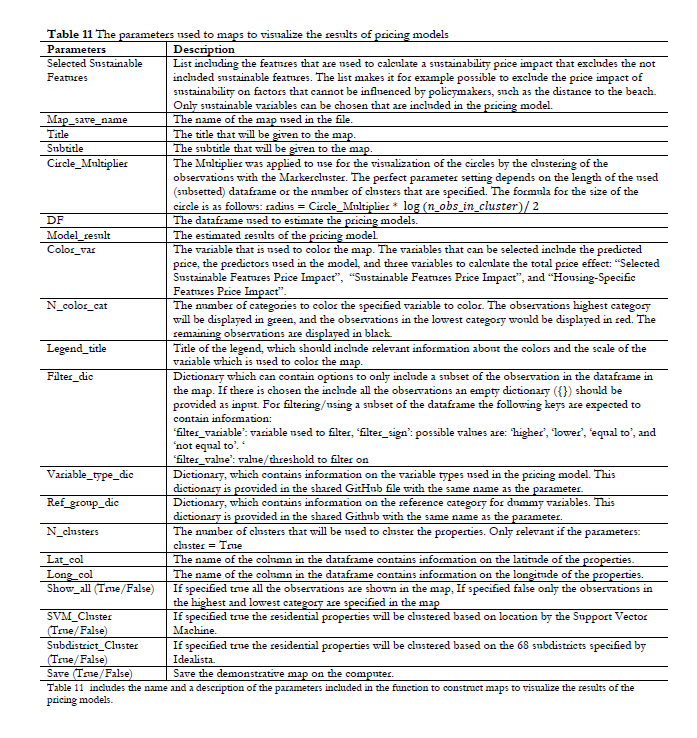

In [154]:
dic_codes_subdistrict = {}
subdistrict_keys = set(dic_codi_barri.values())
i=1
for key in subdistrict_keys:
    dic_codes_subdistrict[key] = i
    i +=1
dic_codes_subdistrict

{'Subdistrict Sant Gervasi - La Bonanova': 1,
 'Subdistrict El Baix Guinardó': 2,
 'Subdistrict Hostafrancs': 3,
 'Subdistrict La Teixonera': 4,
 'Subdistrict El Clot': 5,
 'Subdistrict El Bon Pastor': 6,
 'Subdistrict El Parc i la Llacuna del Poblenou': 7,
 'Subdistrict Sant Genís Dels Agudells - Montbau': 8,
 'Subdistrict Sants - Badal': 9,
 'Subdistrict Les Tres Torres': 10,
 "Subdistrict El Camp d'En Grassot i Gràcia Nova": 11,
 'Subdistrict Vila de Gràcia': 12,
 'Subdistrict El Poble Sec - Parc de Montjuïc': 13,
 'Subdistrict La Vila Olímpica del Poblenou': 14,
 'Subdistrict Baró de Viver': 15,
 'Subdistrict Diagonal Mar i el Front Marítim del Poblenou': 16,
 'Subdistrict Les Roquetes': 17,
 'Subdistrict La Salut': 18,
 'Subdistrict Sarrià': 19,
 'Subdistrict La Trinitat Vella': 20,
 "Subdistrict La Font d'En Fargues": 21,
 'Subdistrict El Carmel': 22,
 'Subdistrict Pedralbes': 23,
 'Subdistrict La Trinitat Nova': 24,
 'Subdistrict La Prosperitat': 25,
 'Subdistrict Porta': 26,
 "

In [155]:
def sus_map(selected_sustainable_predictors, map_save_name, title,subtitle, legend_title,circle_multiplier, df,model_result, color_var,n_color_cat,model_predictors, filter_dic, variable_type_dic, dummy_group_dic, ref_group_dic, n_clusters,lat_col, long_col, show_all=True, svm_cluster=False,subdistrict_cluster=False, save=False):
    housing_specific_shown = True
    dummy_district_shown = True
    X = df[model_predictors]
    X = sm.add_constant(X)
    df['Predicted Price'] = model_result.predict(X)
    df['Selected Sustainable Features Price Impact'] = 0
    df['Sustainable Features Price Impact'] = 0
    df['Housing-Specific Features Price Impact'] = model_result.params['const']
    df['Dummy District Price Impact'] = 0.0
    for predictor in model_predictors:
        if predictor in sustainable_predictors:
            df['Sustainable Features Price Impact'] = df['Sustainable Features Price Impact'] + model_result.params[predictor] * df[predictor]
        elif predictor in housing_predictors:
            df['Housing-Specific Features Price Impact'] = df['Housing-Specific Features Price Impact'] + model_result.params[predictor] * df[predictor]
        elif predictor in dummy_district_predictors:
             df['Dummy District Price Impact'] = df['Dummy District Price Impact'] + model_result.params[predictor] * df[predictor]
    for predictor in model_predictors:
        if predictor in selected_sustainable_predictors:
            df['Selected Sustainable Features Price Impact'] = df['Selected Sustainable Features Price Impact'] + model_result.params[predictor]  * df[predictor]
    df['Selected Sustainable Features Price Impact %'] =   df['Selected Sustainable Features Price Impact']  /  (df['Sustainable Features Price Impact']+  df['Housing-Specific Features Price Impact']+df['Dummy District Price Impact'])
    df['Sustainable Features Price Impact %'] = df['Sustainable Features Price Impact'] / (df['Sustainable Features Price Impact']+ df['Housing-Specific Features Price Impact']+df['Dummy District Price Impact'])
    df['Housing-Specific Features Price Impact %'] =  df['Housing-Specific Features Price Impact'] /  (df['Sustainable Features Price Impact']+ df['Housing-Specific Features Price Impact']+df['Dummy District Price Impact'])
    df['Dummy District Price Impact %'] = df['Dummy District Price Impact'] / (df['Sustainable Features Price Impact']+ df['Housing-Specific Features Price Impact']+df['Dummy District Price Impact'])
    
    
    if bool(filter_dic):
        try:
            print(filter_dic)
            filter_sign = filter_dic['filter_sign']
            filter_variable = filter_dic['filter_variable']
            filter_value = filter_dic['filter_value']
            if filter_sign == 'higher':   
                df_use = df[df[filter_variable] > filter_value]
            elif filter_sign == 'lower':
                df_use = df[df[filter_variable] > filter_value]
                print(len(df_use))
            elif filter_sign == 'not equal to':
                df_use = df[df[filter_variable] != filter_value]
            elif filter_sign == 'equal to':
                df_use = df[df[filter_variable] == filter_value]
            else:
                print(f'Possible filter signs are: (higher, lower, not equal to, equal to)')
            for i in range(0,1):
                if len(df_use) == 0:
                    print('No Observation in Filtered DataFrame.')
                    break
        except:
            print('Filter Information is not complete')
    else:
        df_use = df
    if svm_cluster == True:
        df_use = cluster_latitude_longitude_points(df_use, long_col, lat_col, n_clusters)
        df_use['n_obs'] = 1
        df_obs_cluster = df_use.groupby('cluster').sum()['n_obs']
        
        df_use = df_use.groupby('cluster').mean()
        df_use = df_use.drop('n_obs', axis=1)
        df_use = df_use.merge(df_obs_cluster, left_index=True, right_index =True)
        housing_specific_shown = False
        dummy_district_shown = False
    if subdistrict_cluster == True:
        df_use['n_obs'] = 1
        df_obs_cluster = df_use.groupby('subdistrict').sum()['n_obs']
        df_use = df_use.groupby('subdistrict').mean()
        df_use = df_use.drop('n_obs', axis=1)
        df_use = df_use.merge(df_obs_cluster, left_index=True, right_index =True)
        housing_specific_shown = False
        dummy_district_shown = False
        #df_use['Polygon'] = df_use.index.map(polygon_subdistrict)
        df_use['Polygon'] = df_use.index.map(subdistrict_polygon)
        df_use['Subdistrict_Code'] = df_use.index.map(dic_codes_subdistrict)
        
    
    df_use['cluster_label'] = pd.qcut(df_use[color_var], n_color_cat, retbins=True, labels=[*range(0,n_color_cat)])[0]
    colors = ['gray'] *  n_color_cat
    colors[0] = 'red'
    colors[-1] = 'green'
    lat = df_use[lat_col].mean()
    long = df_use[long_col].mean()
    barcelona_coords = (lat, long)
    m = folium.Map(location=barcelona_coords, zoom_start=12)
    base_font_size = 12
    zoom_levels = [10, 12, 14]  # Adjust the zoom levels as needed
    

    """<style>
    .cluster-icon {font-size: 60px;
    } 
    </style>"""
    custom_color = """
function(cluster) {
    var markers = cluster.getAllChildMarkers();
    var clusterSize = markers.length;
    var circleSize = Math.log(clusterSize) * circle_multiplier;
    // Set custom color to red for all clusters
    var color = 'red';

    // Create a custom cluster icon
    var icon = L.divIcon({
        html: '<div style="background-color:' + color + '; font-size: 12px; font-weight: bold;font-family: Arial, sans-serif;border-radius: 50%;color: white; width: ' + circleSize + 'px; height: ' + circleSize + 'px; align-items: center; justify-content: center;display: flex;">' + clusterSize + '</div>',
        className: 'custom-cluster-icon',
        iconSize: [clusterSize*2,clusterSize*2]
    });

    return icon;
}
    """
    custom_color = custom_color.replace('circle_multiplier', str(circle_multiplier))
    

    custom_red = custom_color.replace("red", "red")
    custom_green = custom_color.replace("red", "green")
    custom_grey = custom_color.replace("red", "gray")
    color_clusters = {

    "red": plugins.MarkerCluster(disable_clustering_at_zoom=15, icon_create_function=custom_red).add_to(m),
    "gray": plugins.MarkerCluster(disable_clustering_at_zoom=15, icon_create_function=custom_grey).add_to(m),
    "green": plugins.MarkerCluster(disable_clustering_at_zoom=15, icon_create_function=custom_green).add_to(m)
    # Add more clusters for other types of amenities
    }
    #markerCluster = MarkerCluster(disable_clustering_at_zoom=15,spiderfy_on_max_zoom=True).add_to(m)
    m.zoom_control = True
    for row in df_use.itertuples():
        index = row.Index
        if show_all == False and df_use.loc[index, 'cluster_label'] in [*range(1,n_color_cat-1)]:
            pass
        else:
            var_of_filter = df_use.loc[index, color_var]
            #price = df_use.loc[index,'Price'] * 1000
            #predicted_price = df_use.loc[index,'Predicted Price']
            #FORMATTING
            var_of_filter_higher_than = len(df_use[df_use[color_var] < var_of_filter]) / len(df_use)
            #predicted_price_format = f"&#8364 {predicted_price:,.0f}".replace(',', '.')
            #price_format =  f"&#8364 {price:,.0f}".replace(',', '.')
            #HEADERS SET-UP>  {var_of_filter_higher_than:.2f} (<i style= "font-size: 10px;">(>{var_of_filter_higher_than:.0%} of Obs.</p>
            html_header = f""" <p style="font-family: Arial, sans-serif; font-size: 12px; margin: 0.05">
                <b>Information Variable To Color: </b> </p>"""
            html_header += f"""  <p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05"> {color_var} = {var_of_filter:.2f} <i style= "font-size: 9px;">(>{var_of_filter_higher_than:.0%} of Obs.)</i> </p>
            
            """
            html_header += f"""<p> </p>"""
            
            html_general = """
            <p style="font-family: Arial, sans-serif; font-size: 12px; margin: 0.05">
                <b> General Information: </b> </p>

            """
            if df_use.loc[index,'Predicted Price'] < 100:
                line =  f""" <p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05"> 
                The log predicted price = {df_use.loc[index,'Predicted Price']:.2f} &
                log listing price = {df_use.loc[index,'Log price']:.2f} </p>"""
                html_general += line
                predicted_price_format = f"&#8364 {np.exp(df_use.loc[index, 'Predicted Price']):,.0f}".replace(',', '.')
                log_price_format =  f"&#8364 {np.exp(df_use.loc[index, 'Log price']):,.0f}".replace(',', '.')
                line = f""" <p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05"> 
                The predicted price = {predicted_price_format} & listing price = {log_price_format} </p>"""
                html_general += line
                value = df_use.loc[index,'Selected Sustainable Features Price Impact']
                higher_than = len(df_use[df_use['Selected Sustainable Features Price Impact'] < value]) / len(df_use)
                line =  f""" <p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05"> 
                The price impact of the selected sustainable features =
                {df_use.loc[index,'Selected Sustainable Features Price Impact']:.2f}
                <i style= "font-size: 9px;">
                (> {higher_than:.0%} of Obs., {df_use.loc[index,'Selected Sustainable Features Price Impact %']:.0%} of price)
                </i>
                    </p> """
                html_general += line
            #if color_var != 'Housing-Specific Features Price Impact':
                value = df_use.loc[index,'Housing-Specific Features Price Impact']
                higher_than = len(df_use[df_use['Housing-Specific Features Price Impact'] < value]) / len(df_use)
                line =  f""" <p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05"> 
                The price impact of the housing-specific features =
                {df_use.loc[index,'Housing-Specific Features Price Impact']:.2f}
                <i style= "font-size: 9px;">
                (> {higher_than:.0%} of Obs., {df_use.loc[index,'Housing-Specific Features Price Impact %']:.0%} of price)
                </i>
                    </p> """
                html_general += line
            #if color_var != 'Sustainable Features Price Impact':
                value= df_use.loc[index,'Sustainable Features Price Impact']
                higher_than = len(df_use[df_use['Sustainable Features Price Impact'] < value]) / len(df_use)
                line =  f""" <p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05"> 
                The price impact of the sustainable features = {df_use.loc[index,'Sustainable Features Price Impact']:.2f}
                <i style= "font-size: 9px;">
                ( >{higher_than:.0%} of Obs., {df_use.loc[index,'Sustainable Features Price Impact %']:.0%} of price)
                </i>
                </p>"""
                html_general += line
            #if color_var != 'Dummy District Price Impact':
                try:
                    value= df_use.loc[index,'District']
                    present_perc = (df_use['District']==value).sum() / len(df_use)
                    line =  f""" <p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05">
                    The impact of the dummy district = {df_use.loc[index,'Dummy District Price Impact']:.2f}
                    <i style= "font-size: 9px;"> (={present_perc:.0%} of Obs., {df_use.loc[index,'Dummy District Price Impact %']:.0%} of price).</i>
                     </p>"""
                except:
                     line =  f""" <p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05">
                            The impact of the dummy district = {df_use.loc[index,'Dummy District Price Impact']:.2f}
                            <i style= "font-size: 9px;"> ({df_use.loc[index,'Dummy District Price Impact %']:.0%} of price). </i>
                             </p>"""
                html_general += line
            else:
                line = f""" <p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05"> The predicted price = {df_use.loc[index,'Predicted Price']:.0f} and the listing Price = {np.exp(df_use.loc[index,'Price']):.0f} </p>"""
                html_general += line
           # if color_var != 'Housing-Specific Features Price Impact':
           #     line =  f""" <p style="font-family: Arial, sans-serif; font-size: 12px; margin: 0.05"> The impact housing-specific features on the price = {df_use.loc[index,'Housing-Specific Features Price Impact']:.2f} or  </p>"""
           #     html_general += line
           # if color_var != 'Sustainable Features Price Impact':
            #    line =  f""" <p style="font-family: Arial, sans-serif; font-size: 12px; margin: 0.05"> 
            #    Sustainable features pricing impact = {df_use.loc[index,'Housing-Specific Features Price Impact']:.2f}({df_use.loc[index,'Housing-Specific Features Price Impact %']:.0%}).
                
             #   </p>"""
                #html_general += line
           # if color_var != 'Dummy District Price Impact':
            #    line =  f""" <p style="font-family: Arial, sans-serif; font-size: 12px; margin: 0.05"> Dummy District pricing impact = {df_use.loc[index,'Dummy District Price Impact']:.2f} </p>"""
             #   html_general += line
            if svm_cluster == True:
                line = f""" <p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05"> Number of observations in the cluster is:
                                {df_use.loc[index, 'n_obs']:.0f}. </p>"""
                html_general += line
            if subdistrict_cluster == True:    
                line = f""" <p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05"> Number of observations in the polygon is:
                                {df_use.loc[index, 'n_obs']:.0f}. </p>"""
                html_general += line
            html_body_housing_specific = """
            <p style="font-family: Arial, sans-serif; font-size: 12px; margin: 0.05"><b> Housing-Specific Price Impact Features Information: </b></p>
            """
            html_body_sustainable_specific = """
            <p style="font-family: Arial, sans-serif; font-size: 12px; margin: 0.05"> <b> Sustainability Features Price Impact Information:</b> </p>
            """
            html_body_district = """<p style="font-family: Arial, sans-serif; font-size: 12px; margin: 0.05"> <b> Subdistrict Information: </b></p>
            """
            group_displayed = []
            district_written = False
            for predictor in model_predictors:
                write = True
                try:
                    category = variable_type_dic[predictor]
                    if category == 'continious':
                        value = df_use.loc[index,predictor]
                        coef =model_result.params[predictor]
                        contribution = value * coef
                        std = model_result.bse[predictor]
                        p_value =  model_result.pvalues[predictor]
                        stars = n_stars(p_value)
                        higher_than = len(df_use[df_use[predictor] < value])  / len(df_use)
                        if predictor in selected_sustainable_predictors:
                            line = f"""<p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.25;
                    padding: 0;"> {predictor} =<b> {contribution:.4f} </b> <i style= "font-size: 9px;">(>{higher_than:.0%} of Obs.; Val: {value:.2f}; Coef.: {coef:.3f}{stars}; Stderr.: {std:.2f})</i> </p>
                            """
                        else: 
                            line = f"""<p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.25;
                    padding: 0;"> {predictor} = {contribution:.4f}  <i style= "font-size: 9px;">(>{higher_than:.0%} of Obs.; Val: {value:.2f}; Coef.: {coef:.3f}{stars}; Stderr.: {std:.2f})</i> </p>
                            """
                    if category == 'continious_squared':
                        value = df_ols.loc[index,predictor]
                        coef = SL_ols_model_7_result.params[predictor]
                        std = SL_ols_model_7_result.bse[predictor]
                        p_value =  SL_ols_model_7_result.pvalues[predictor]
                        stars = n_stars(p_value)
                        higher_than = len(df_use[df_use[predictor] < value])  / len(df_use) 
                        if predictor in selected_sustainable_predictors:
                            line = f"""<p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.25; line-height=10;
                padding: 0;"> {predictor} = <b> {contribution:.4f} </b> <i style= "font-size: 9px;">(>{higher_than:.0%} of Obs.;Val: {value:.2f}; Coef.: {coef:.3f}{stars}; Stderr.: {std:.2f})</i> </p>
                        """
                        else:  
                            line = f"""<p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.25; line-height=10;
                    padding: 0;"> {predictor} = {contribution:.4f} <i style= "font-size: 9px;">(>{higher_than:.0%} of Obs.;Val: {value:.2f}; Coef.: {coef:.3f}{stars}; Stderr.: {std:.2f})</i> </p>
                            """
                    if category == 'dummy_yes_no':
                        value = df_use.loc[index,predictor]
                        coef = model_result.params[predictor]
                        #contribution = value * coef
                        std = model_result.bse[predictor]
                        p_value =  model_result.pvalues[predictor]
                        stars = n_stars(p_value)
                        present = "YES" if value == 1 else "NO"
    
                        present_perc = (df_use[predictor] ==  value).sum() / len(df_use)
                        if predictor in selected_sustainable_predictors:
                            line = f"""<p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.25;
                    padding: 0;"> {predictor} = <b> "YES" </b> <i style= "font-size: 9px;">(YES ={present_perc:.0%} of Obs.; Coef.: {coef:.3f}{stars}; Stderr.: {std:.2f})</i>  </p>
                            """
                        else:
                             line = f"""<p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.25;
                    padding: 0;"> {predictor} = "YES" <i style= "font-size: 9px;">(YES ={present_perc:.0%} of Obs.; Coef.: {coef:.3f}{stars}; Stderr.: {std:.2f})</i>  </p>
                            """
                    if category == "dummy_group":
                        group = dummy_group_dic[predictor]
                        if group not in group_displayed:
                            value = df_use.loc[index,group]
                            try:
                                ref_cat = ref_group_dic[value]
                                ref_cat = ref_cat.replace("Energy label consumption", "Label")
                                ref_cat = ref_cat.replace('District', '')
                                coef = model_result.params[value]
                                #contribution = coef
                                std =model_result.bse[value]
                                p_value = model_result.pvalues[value]
                                stars = n_stars(p_value)
                                present_perc = (df_use[predictor] ==  1).sum() / len(df_use)
                                if predictor in selected_sustainable_predictors:
                                    line = f"""<p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05;
                    padding: 0;">  {value} = <b> YES </b> <i style= "font-size: 9px;">(YES = {present_perc:.0%} of Obs.; Coef.: {coef:.3f}{stars}(REF:{ref_cat}); Stderr.: {std:.2f})</i></p>
                            """
                                else:
                                    line = f"""<p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05;
                    padding: 0;">  {value} = YES <i style= "font-size: 9px;">(YES = {present_perc:.0%} of Obs.; Coef.: {coef:.3f}{stars}(REF:{ref_cat}); Stderr.: {std:.2f})</i></p>
                            """
                            except:
                                ref = ref_group_dic[predictor]
                                present_perc = (df_use[ref] ==  1).sum() / len(df_use)
                                if predictor in selected_sustainable_predictors:
                                    line = f"""<p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05;
                    padding: 0;"> {ref} = <b> REF </b> <i style= "font-size: 9px;">(REF= {present_perc:.0%} of Obs.)</i> </p>
                            """  
                                else:
                                    line = f"""<p style="font-family: Arial, sans-serif; font-size: 11px; margin: 0.05;
                    padding: 0;"> {ref} = REF <i style= "font-size: 9px;">(REF= {present_perc:.0%} of Obs.)</i> </p>
                            """  
                                    
                            group_displayed.append(group)
                        else: 
                            write = False


                    if predictor in housing_predictors and write == True:
                        html_body_housing_specific += line
                    if predictor in sustainable_predictors and write == True:
                        html_body_sustainable_specific += line
                    if predictor in dummy_district_predictors and write == True:
                        html_body_district += line

                except:
                    pass
            w = f"""
            <p> </p>
            """
            html_notes = """
            <p style="font-family: Arial, sans-serif; font-size: 10px; margin: 0.05"><b> Notes: </b></p>
            """
            if np.mean(df_use['Predicted Price'] > 100):
                note_1 = f"""<p style="font-family: Arial, sans-serif; font-size: 10px; margin: 0.05;
                    padding: 0;"> 1) The coefficients are estimated on a hedonic pricing model </p>"""
            else:
                note_1 = f"""<p style="font-family: Arial, sans-serif; font-size: 10px; margin: 0.05;
                    padding: 0;"> 1) The coefficients are estimated on a semi-log hedonic pricing model </p>"""
                
            note_2 = f"""<p style="font-family: Arial, sans-serif; font-size: 10px; margin: 0.05;
                padding: 0;"> 2)***, **, and * denotes respectively a significance at 1% ,5% , and 10% level. </p>"""
            note_3 = f"""<p style="font-family: Arial, sans-serif; font-size: 10px; margin: 0.05;
                padding: 0;">3) The PCA Variables are scaled from 0-1. </p> """
            note_4 = f"""<p style="font-family: Arial, sans-serif; font-size: 10px; margin: 0.05;
                padding: 0;">4)The constant of the hedonic pricing models is assumed to be a housing-specific pricing factor./p> """
            html_notes += note_1 + note_2 + note_3 + note_4
            if svm_cluster == True:
                 html = html_header + html_general+ w + html_body_sustainable_specific 
            elif subdistrict_cluster == True:
                html_sub =  f""" <p style="font-family: Arial, sans-serif; font-size: 12px; margin: 0.05">
                <b>{index} </b> </p>"""
                html = html_sub  + w+ html_header + html_general+ w + html_body_sustainable_specific 
            else:
                html = html_header + html_general+ w + html_body_housing_specific + w+ html_body_sustainable_specific + w+ html_body_district
            html += w + html_notes
            iframe = folium.IFrame(html)
            if subdistrict_cluster != True:
                folium.Marker(
                    location=[row.latitude, row.longitude],
                    popup=folium.Popup(iframe, min_width=480, max_width=480),
                    icon=folium.Icon(icon="home", pre='fa',color=colors[row.cluster_label], icon_size=(15,25))
                ).add_to(color_clusters[colors[row.cluster_label]])
            elif subdistrict_cluster == True:
                pol = df_use.loc[index, 'Polygon']
                name = index
                name = name.replace('Subdistrict', '')
                number = df_use.loc[index,'Subdistrict_Code']
                #print(name)
                color = colors[row.cluster_label]
                style_function = lambda feature, color=color, name=name: {
        'fillColor': color,
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.7,
                    'label': name
    }
                style_function = lambda feature, color=color, name=name: {
    'fillColor': color,
    'color': 'black',
    'weight': 1,
    'fillOpacity': 0.7,
    'label': name
}
    
                geojson_layer = folium.GeoJson(
                    pol,
                    style_function=style_function,
                    popup=folium.Popup(iframe, min_width=480, max_width=480)
                )

                geojson_layer.add_to(m)
                centroid = pol.centroid

                label = folium.Marker(location=[centroid.y, centroid.x],
                              icon=folium.DivIcon(html='<div style="width: 20px;font-weight: bold;font-family: Arial, sans-serif; font-size: 12px";>{}</div>'.format(number)),
                              popup=name)
                label.add_to(m)
       
        
    loc = title
    title_html = """<!DOCTYPE html>
    <html>
    <head>
        <style>
            #title {
                position: absolute;
                z-index: 9999;
                border: 0px;
                background-color: #ffffff;
                border-radius: 6px;
                padding: 10px;
                font-size: 18px;
                left: 50%;
                transform: translateX(-50%);
                bottom: 5px;
                text-align: center;
                width: 800px;
            }

            .legend-title {
                font-weight: bold;
                margin-bottom: 3px;
            }

            .legend-scale {
                font-size: 14px;
            }
        </style>
    </head>
    <body>
        <div id="title">
            <div class="legend-title">TITLE</div>
            <div class="legend-scale"><font size="2">STIT</font></div>
        </div>
    </body>
    </html>"""
    title_html = title_html.replace('TITLE', title)
    title_html = title_html.replace('STIT', subtitle)
   # title_html = '''
    #             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
     #   '''.format(loc)   
 #   m.get_root().html.add_child(folium.Element(title_html))
    legend_html =  """<html>
<head>
    <style>
        #maplegend {
            position: fixed;
            z-index: 9999;
            border: 1px solid #000000;
            background-color: rgba(255, 255, 255, 0.8);
            border-radius: 6px;
            padding: 10px;
            font-size: 14px;
            top: 20px;
            right: 20px;
        }
        
        .legend-title {
            font-weight: bold;
            margin-bottom: 5px;
        }
        
        .legend-item {
            margin-bottom: 5px;
        }
        
        .legend-color {
            display: inline-block;
            width: 20px;
            height: 20px;
            margin-right: 5px;
            vertical-align: right;
        }
    </style>
    </head>
    <body>
        <div id="maplegend">
            <div class="legend-title">TITLE</div>
            <div class="legend-item">
                <span class="legend-color" style="background-color: red;"></span> sc1
            </div>
            <div class="legend-item">
                <span class="legend-color" style="background-color: gray;"></span> sc2
            </div>
            <div class="legend-item">
                <span class="legend-color" style="background-color: green;"></span>sc3
            </div>
        </div>

    </body>
    </html>"""
    legend_html = legend_html.replace('TITLE', legend_title)
    scale_1 = f'0 - {100/n_color_cat:.0f}%'
    scale_2 = f'{100/n_color_cat:.0f} - {100-100/n_color_cat:.0f}%' 
    scale_3 = f' {100-100/n_color_cat:.0f} - 100%'
    legend_html = legend_html.replace('sc1', scale_1)
    legend_html = legend_html.replace('sc2', scale_2)
    legend_html = legend_html.replace('sc3', scale_3)
    m.get_root().html.add_child(folium.Element(title_html))
    m.get_root().html.add_child(folium.Element(legend_html))
        #m
    
 
    m.get_root().html.add_child(folium.Element(title_html))
    m.get_root().html.add_child(folium.Element(legend_html))
    if save == True:
        m.save(f'{map_save_name}.html')
    
    return m

# DEMONSTRATIVE MAPS

**SET-UP INDEX: DISTRICT CODES IF CLUSTER_SUBDISTRICT = TRUE**

In [156]:

dic_codes_subdistrict = {}
subdistrict_keys = set(dic_codi_barri.values())
subdistrict_keys = sorted(subdistrict_keys)
i=1
for key in subdistrict_keys:
    dic_codes_subdistrict[key] = i
    i +=1
#dic_codes_subdistrict

In [157]:
dic_codes_subdistrict_adj = {}
for key in dic_codes_subdistrict.keys():
    adj_key = key.replace('Subdistrict', '')
    dic_codes_subdistrict_adj[adj_key] = dic_codes_subdistrict[key]
dic = pd.DataFrame(dic_codes_subdistrict_adj.values(), index=dic_codes_subdistrict_adj.keys())

dic.to_excel('dic.xlsx')

**DEMONSTRATIVE MAP 1**

In [158]:
variable_type_dic = {**predictors_housing_type, **predictors_sustainable_type, **district_dummy_type}
dummy_group_dic = dummy_group
model_result = SL_ols_model_7_result
model_predictors = model_7_predictors_order
selected_sustainable_features = sustainable_predictors
ref_group_dic = ref_group
color_var = "Sustainable Features Price Impact"
n_color_cat = 10
filter_dic = {}
filter_dic['filter_sign'] = 'equal to'
filter_dic['filter_variable'] = 'District'
filter_dic['filter_value'] =  'District Les Corts'
filter_dic['filter_sign'] = 'equal to'
filter_dic['filter_variable'] = 'Energy label consumption A'
filter_dic['filter_value'] =  1

filter_dic = {}
circle_multiplier = 15
n_clusters = 100
title = 'Total Price Impact Sustainability Variables Model 7 on Residential Properties'
subtitle = "Semi-Log Hedonic Pricing Model Barcelona"
legend_title = 'Quantile Total Price Impact Sustainable Variables'
map_save_name = 'Demonstrative_map_1_sample_including_observation_with_missing_energy_label_data'
demo_map_1 = sus_map(selected_sustainable_features, map_save_name, title,subtitle, legend_title,circle_multiplier, df_ols[:],model_result, color_var,n_color_cat,model_predictors, filter_dic, variable_type_dic, dummy_group_dic, ref_group_dic, n_clusters, 'latitude', 'longitude', show_all=True, svm_cluster=False, subdistrict_cluster=True, save=True)

In [159]:
demo_map_1

**DEMONSTRATIVE MAP 2**

In [160]:
variable_type_dic = {**predictors_housing_type, **predictors_sustainable_type, **district_dummy_type}
dummy_group_dic = dummy_group
model_result = SL_ols_model_7_result
model_predictors = model_7_predictors_order
selected_sustainable_features =  [e for e in sustainable_predictors if e not in ['Distance to Beach (km)','Neighboorhood size (10 ha)','Income Distribution PCA']] 
ref_group_dic = ref_group
color_var = "Selected Sustainable Features Price Impact"
n_color_cat = 10
filter_dic = {}
filter_dic['filter_sign'] = 'equal to'
filter_dic['filter_variable'] = 'District'
filter_dic['filter_value'] =  'District Les Corts'
filter_dic = {}
circle_multiplier = 15
n_clusters = 100

title = 'Total Price Impact Selected Sustainability Variables Model 7 on Residential Properties'
subtitle = "Semi-Log Hedonic Pricing Model Barcelona"
legend_title = 'Quantile Total Price Impact Selected Sustainable Variables'
map_save_name = 'Demonstrative_map_2_sample_including_observation_with_missing_energy_label_data'
demo_map_2 = sus_map(selected_sustainable_features, map_save_name, title,subtitle, legend_title,circle_multiplier, df_ols[:],model_result, color_var,n_color_cat,model_predictors, filter_dic, variable_type_dic, dummy_group_dic, ref_group_dic, n_clusters, 'latitude', 'longitude', show_all=True, svm_cluster=False, subdistrict_cluster=True, save=True)

In [161]:
demo_map_2

**DEMONSTRATIVE MAP 3**

In [162]:
variable_type_dic = {**predictors_housing_type, **predictors_sustainable_type, **district_dummy_type}
dummy_group_dic = dummy_group
model_result = SL_ols_model_7_result
model_predictors = model_7_predictors_order
selected_sustainable_features = sustainable_predictors
ref_group_dic = ref_group
color_var = "Sustainable Features Price Impact"
n_color_cat = 10
filter_dic = {}
filter_dic['filter_sign'] = 'equal to'
filter_dic['filter_variable'] = 'District'
filter_dic['filter_value'] =  'District Les Corts'


filter_dic = {}
circle_multiplier = 15
n_clusters = 100
title = 'Total Price Impact Sustainability Variables Model 7 on Residential Properties'
subtitle = "Semi-Log Hedonic Pricing Model Barcelona"
legend_title = 'Quantile Total Price Impact Sustainable Variables'
map_save_name = 'Demonstrative_map_3_sample_including_observation_with_missing_energy_label_data'
demo_map_3 = sus_map(selected_sustainable_features, map_save_name, title,subtitle, legend_title,circle_multiplier, df_ols[:],model_result, color_var,n_color_cat,model_predictors, filter_dic, variable_type_dic, dummy_group_dic, ref_group_dic, n_clusters, 'latitude', 'longitude', show_all=True, svm_cluster=True, subdistrict_cluster=False, save=True)

In [163]:
demo_map_3

**DEMONSTRATIVE MAP 4**

In [164]:
variable_type_dic = {**predictors_housing_type, **predictors_sustainable_type, **district_dummy_type}
dummy_group_dic = dummy_group
model_result = SL_ols_model_7_result
model_predictors = model_7_predictors_order
selected_sustainable_features =  [e for e in sustainable_predictors if e not in ['Distance to Beach (km)','Neighboorhood size (10 ha)','Income Distribution PCA']] 
ref_group_dic = ref_group
color_var = "Selected Sustainable Features Price Impact"
n_color_cat = 10
filter_dic = {}
filter_dic['filter_sign'] = 'equal to'
filter_dic['filter_variable'] = 'District'
filter_dic['filter_value'] =  'District Les Corts'
filter_dic = {}
circle_multiplier = 15
n_clusters = 100

title = 'Total Price Impact Selected Sustainability Variables Model 7 on Residential Properties'
subtitle = "Semi-Log Hedonic Pricing Model Barcelona"
legend_title = 'Quantile Total Price Impact Selected Sustainable Variables'
map_save_name = 'Demonstrative_map_4_sample_including_observation_with_missing_energy_label_data'
demo_map_4 = sus_map(selected_sustainable_features, map_save_name, title,subtitle, legend_title,circle_multiplier, df_ols[:],model_result, color_var,n_color_cat,model_predictors, filter_dic, variable_type_dic, dummy_group_dic, ref_group_dic, n_clusters, 'latitude', 'longitude', show_all=True, svm_cluster=True,subdistrict_cluster=False, save=True)

In [165]:
demo_map_4

# VISUALIZE THE RESULTS IN THE WAY YOU WANT!

In [166]:
#go
#on
#make
#your
#own 
#map

In [167]:
end = time.time()

In [168]:
variable_type_dic = {**predictors_housing_type, **predictors_sustainable_type, **district_dummy_type}
dummy_group_dic = dummy_group
model_result = SL_ols_model_7_result
model_predictors = model_7_predictors_order
selected_sustainable_features= ['Bus & Metro PCA',
 'Distance to Highway/Train (km)',
 'Park & Garden PCA',
 'Viewpoint PCA',
 'Vulnerable to heat impact (1-5)',
 'Police PCA',
 'Bar & Restaurant PCA',
 'Secondary & Lower School PCA',
 'University PCA',
 'Pharmacy PCA',
 'Hospital & Clinique PCA',
 'Big Shopping Place PCA',
 'Social Cohesion Score',
 'Natural population growth ‰',
 'Net immigration rate ‰',
 'Density net ((hab/1000)/ha)',
 'Performing Arts PCA',
 'Religious Institution PCA',
 'Museum, Library & POI Cult. PCA',
 'Income & Unemployment PCA']
#selected_sustainable_features =  [e for e in selected_sustainable_features if e not in ['Distance to Beach (km)','Neighboorhood size (10 ha)','Income Distribution PCA']] 

ref_group_dic = ref_group
color_var = "Selected Sustainable Features Price Impact"
n_color_cat = 5
filter_dic = {}
filter_dic['filter_sign'] = 'equal to'
filter_dic['filter_variable'] = 'District'
filter_dic['filter_value'] =  'District Nou Barris'
#filter_dic = {}
circle_multiplier = 15
n_clusters = 100
title = 'Total Price Impact Sustainability Variables Model 7 on Residential Properties in the District Nou-Barris'
subtitle = "Semi-Log Hedonic Pricing Model Barcelona"
legend_title = 'Quantile Total Price Impact Selected Sustainable Variables'
map_save_name = 'Demonstrative_nou_barris_sample_including_observation_with_missing_energy_label_data'
demo_map_4 = sus_map(selected_sustainable_features, map_save_name, title,subtitle, legend_title,circle_multiplier, df_ols[:],model_result, color_var,n_color_cat,model_predictors, filter_dic, variable_type_dic, dummy_group_dic, ref_group_dic, n_clusters, 'latitude', 'longitude', show_all=True, svm_cluster=False,subdistrict_cluster=False, save=True)

{'filter_sign': 'equal to', 'filter_variable': 'District', 'filter_value': 'District Nou Barris'}


**SLIDESHOW EXAMPLE 1**

In [169]:
variable_type_dic = {**predictors_housing_type, **predictors_sustainable_type, **district_dummy_type}
dummy_group_dic = dummy_group
model_result = SL_ols_model_7_result
model_predictors = model_7_predictors_order
selected_sustainable_features= ['Bus & Metro PCA',
 'Distance to Highway/Train (km)',
 'Park & Garden PCA',
 'Viewpoint PCA',
 'Vulnerable to heat impact (1-5)',
 'Police PCA',
 'Bar & Restaurant PCA',
 'Secondary & Lower School PCA',
 'University PCA',
 'Pharmacy PCA',
 'Hospital & Clinique PCA',
 'Big Shopping Place PCA',
 'Social Cohesion Score',
 'Natural population growth ‰',
 'Net immigration rate ‰',
 'Density net ((hab/1000)/ha)',
 'Performing Arts PCA',
 'Religious Institution PCA',
 'Museum, Library & POI Cult. PCA',
 'Income & Unemployment PCA']
selected_sustainable_features =  [e for e in selected_sustainable_features if e not in ['Distance to Beach (km)','Neighboorhood size (10 ha)','Income Distribution PCA']] 

ref_group_dic = ref_group
color_var = "Selected Sustainable Features Price Impact"
n_color_cat = 5
filter_dic = {}
filter_dic['filter_sign'] = 'equal to'
filter_dic['filter_variable'] = 'District'
filter_dic['filter_value'] =  'District Nou Barris'
#filter_dic = {}
circle_multiplier = 15
n_clusters = 100
title = 'Total Price Impact Selected Sustainability Variables Model 7 on Residential Properties in the District Nou-Barris'
subtitle = "Semi-Log Hedonic Pricing Model Barcelona"
legend_title = 'Quantile Total Price Impact Selected Sustainable Variables'
map_save_name = 'slideshow_map_1'
slideshow_map_1 = sus_map(selected_sustainable_features, map_save_name, title,subtitle, legend_title,circle_multiplier, df_ols[:],model_result, color_var,n_color_cat,model_predictors, filter_dic, variable_type_dic, dummy_group_dic, ref_group_dic, n_clusters, 'latitude', 'longitude', show_all=True, svm_cluster=False,subdistrict_cluster=False, save=True)

{'filter_sign': 'equal to', 'filter_variable': 'District', 'filter_value': 'District Nou Barris'}


In [180]:
#slideshow_map_1

**SLIDESHOW EXAMPLE 2**

In [171]:
variable_type_dic = {**predictors_housing_type, **predictors_sustainable_type, **district_dummy_type}
dummy_group_dic = dummy_group
model_result = SL_ols_model_7_result
model_predictors = model_7_predictors_order
selected_sustainable_features= ['Bus & Metro PCA',
 'Distance to Highway/Train (km)',
 'Park & Garden PCA',
 'Viewpoint PCA',
 'Vulnerable to heat impact (1-5)',
 'Police PCA',
 'Bar & Restaurant PCA',
 'Secondary & Lower School PCA',
 'University PCA',
 'Pharmacy PCA',
 'Hospital & Clinique PCA',
 'Big Shopping Place PCA',
 'Social Cohesion Score',
 'Natural population growth ‰',
 'Net immigration rate ‰',
 'Density net ((hab/1000)/ha)',
 'Performing Arts PCA',
 'Religious Institution PCA',
 'Museum, Library & POI Cult. PCA',
 'Income & Unemployment PCA']
selected_sustainable_features =  [e for e in selected_sustainable_features if e not in ['Distance to Beach (km)','Neighboorhood size (10 ha)','Income Distribution PCA']] 

ref_group_dic = ref_group
color_var = "Selected Sustainable Features Price Impact"
n_color_cat = 5
filter_dic = {}
filter_dic['filter_sign'] = 'equal to'
filter_dic['filter_variable'] = 'District'
filter_dic['filter_value'] =  'District Nou Barris'
#filter_dic = {}
circle_multiplier = 15
n_clusters = 100
title = 'Total Price Impact Selected Sustainability Variables Model 7 on Residential Properties of District Nou-Barris by 100 Clusters'
subtitle = "Semi-Log Hedonic Pricing Model Barcelona"
legend_title = 'Quantile Total Price Impact Selected Sustainable Variables'
map_save_name = 'slideshow_map_2'
slideshow_map_2 = sus_map(selected_sustainable_features, map_save_name, title,subtitle, legend_title,circle_multiplier, df_ols[:],model_result, color_var,n_color_cat,model_predictors, filter_dic, variable_type_dic, dummy_group_dic, ref_group_dic, n_clusters, 'latitude', 'longitude', show_all=True, svm_cluster=True,subdistrict_cluster=False, save=True)

{'filter_sign': 'equal to', 'filter_variable': 'District', 'filter_value': 'District Nou Barris'}


In [172]:
slideshow_map_2

**SLIDESHOW EXAMPLE 3**

In [173]:
variable_type_dic = {**predictors_housing_type, **predictors_sustainable_type, **district_dummy_type}
dummy_group_dic = dummy_group
model_result = SL_ols_model_7_result
model_predictors = model_7_predictors_order
selected_sustainable_features= ['Bus & Metro PCA',
 'Distance to Highway/Train (km)',
 'Park & Garden PCA',
 'Viewpoint PCA',
 'Vulnerable to heat impact (1-5)',
 'Police PCA',
 'Bar & Restaurant PCA',
 'Secondary & Lower School PCA',
 'University PCA',
 'Pharmacy PCA',
 'Hospital & Clinique PCA',
 'Big Shopping Place PCA',
 'Social Cohesion Score',
 'Natural population growth ‰',
 'Net immigration rate ‰',
 'Density net ((hab/1000)/ha)',
 'Performing Arts PCA',
 'Religious Institution PCA',
 'Museum, Library & POI Cult. PCA',
 'Income & Unemployment PCA']
selected_sustainable_features =  [e for e in selected_sustainable_features if e not in ['Distance to Beach (km)','Neighboorhood size (10 ha)','Income Distribution PCA']] 

ref_group_dic = ref_group
color_var = "Selected Sustainable Features Price Impact"
n_color_cat = 5
filter_dic = {}
filter_dic['filter_sign'] = 'lower'
filter_dic['filter_variable'] = 'Price'
filter_dic['filter_value'] =  1000
#filter_dic = {}
circle_multiplier = 15
n_clusters = 100
title = 'Total Price Impact Selected Sustainability Variables Model 7 on Residential Properties a housing price lower than € 1.000.000 by the subdisticts'
subtitle = "Semi-Log Hedonic Pricing Model Barcelona"
legend_title = 'Quantile Total Price Impact Selected Sustainable Variables'
map_save_name = 'slideshow_map_3'
slideshow_map_3 = sus_map(selected_sustainable_features, map_save_name, title,subtitle, legend_title,circle_multiplier, df_ols[:],model_result, color_var,n_color_cat,model_predictors, filter_dic, variable_type_dic, dummy_group_dic, ref_group_dic, n_clusters, 'latitude', 'longitude', show_all=True, svm_cluster=False,subdistrict_cluster=True, save=True)

{'filter_sign': 'lower', 'filter_variable': 'Price', 'filter_value': 1000}
898


In [174]:
slideshow_map_3

In [175]:
variable_type_dic = {**predictors_housing_type, **predictors_sustainable_type, **district_dummy_type}
dummy_group_dic = dummy_group
model_result = SL_ols_model_2_result
model_predictors = model_2_predictors_order
selected_sustainable_features= ['Bus & Metro PCA',
 'Distance to Highway/Train (km)']
#selected_sustainable_features =  [e for e in selected_sustainable_features if e not in ['Distance to Beach (km)','Neighboorhood size (10 ha)','Income Distribution PCA']] 

ref_group_dic = ref_group
color_var = "Selected Sustainable Features Price Impact"
n_color_cat = 10
filter_dic = {}
filter_dic['filter_sign'] = 'lower'
filter_dic['filter_variable'] = 'Price'
filter_dic['filter_value'] =  1000
filter_dic = {}
circle_multiplier = 15
n_clusters = 100
title = 'Total Price Impact Environmental Dimension of Sustainability in Model 2 on Residential Properties clustered by the subdisticts displaying only the highest and lowest category'
subtitle = "Semi-Log Hedonic Pricing Model Barcelona"
legend_title = 'Quantile Total Price Impact Environmental Sustainable Variables'
map_save_name = 'slideshow_map_4'
slideshow_map_4 = sus_map(selected_sustainable_features, map_save_name, title,subtitle, legend_title,circle_multiplier, df_ols[:],model_result, color_var,n_color_cat,model_predictors, filter_dic, variable_type_dic, dummy_group_dic, ref_group_dic, n_clusters, 'latitude', 'longitude', show_all=False, svm_cluster=False,subdistrict_cluster=True, save=True)

In [176]:
slideshow_map_4

**Slideshow Map 5**

In [177]:
variable_type_dic = {**predictors_housing_type, **predictors_sustainable_type, **district_dummy_type}
dummy_group_dic = dummy_group
model_result = SL_ols_model_7_result
model_predictors = model_7_predictors_order
selected_sustainable_features= ['Bus & Metro PCA',
 'Distance to Highway/Train (km)',
 'Park & Garden PCA',
 'Viewpoint PCA',
 'Vulnerable to heat impact (1-5)',
 'Police PCA',
 'Bar & Restaurant PCA',
 'Secondary & Lower School PCA',
 'University PCA',
 'Pharmacy PCA',
 'Hospital & Clinique PCA',
 'Big Shopping Place PCA',
 'Social Cohesion Score',
 'Natural population growth ‰',
 'Net immigration rate ‰',
 'Density net ((hab/1000)/ha)',
 'Performing Arts PCA',
 'Religious Institution PCA',
 'Museum, Library & POI Cult. PCA',
 'Income & Unemployment PCA']
#selected_sustainable_features =  [e for e in selected_sustainable_features if e not in ['Distance to Beach (km)','Neighboorhood size (10 ha)','Income Distribution PCA']] 

ref_group_dic = ref_group
color_var = "Selected Sustainable Features Price Impact"
n_color_cat = 100
filter_dic = {}
filter_dic['filter_sign'] = 'not equal to'
filter_dic['filter_variable'] = 'Outdoor Facilities'
filter_dic['filter_value'] =  1
filter_dic = {}
circle_multiplier = 15
n_clusters = 100
title = 'Total Price Impact of Sustainability in Model 7 on Residential Properties without outdoor facilities displaying only the highest and lowest category'
subtitle = "Semi-Log Hedonic Pricing Model Barcelona"
legend_title = 'Quantile Total Price Impact Environmental Sustainable Variables'
map_save_name = 'slideshow_map_5'
slideshow_map_5 = sus_map(selected_sustainable_features, map_save_name, title,subtitle, legend_title,circle_multiplier, df_ols[:],model_result, color_var,n_color_cat,model_predictors, filter_dic, variable_type_dic, dummy_group_dic, ref_group_dic, n_clusters, 'latitude', 'longitude', show_all=False, svm_cluster=False,subdistrict_cluster=False, save=True)

In [178]:
slideshow_map_5

In [179]:
df_ols['Price']

id
31702050      250.0
33148486      770.0
40351755     1350.0
93970881      889.0
84114683     1600.0
              ...  
101134433     210.0
101135260     269.0
101135655     125.0
101134507     285.0
101137418     286.0
Name: Price, Length: 13358, dtype: float64